In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from rdkit import Chem
from rdkit.Chem import Crippen
from rdkit.Chem import Descriptors

# 랜덤한 a와 b 생성
# a = random.uniform(0, 10)
# b = random.uniform(-200, 200)
a = 6.462356980390821
b = -162.75140504630065

# 데이터 불러오기
esol = pd.read_csv('../delaney-processed.csv')

# 'aM_w+b' 열 추가 (분자량은 4번째 열에 있다고 가정)
esol['smiles_len'] = esol['smiles'].apply(len)
esol['aM_w+b'] = a * esol.loc[:, 'Molecular Weight'] + b

# RDKit를 사용하여 물성 값들 계산
esol['LogP'] = esol['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))
esol['TPSA'] = esol['smiles'].apply(lambda x: Descriptors.TPSA(Chem.MolFromSmiles(x)))
esol['sp3'] = esol['smiles'].apply(lambda x: Descriptors.FractionCSP3(Chem.MolFromSmiles(x)))
esol['MolMR'] = esol['smiles'].apply(lambda x: Descriptors.MolMR(Chem.MolFromSmiles(x)))
esol['BJ'] = esol['smiles'].apply(lambda x: Descriptors.BalabanJ(Chem.MolFromSmiles(x)))
esol['Chi'] = esol['smiles'].apply(lambda x: Descriptors.Chi1v(Chem.MolFromSmiles(x)))
esol['HKA'] = esol['smiles'].apply(lambda x: Descriptors.HallKierAlpha(Chem.MolFromSmiles(x)))

print(f"a = {a}, b = {b}")

# Robust Z-score 정규화 함수
def robust_zscore(values, mode):
   """
   Robust Z-score 정규화 함수
   median과 MAD(Median Absolute Deviation)를 사용
   """
   values = np.array(values)
   
   # NaN 값 처리
   valid_mask = ~np.isnan(values)
   if not np.any(valid_mask):
       return values  # 모든 값이 NaN인 경우
   
   valid_values = values[valid_mask]
   
   # Median 계산
   median = np.median(valid_values)
   
   # MAD (Median Absolute Deviation) 계산
   mad = np.median(np.abs(valid_values - median))
   
   # MAD가 0인 경우 (모든 값이 같은 경우) 처리
   if mad == 0:
       return np.zeros_like(values)
   
   # 정규분포 가정 하의 보정계수 1.4826
   # (MAD * 1.4826 ≈ standard deviation for normal distribution)
   robust_std = 1.4826 * mad
   
   # Robust Z-score 계산 ##################################################
   robust_z = (values - median) / robust_std
   if mode == 0:
      return robust_z
   elif mode == 1:
      return robust_z * 1000
   elif mode == 2:
      return robust_z ** 2
   elif mode == 3:
      return np.log(np.abs(robust_z + 1e-3)) + 500 # log 변환 (0으로 나누는 오류 방지)
   elif mode == 4:
      return np.sin(10 * robust_z)
   elif mode == 5:
      return np.exp(robust_z - 10)
      
# 정규화할 물성들 리스트return 500 * np.sin(5 * robust_z)elif mode == 4:

properties_to_normalize = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']

# 원본 통계량 저장을 위한 딕셔너리
original_stats = {}
normalized_stats = {}

print("\n=== 원본 데이터 통계량 ===")
for prop in properties_to_normalize:
   values = esol[prop].values
   
   # 원본 통계량 계산
   original_stats[prop] = {
       'mean': np.mean(values),
       'median': np.median(values),
       'std': np.std(values),
       'mad': np.median(np.abs(values - np.median(values))),
       'min': np.min(values),
       'max': np.max(values),
       'outlier_ratio': np.sum(np.abs(values - np.mean(values)) > 3 * np.std(values)) / len(values)
   }
   
   print(f"\n{prop}:")
   print(f"  Mean: {original_stats[prop]['mean']:.3f}")
   print(f"  Median: {original_stats[prop]['median']:.3f}")
   print(f"  Std: {original_stats[prop]['std']:.3f}")
   print(f"  MAD: {original_stats[prop]['mad']:.3f}")
   print(f"  Range: [{original_stats[prop]['min']:.3f}, {original_stats[prop]['max']:.3f}]")
   print(f"  Outlier ratio (>3σ): {original_stats[prop]['outlier_ratio']:.3f}")

print("\n=== Robust Z-score 정규화 수행 ===")

# 각 물성에 대해 Robust Z-score 정규화 수행
for prop in properties_to_normalize:
   # 새로운 컬럼명 생성
   normalized_col = f"{prop}_robust_zscore"
   lt_col = f"{prop}_lt"
   sq_col = f"{prop}_sq"
   lg_col = f"{prop}_lg"
   sn_col = f"{prop}_sn"
   ex_col = f"{prop}_ex"

   # Robust Z-score 정규화 적용
   esol[normalized_col] = robust_zscore(esol[prop], 0)
   esol[lt_col] = robust_zscore(esol[prop], 1)
   esol[sq_col] = robust_zscore(robust_zscore(esol[prop], 2), 0)
   esol[lg_col] = robust_zscore(robust_zscore(esol[prop], 3), 0)
   esol[sn_col] = robust_zscore(robust_zscore(esol[prop], 4), 0)
   esol[ex_col] = robust_zscore(robust_zscore(esol[prop], 5), 0)

   # 정규화 후 통계량 계산
   normalized_values = esol[normalized_col].values
   normalized_stats[prop] = {
       'mean': np.mean(normalized_values),
       'median': np.median(normalized_values),
       'std': np.std(normalized_values),
       'mad': np.median(np.abs(normalized_values - np.median(normalized_values))),
       'min': np.min(normalized_values),
       'max': np.max(normalized_values)
   }
   
   print(f"\n{prop} -> {normalized_col}:")
   print(f"  정규화 후 Mean: {normalized_stats[prop]['mean']:.6f}")
   print(f"  정규화 후 Median: {normalized_stats[prop]['median']:.6f}")
   print(f"  정규화 후 Std: {normalized_stats[prop]['std']:.3f}")
   print(f"  정규화 후 MAD: {normalized_stats[prop]['mad']:.6f}")
   print(f"  정규화 후 Range: [{normalized_stats[prop]['min']:.3f}, {normalized_stats[prop]['max']:.3f}]")

# 정규화 검증
print("\n=== 정규화 검증 ===")
print("Robust Z-score의 특성:")
print("- Median = 0 (정확히 0)")
print("- MAD = 1/1.4826 ≈ 0.6745 (이론값)")
print("\n실제 값들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   median_val = normalized_stats[prop]['median']
   mad_val = normalized_stats[prop]['mad']
   theoretical_mad = 1/1.4826
   
   print(f"{prop}:")
   print(f"  Median: {median_val:.6f} (이론값: 0)")
   print(f"  MAD: {mad_val:.6f} (이론값: {theoretical_mad:.6f})")

# 데이터프레임의 새로운 컬럼들 확인
print(f"\n=== 최종 데이터프레임 정보 ===")
print(f"전체 컬럼 수: {len(esol.columns)}")
print("정규화된 컬럼들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   print(f"  {normalized_col}")

# 샘플 데이터 확인
print(f"\n=== 샘플 데이터 (첫 5행) ===")
cols_to_show = properties_to_normalize + [f"{prop}_robust_zscore" for prop in properties_to_normalize]
print(esol[cols_to_show].head())

# 선택적: 히스토그램으로 정규화 전후 비교
def plot_before_after_histograms(prop_name, save_plots=False):
   """정규화 전후 히스토그램 비교"""
   fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
   
   # 원본 데이터 히스토그램
   ax1.hist(esol[prop_name], bins=50, alpha=0.7, color='blue', edgecolor='black')
   ax1.set_title(f'Original {prop_name}')
   ax1.set_xlabel(prop_name)
   ax1.set_ylabel('Frequency')
   ax1.grid(True, alpha=0.3)
   
   # 정규화된 데이터 히스토그램
   normalized_col = f"{prop_name}_robust_zscore"
   ax2.hist(esol[normalized_col], bins=50, alpha=0.7, color='red', edgecolor='black')
   ax2.set_title(f'Robust Z-score Normalized {prop_name}')
   ax2.set_xlabel(f'{prop_name} (Robust Z-score)')
   ax2.set_ylabel('Frequency')
   ax2.grid(True, alpha=0.3)
   
   plt.tight_layout()
   
   if save_plots:
       plt.savefig(f'robust_zscore_{prop_name.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
   
   plt.show()

# 예시: 몇 개 물성의 히스토그램 확인 (선택적으로 실행)
print("\n히스토그램을 확인하려면 다음 함수들을 실행하세요:")
print("plot_before_after_histograms('Molecular Weight')")
print("plot_before_after_histograms('LogP')")
print("plot_before_after_histograms('sp3')")

a = 6.462356980390821, b = -162.75140504630065

=== 원본 데이터 통계량 ===

Molecular Weight:
  Mean: 203.937
  Median: 182.179
  Std: 102.693
  MAD: 70.137
  Range: [16.043, 780.949]
  Outlier ratio (>3σ): 0.004

LogP:
  Mean: 2.448
  Median: 2.339
  Std: 1.852
  MAD: 0.986
  Range: [-7.571, 10.389]
  Outlier ratio (>3σ): 0.012

TPSA:
  Mean: 34.873
  Median: 26.300
  Std: 35.368
  MAD: 26.300
  Range: [0.000, 268.680]
  Outlier ratio (>3σ): 0.011

sp3:
  Mean: 0.444
  Median: 0.357
  Std: 0.375
  MAD: 0.357
  Range: [0.000, 1.000]
  Outlier ratio (>3σ): 0.000

MolMR:
  Mean: 54.016
  Median: 48.523
  Std: 25.268
  MAD: 17.355
  Range: [6.731, 192.611]
  Outlier ratio (>3σ): 0.004

BJ:
  Mean: 2.676
  Median: 2.723
  Std: 0.573
  MAD: 0.355
  Range: [0.000, 4.808]
  Outlier ratio (>3σ): 0.011

Chi:
  Mean: 4.899
  Median: 4.264
  Std: 2.613
  MAD: 1.602
  Range: [0.000, 20.941]
  Outlier ratio (>3σ): 0.009

HKA:
  Mean: -0.920
  Median: -0.920
  Std: 1.010
  MAD: 0.720
  Range: [-4.680, 3.480

In [8]:
# ecfp, rdkit, chemberta로 학습 진행 준비
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, r2_score
from rdkit import Chem
from rdkit.Chem import AllChem
from transformers import AutoTokenizer, TFAutoModel
from sklearn.preprocessing import SplineTransformer
from sklearn.pipeline import make_pipeline
from rdkit.Chem import MACCSkeys
import warnings
warnings.filterwarnings('ignore')

# First, precompute all embeddings
def compute_all_embeddings(df):
    print("Computing ECFP...")
    ecfp_list = []
    for smiles in df['smiles']:
        mol = Chem.MolFromSmiles(smiles)
        fp = np.array(AllChem.GetMorganFingerprintAsBitVect(mol, 2, 2048))
        ecfp_list.append(fp)
    df['ecfp'] = ecfp_list
    
    print("Computing RDKit fingerprints...")
    rdkit_list = []
    for smiles in df['smiles']:
        mol = Chem.MolFromSmiles(smiles)
        fp = np.array(Chem.RDKFingerprint(mol, fpSize=2048))
        rdkit_list.append(fp)
    df['rdkit'] = rdkit_list

    print("Computing MACCS fingerprints...")
    maccs_list = []
    for smiles in df['smiles']:
        mol = Chem.MolFromSmiles(smiles)
        fp = np.array(MACCSkeys.GenMACCSKeys(mol))
        maccs_list.append(fp)
    df['maccs'] = maccs_list

    print("Computing ChemBERTa embeddings...")
    tokenizer = AutoTokenizer.from_pretrained("seyonec/ChemBERTa-zinc-base-v1")
    model = TFAutoModel.from_pretrained("seyonec/ChemBERTa-zinc-base-v1", from_pt=True)

    chemberta_list = []
    for smiles in df['smiles']:
        inputs = tokenizer(smiles, return_tensors="tf", padding=True, truncation=True)
        outputs = model(**inputs)
        embedding = outputs.last_hidden_state[:, 0, :].numpy().flatten()
        chemberta_list.append(embedding)
        print(embedding)
    df['chemberta'] = chemberta_list

    return df

# Precompute embeddings
print("Starting embedding computation...")
esol_with_embeddings = compute_all_embeddings(esol)
print("Finished computing embeddings!")

def create_mlp_models():
    return [
        MLPRegressor(hidden_layer_sizes=(256, 64)),
        MLPRegressor(hidden_layer_sizes=(512, 128)),
        MLPRegressor(hidden_layer_sizes=(1024, 256)),
        MLPRegressor(hidden_layer_sizes=(512,)),
        MLPRegressor(hidden_layer_sizes=(512, 512)),
        MLPRegressor(hidden_layer_sizes=(512, 512, 512))
    ]

def get_all_models():
    models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(),
        'Lasso': Lasso(),
        'ElasticNet': ElasticNet(),
        'RandomForest': RandomForestRegressor(),
        'Bagging': BaggingRegressor(),
        'GradientBoosting': GradientBoostingRegressor(),
        'AdaBoost': AdaBoostRegressor(),
        'XGBoost': XGBRegressor(),
        'SVM': SVR(),
        'KNN': KNeighborsRegressor(),
        'KernelRidge': KernelRidge(),
        'Spline': make_pipeline(SplineTransformer(), LinearRegression())
    }

    for i, mlp in enumerate(create_mlp_models(), 1):
        models[f'MLP_{i}'] = mlp

    return models

def run_experiment(embedding_type, target_name):
    print(f"\nRunning experiment with {embedding_type}...")
    results = {model_name: [] for model_name in get_all_models().keys()}
    results.update({
        'Mean_Baseline': [],
        'Random_Baseline': [],
        'Last_Value_Baseline': []
    })

    for seed in range(1, 101):
        if seed % 10 == 0:
            print(f"Processing iteration {seed}/100")

        np.random.seed(seed)

        # Sampling
        test_set = esol_with_embeddings.sample(n=1)
        train_set = esol_with_embeddings.drop(test_set.index).sample(n=50)

        X_train = np.stack(train_set[embedding_type].values)
        X_test = np.stack(test_set[embedding_type].values)

        y_train = train_set[target_name].values
        y_test = test_set[target_name].values

        # Scale features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Train and evaluate models
        models = get_all_models()
        for name, model in models.items():
            try:
                model.fit(X_train_scaled, y_train)
                y_pred = model.predict(X_test_scaled)
                mae = mean_absolute_error(y_test, y_pred)
                results[name].append(mae)
            except:
                results[name].append(np.nan)

        # Baseline predictions
        mean_pred = np.mean(y_train)
        random_pred = np.random.choice(y_train)
        last_value_pred = y_train[-1]

        results['Mean_Baseline'].append(mean_absolute_error(y_test, [mean_pred]))
        results['Random_Baseline'].append(mean_absolute_error(y_test, [random_pred]))
        results['Last_Value_Baseline'].append(mean_absolute_error(y_test, [last_value_pred]))

    summary = pd.DataFrame({
        'Mean_MAE': {k: np.mean(v) for k, v in results.items()},
        'Std_MAE': {k: np.std(v) for k, v in results.items()},
        'Median_MAE': {k: np.median(v) for k, v in results.items()}
    })

    return summary.sort_values('Mean_MAE')

Starting embedding computation...
Computing ECFP...


[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerator
[10:21:07] DEPRECATION WARNING: please use MorganGenerat

Computing RDKit fingerprints...
Computing MACCS fingerprints...
Computing ChemBERTa embeddings...


2025-08-22 10:21:27.342998: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFRobertaModel: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.decoder.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing TFRobertaModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFRobertaModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


[ 2.16893578e+00  6.44407988e-01 -7.42167711e-01  2.73174137e-01
  9.70374107e-01 -8.56618524e-01 -2.29961127e-01 -6.96714222e-01
  5.51640272e-01 -3.20864916e-01  1.61471874e-01 -5.17472446e-01
  1.45338383e-02 -1.61897361e-01 -3.35430264e-01 -5.85505784e-01
 -6.50206923e-01 -3.78861800e-02  1.14193201e+00  7.76225150e-01
 -1.83357167e+00 -8.01684082e-01 -1.05400503e-01  1.15011084e+00
 -1.39625808e-02  2.17809947e-03  7.85047174e-01 -6.92842424e-01
 -1.64248258e-01 -8.45365524e-01 -2.31581509e-01 -7.67860889e-01
 -1.15874815e+00 -4.87177670e-01  6.37740970e-01  6.44207418e-01
  1.06330848e+00 -7.30641544e-01 -2.75657356e-01  5.10158777e-01
 -5.65930903e-01 -2.45544362e+00  1.12227552e-01  2.04176664e+00
 -6.27351105e-01  6.72232568e-01  6.15731403e-02 -6.00205481e-01
  1.11887217e+00  1.29342020e-01 -1.47498155e+00 -2.02871990e+00
  1.47989139e-01 -2.21676782e-01 -5.10897338e-02  1.61180366e-02
 -4.69284616e-02 -4.67775390e-02  1.19299732e-01  5.99631310e-01
 -3.88342559e-01  2.81407

KeyboardInterrupt: 


ECFP Results:

Running experiment with ecfp...


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Bagging              1.808417e+00  3.864913e+00    0.752940
GradientBoosting     1.882868e+00  3.886883e+00    0.755373
RandomForest         1.890767e+00  3.965116e+00    0.802817
Ridge                1.949306e+00  3.926961e+00    1.026443
SVM                  1.962712e+00  4.053978e+00    0.755144
MLP_6                1.972654e+00  3.999668e+00    0.887776
AdaBoost             2.002828e+00  3.977578e+00    0.952481
ElasticNet           2.003706e+00  3.924466e+00    1.096604
MLP_3                2.019051e+00  3.911485e+00    1.043756
MLP_5                2.037595e+00  3.938949e+00    1.050317
XGBoost              2.052621e+00  3.930704e+00    0.855787

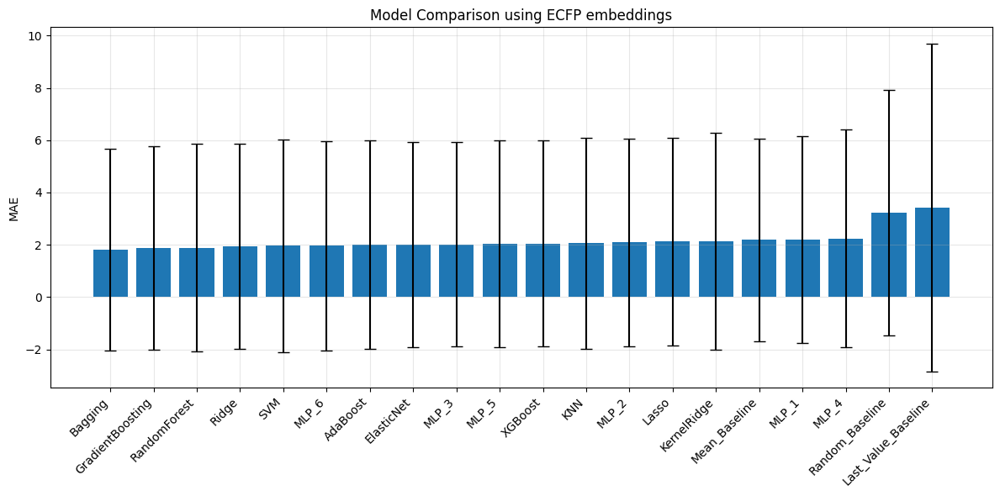

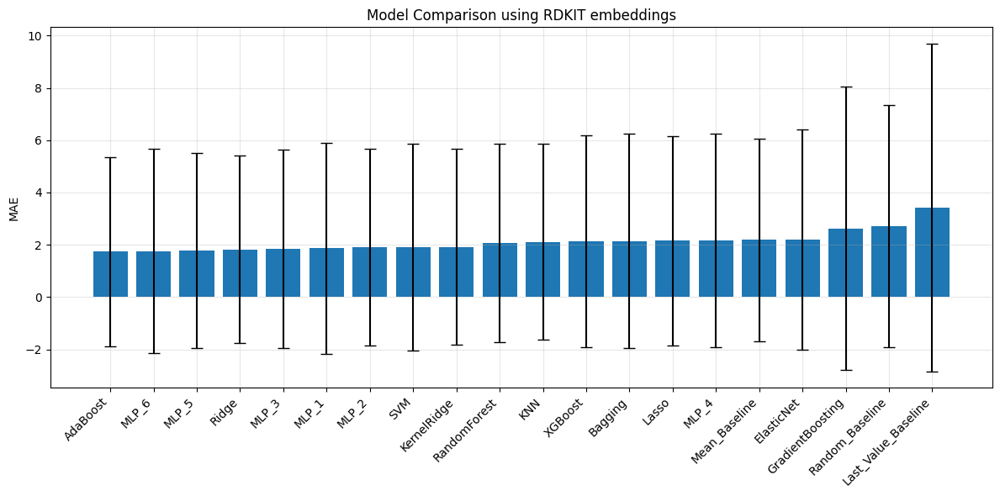

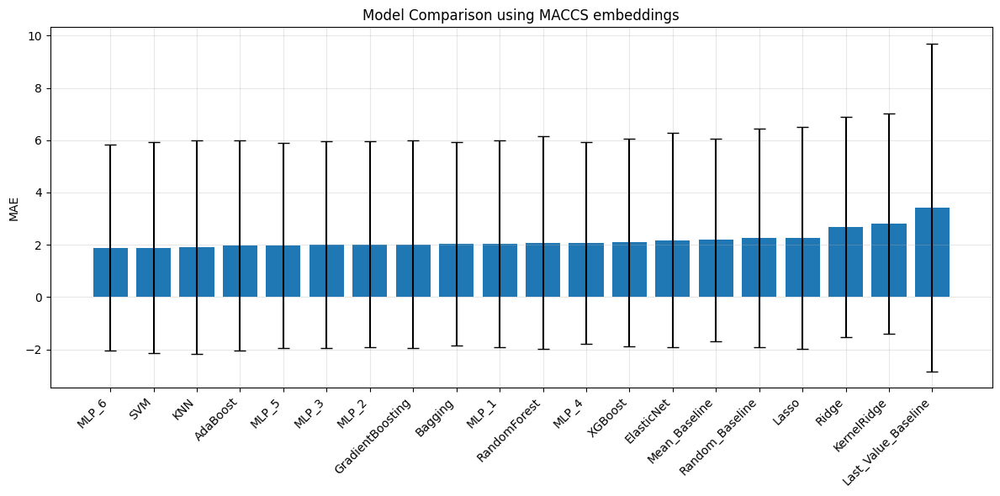

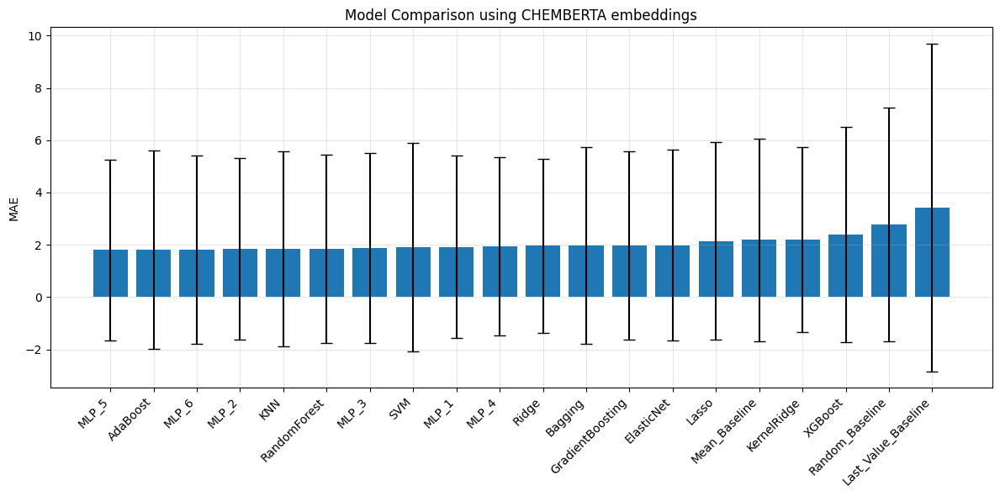


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  2.695863e+00  7.815232e+00    0.697655
MLP_6                2.721410e+00  6.600790e+00    1.280850
KNN                  2.861870e+00  7.230152e+00    0.950608
AdaBoost             2.999607e+00  7.327519e+00    1.523115
MLP_3                3.016598e+00  6.360776e+00    1.826683
ElasticNet           3.021569e+00  6.883648e+00    1.394364
RandomForest         3.034236e+00  7.472882e+00    0.868963
MLP_5                3.048101e+00  6.362346e+00    1.852894
MLP_2                3.080815e+00  6.227518e+00    1.945852
Ridge                3.083709e+00  6.561609e+00    1.577177
GradientBoo

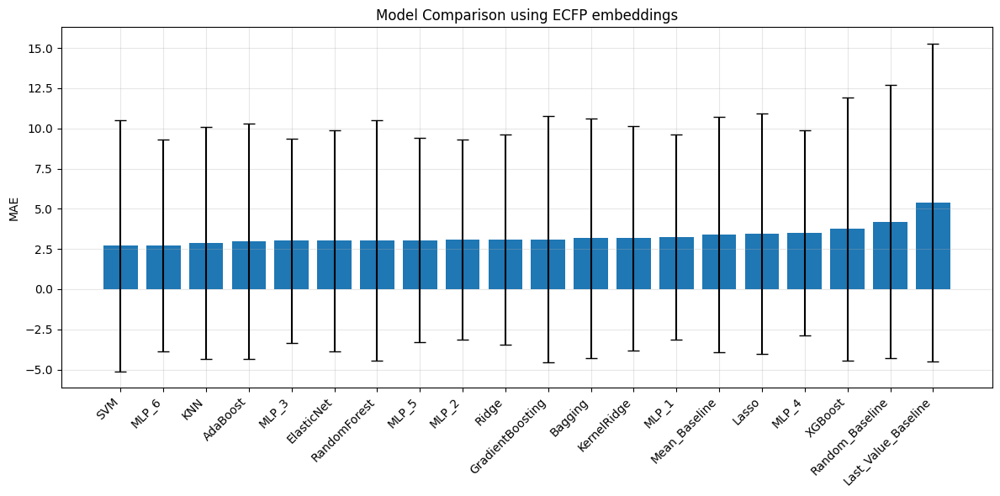

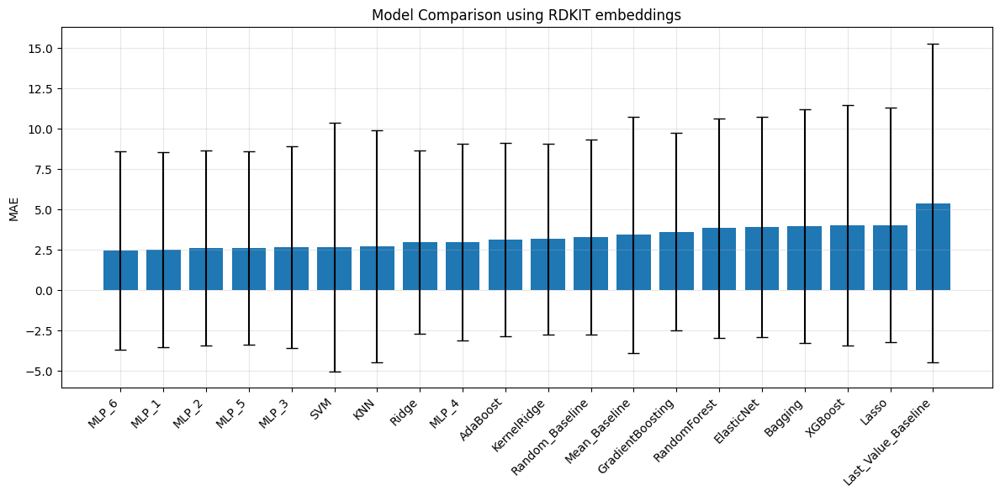

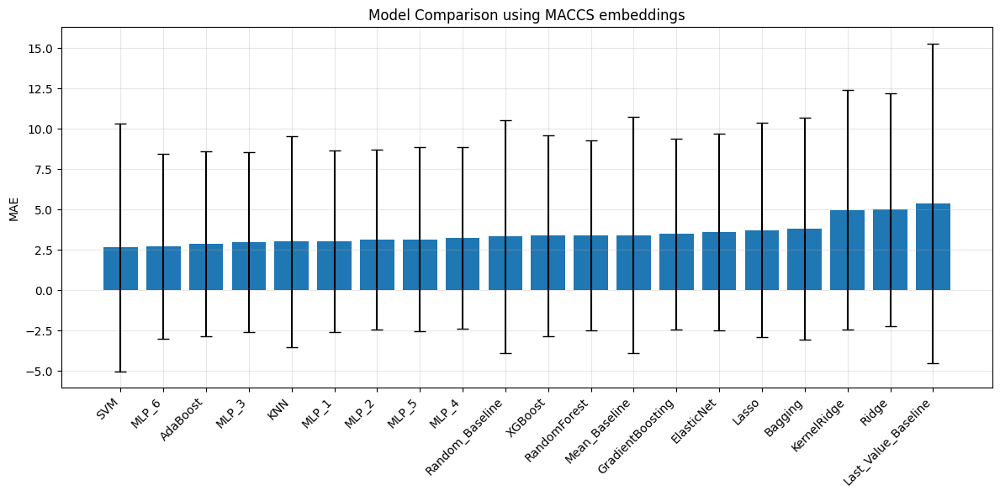

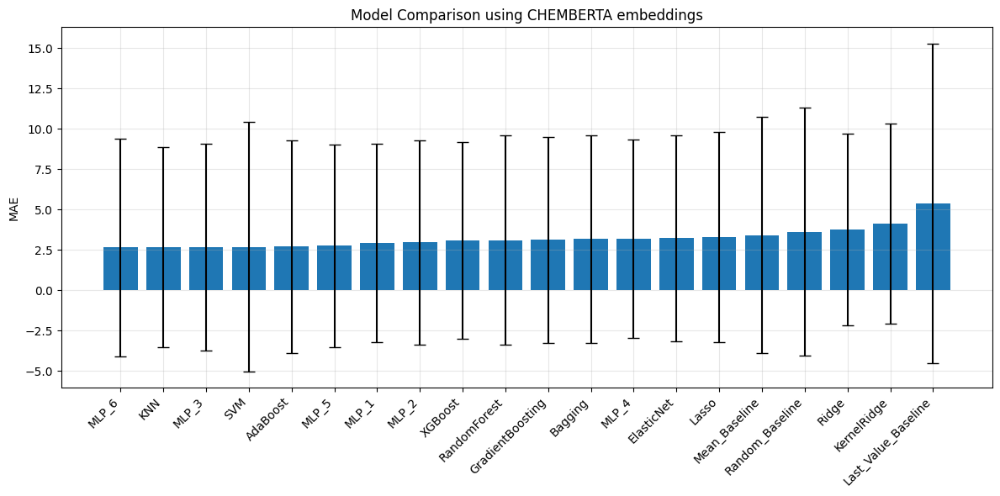


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
RandomForest         2.325347  7.581589    0.481290
SVM                  2.347381  7.896386    0.432109
Bagging              2.352713  7.586705    0.422637
GradientBoosting     2.377159  7.492865    0.533738
KNN                  2.390139  7.819310    0.550892
AdaBoost             2.401057  7.751642    0.794256
MLP_6                2.410189  7.437647    0.728747
Linear               2.437170  7.501146    0.709729
Ridge                2.443315  7.500013    0.701412
ElasticNet           2.491863  7.689515    0.884855
Spline               2.519637  7.409354    0.791932
XGBoost              2.550137  8.073063    0.41

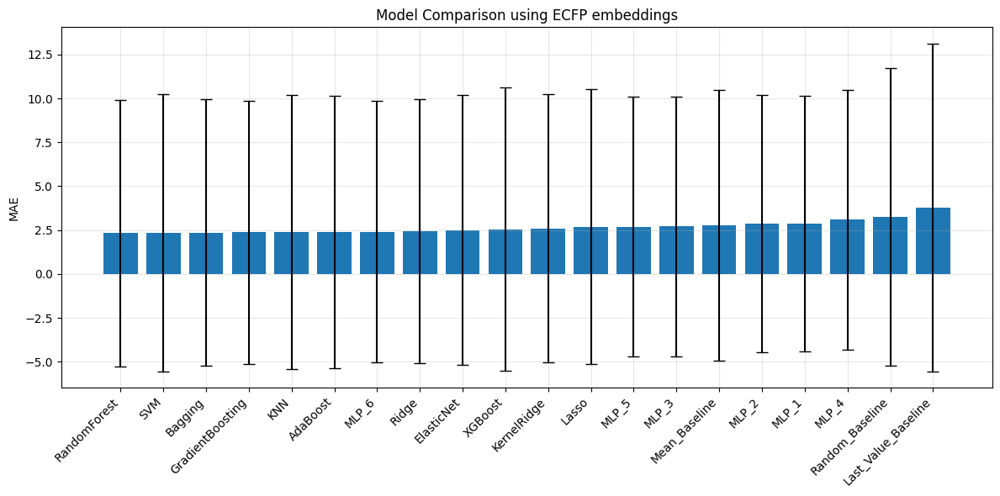

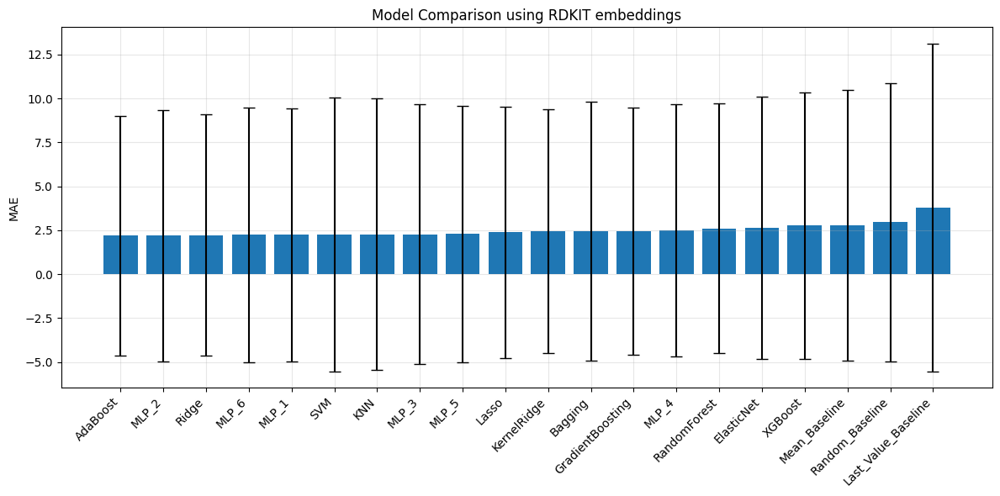

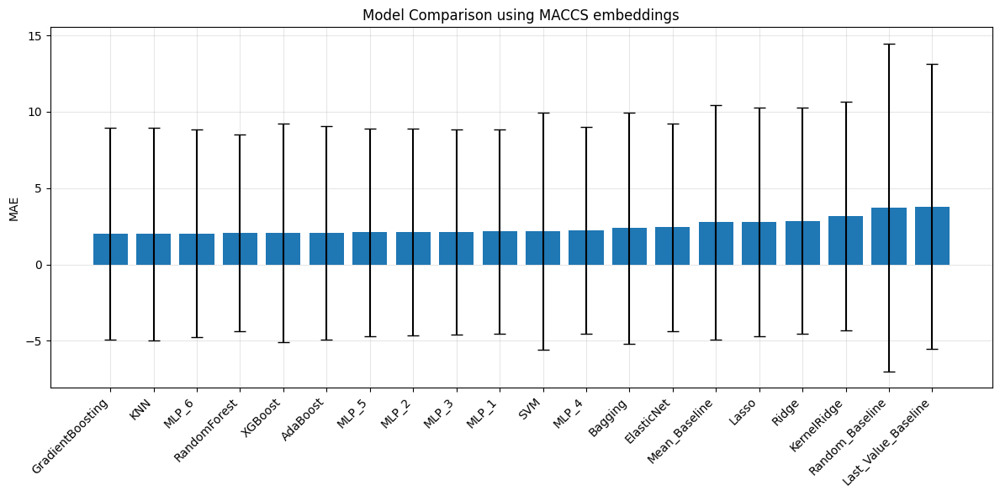

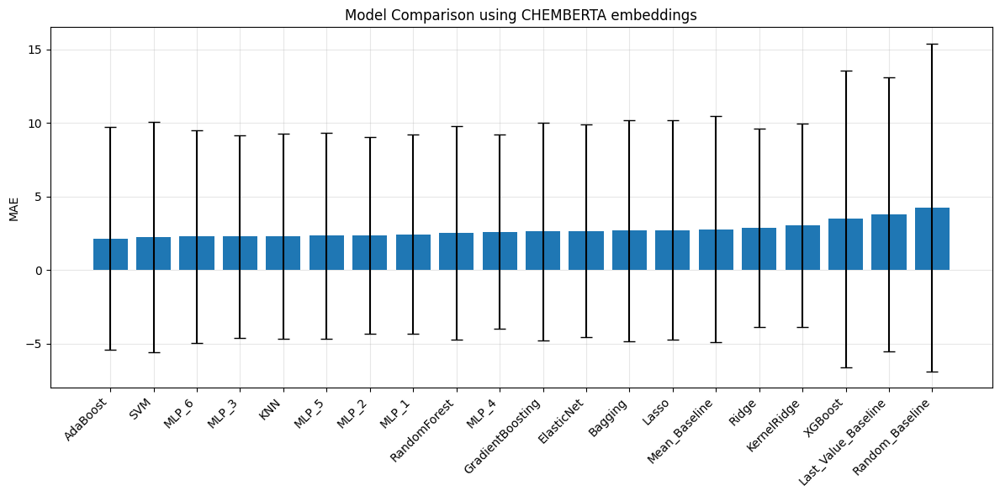


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
XGBoost              3.752312e-01  5.707884e-01    0.162640
GradientBoosting     3.861712e-01  4.523119e-01    0.252964
AdaBoost             3.980596e-01  4.191840e-01    0.312775
Bagging              4.145905e-01  4.968689e-01    0.261854
RandomForest         4.148913e-01  4.759231e-01    0.235730
KernelRidge          6.024144e-01  4.389422e-01    0.512569
Ridge                6.117542e-01  4.688252e-01    0.510719
MLP_6                6.358793e-01  4.925279e-01    0.566974
MLP_3                6.781058e-01  4.974294e-01    0.597337
MLP_2                6.960958e-01  4.760220e-01    0.656089
SVM        

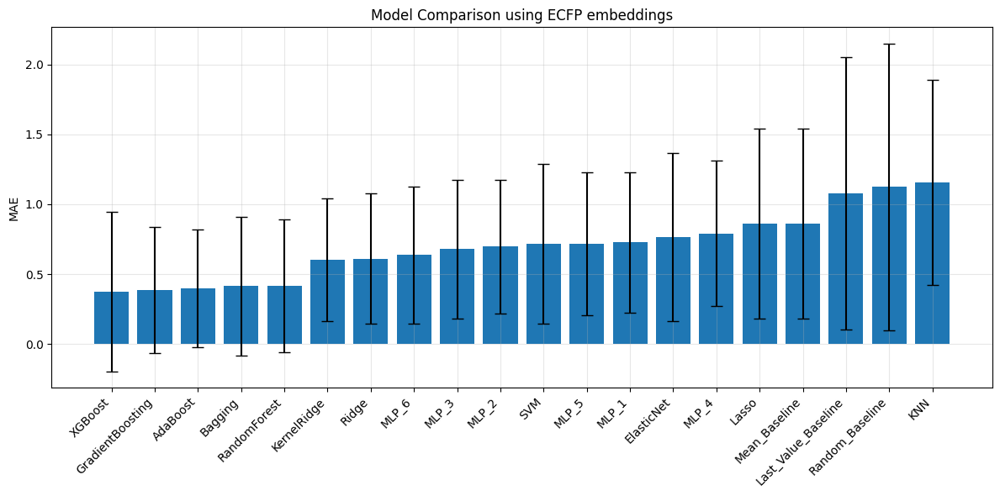

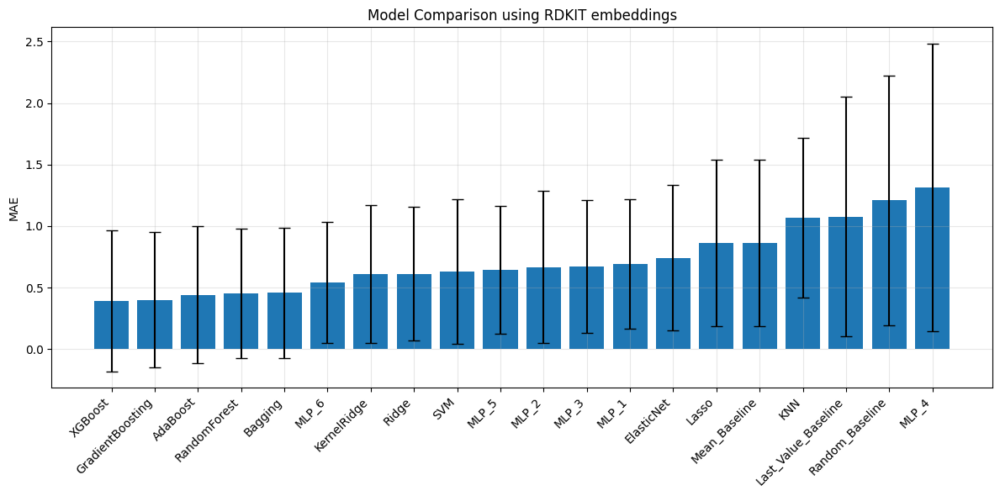

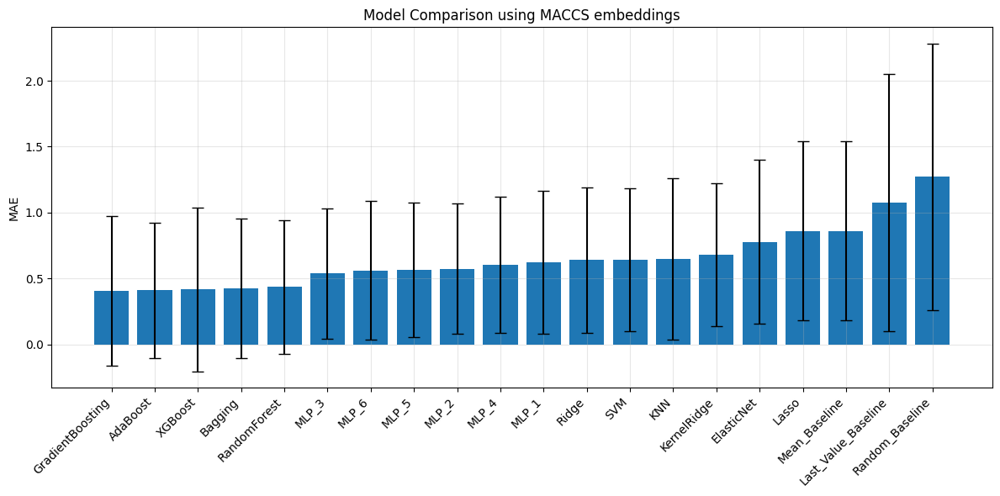

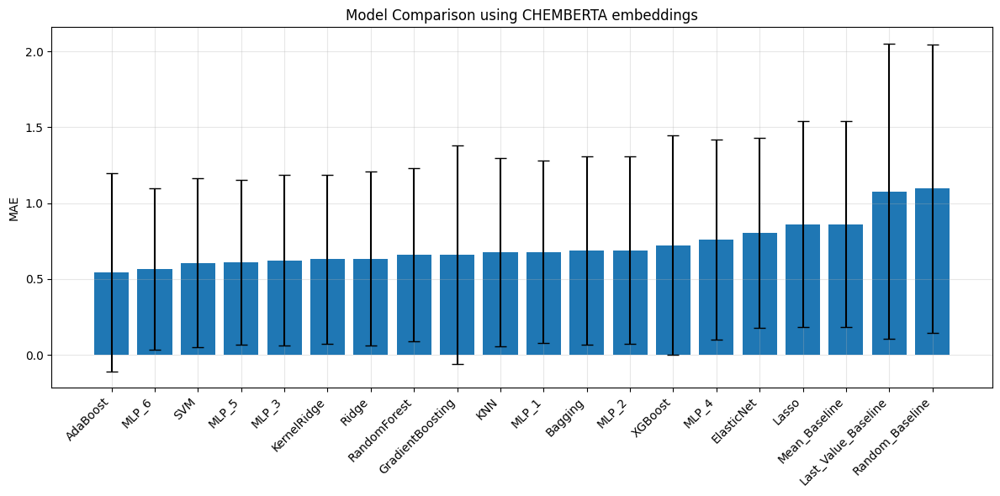


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Bagging              1.564385e+00  2.870618e+00    0.879012
GradientBoosting     1.573014e+00  2.914750e+00    0.861397
MLP_6                1.650592e+00  3.000816e+00    0.884598
RandomForest         1.651581e+00  2.919464e+00    0.835008
XGBoost              1.662798e+00  3.050151e+00    0.754862
SVM                  1.669788e+00  3.061254e+00    0.761468
Ridge                1.683577e+00  2.956708e+00    0.991683
MLP_5                1.684463e+00  2.895195e+00    1.001059
MLP_3                1.702650e+00  2.974125e+00    0.929414
AdaBoost             1.705034e+00  2.978461e+00    0.874286
MLP_2      

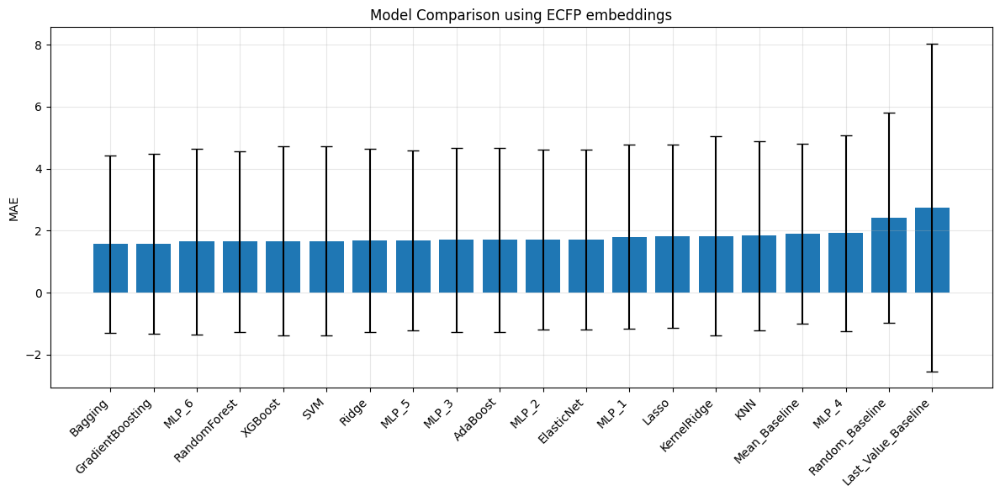

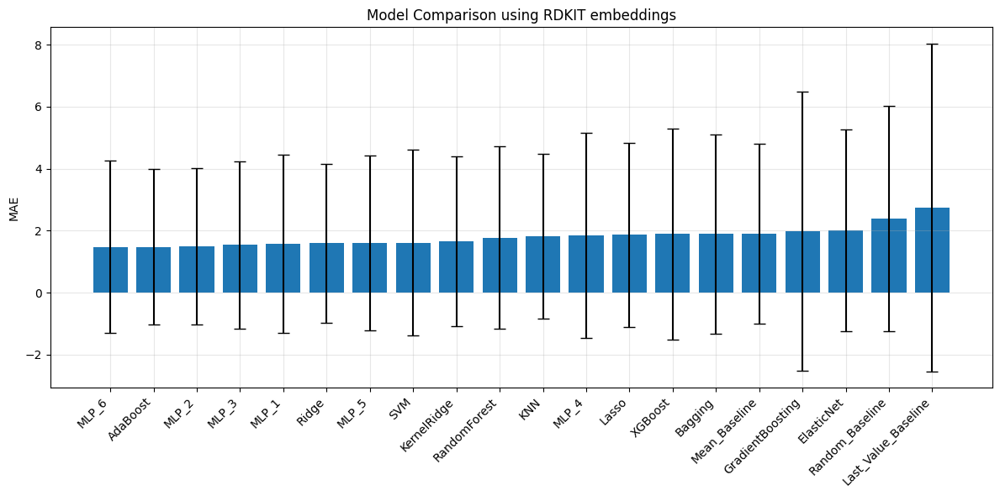

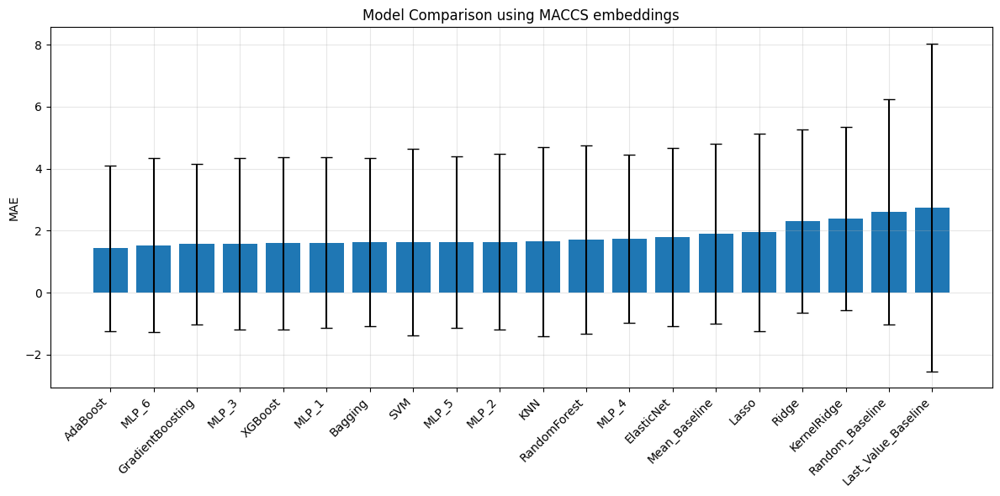

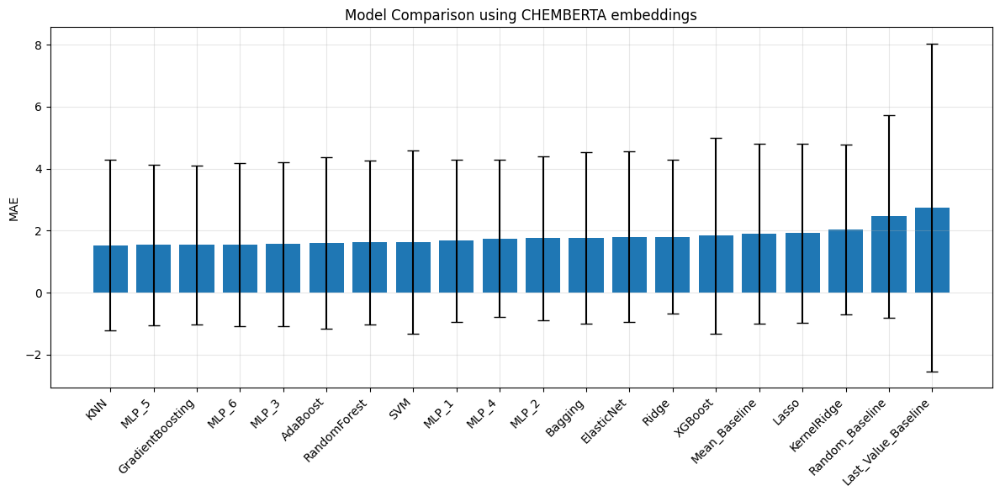


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  1.603100e+00  2.715712e+00    0.579583
RandomForest         1.609236e+00  2.650753e+00    0.558944
GradientBoosting     1.630691e+00  2.703759e+00    0.607397
XGBoost              1.659266e+00  2.522333e+00    0.580023
Bagging              1.723153e+00  2.709556e+00    0.640117
AdaBoost             1.780349e+00  2.755767e+00    1.013603
MLP_6                1.789473e+00  2.347054e+00    1.009521
KernelRidge          1.824339e+00  2.565047e+00    1.001840
ElasticNet           1.827469e+00  2.329428e+00    1.191250
Ridge                1.898013e+00  2.333121e+00    1.259710
Lasso      

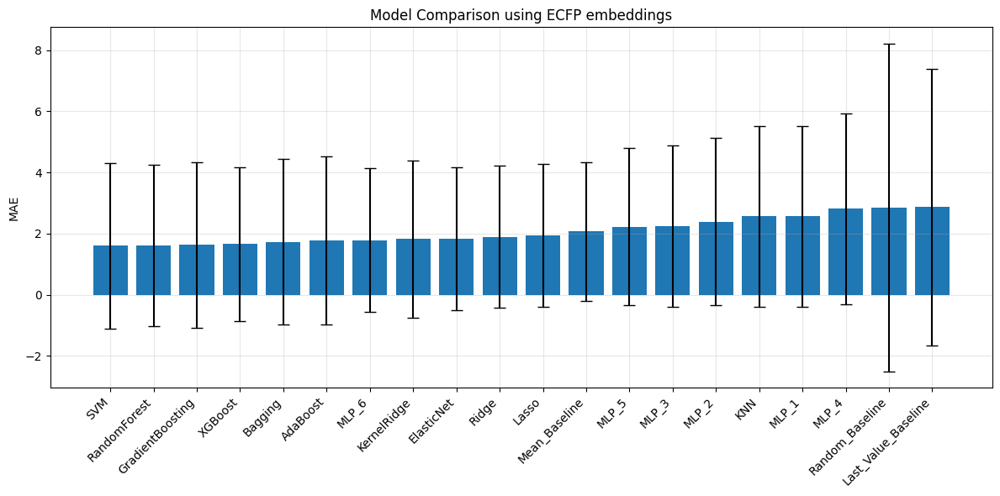

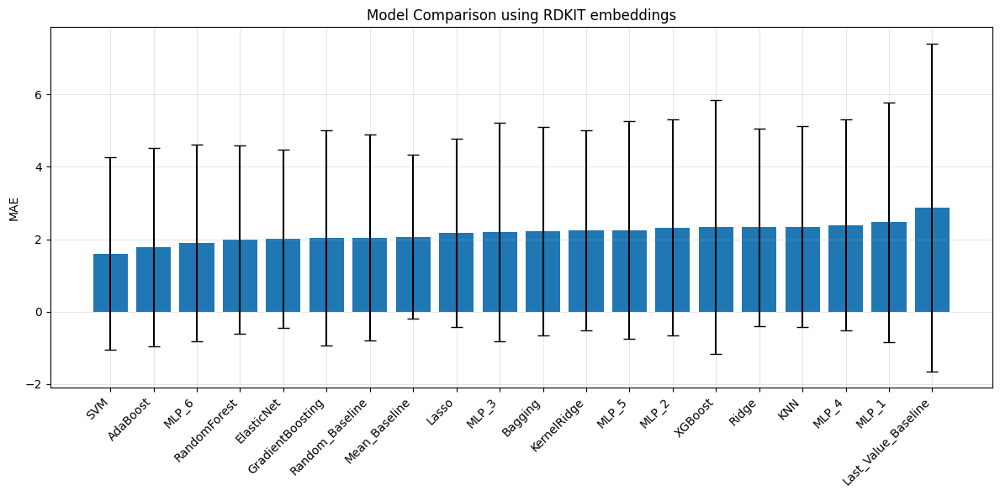

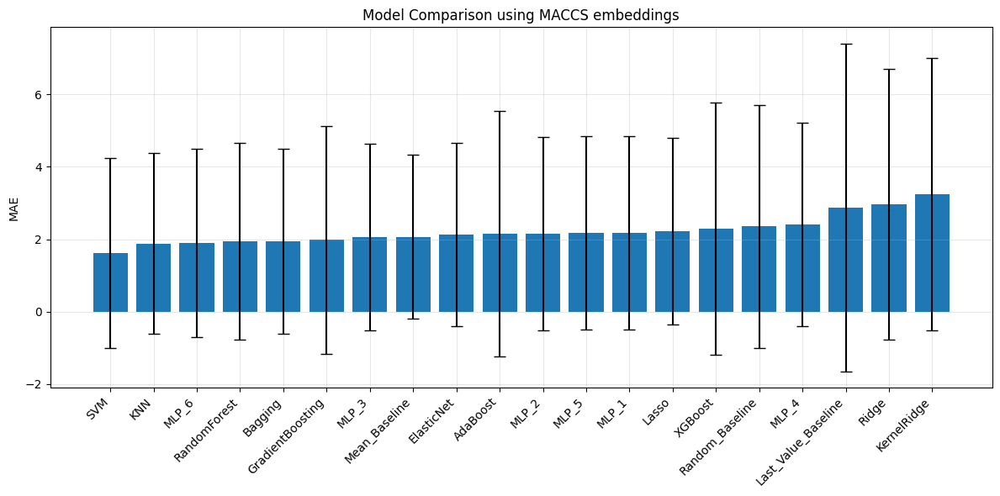

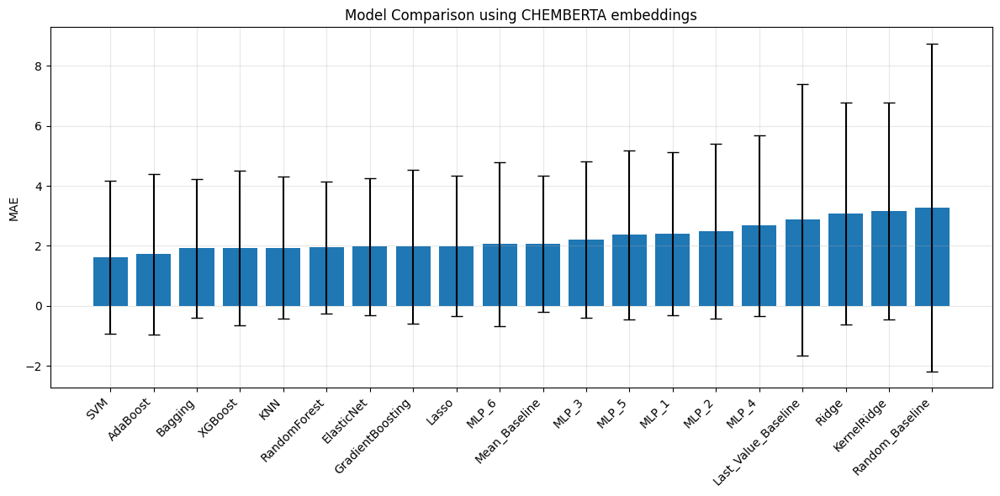


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Bagging              2.165096e+00  4.064233e+00    0.846605
RandomForest         2.244667e+00  4.412465e+00    0.962179
GradientBoosting     2.261918e+00  4.271804e+00    0.862198
AdaBoost             2.271719e+00  4.466792e+00    0.842929
MLP_6                2.271958e+00  4.545833e+00    0.866426
Ridge                2.358548e+00  4.299810e+00    1.096430
ElasticNet           2.371405e+00  4.344186e+00    1.036412
XGBoost              2.375721e+00  4.543159e+00    0.827718
MLP_3                2.402984e+00  4.333587e+00    1.104809
MLP_5                2.431910e+00  4.363335e+00    1.201498
SVM        

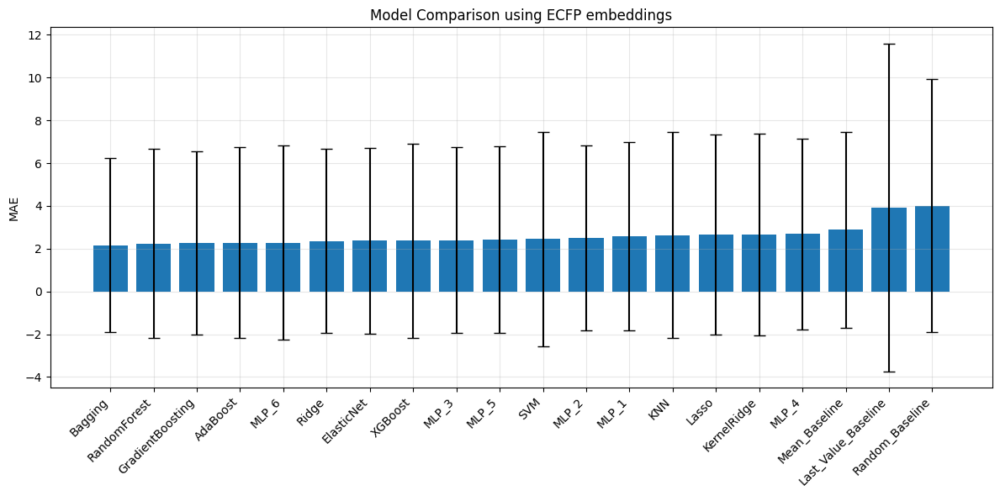

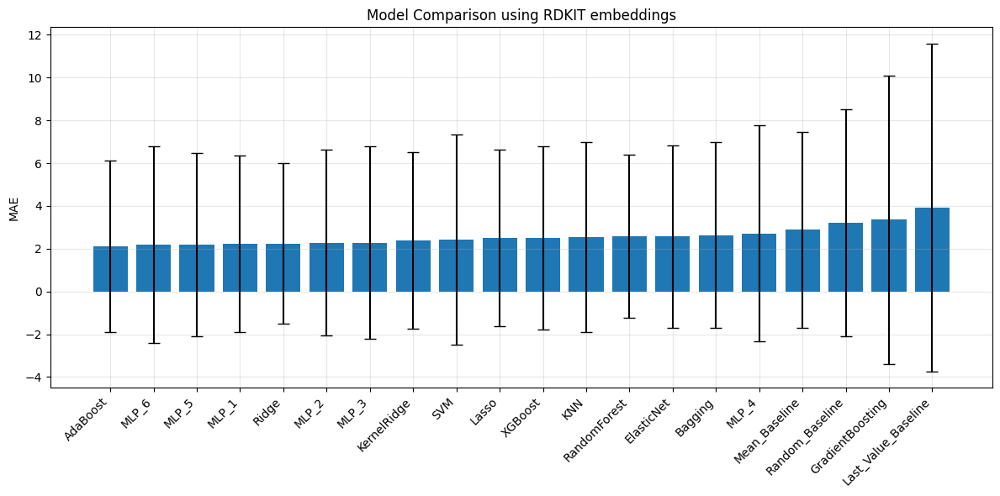

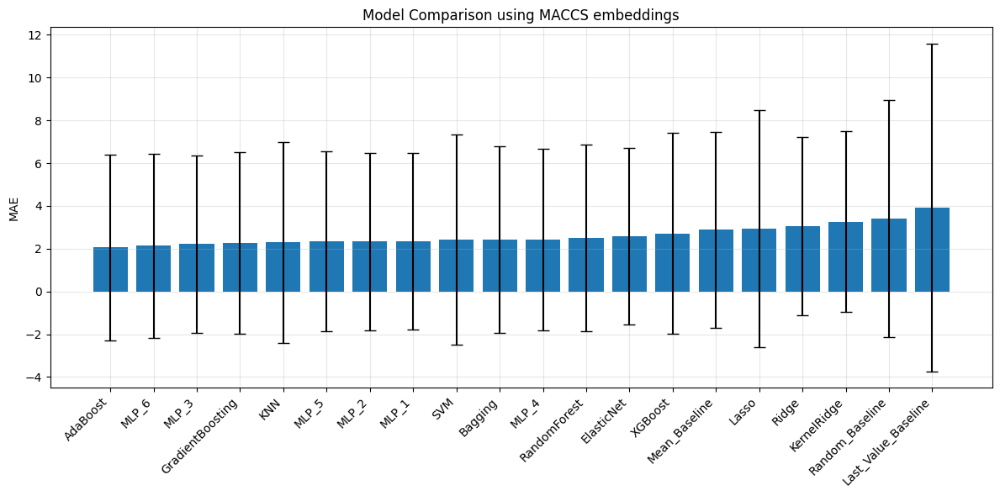

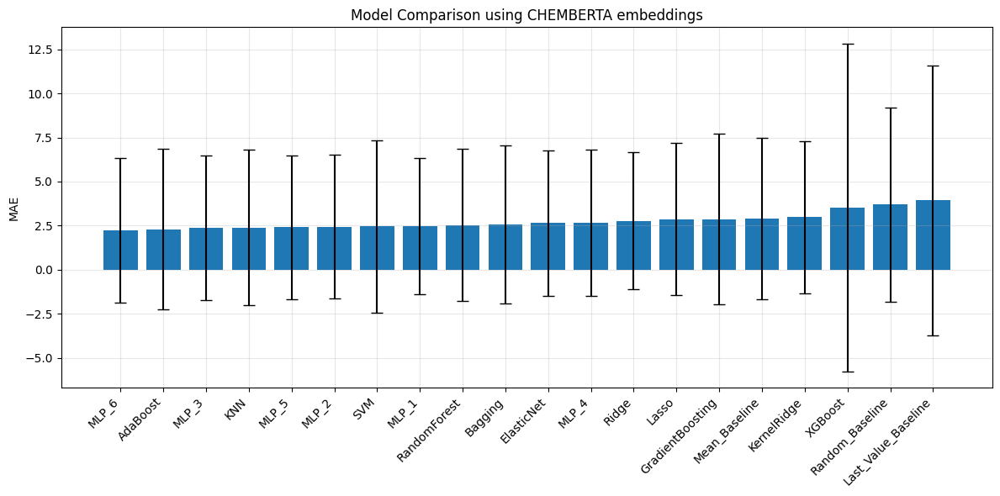


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
RandomForest         1.351857  2.064499    0.651123
Bagging              1.394161  2.032194    0.701577
SVM                  1.409071  2.096366    0.692407
AdaBoost             1.448687  1.923986    0.935863
GradientBoosting     1.479468  2.056575    0.839661
MLP_6                1.485766  1.987653    0.900385
ElasticNet           1.499436  1.912216    1.098373
KernelRidge          1.502755  2.261788    0.649121
XGBoost              1.533945  2.139599    0.728528
Linear               1.534700  1.979619    0.979143
Ridge                1.537583  1.978811    0.969154
Spline               1.545462  1.968212    0.96

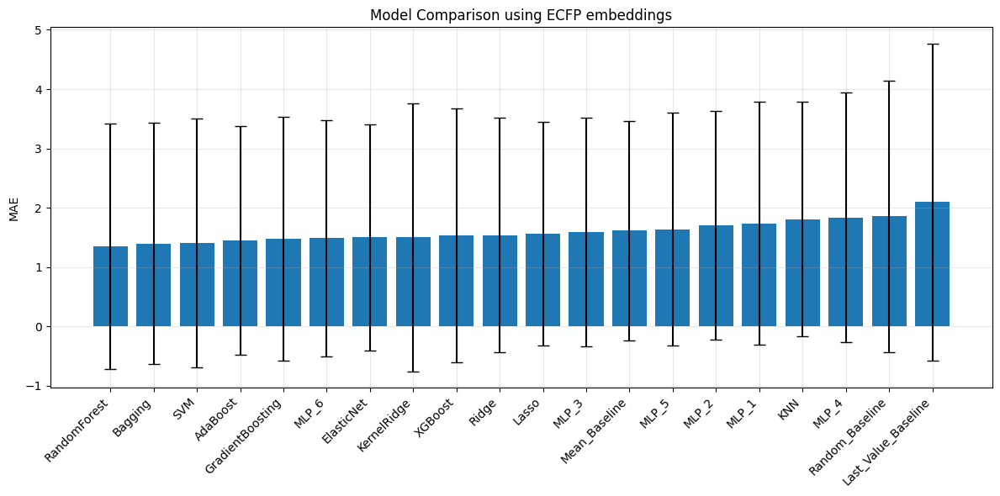

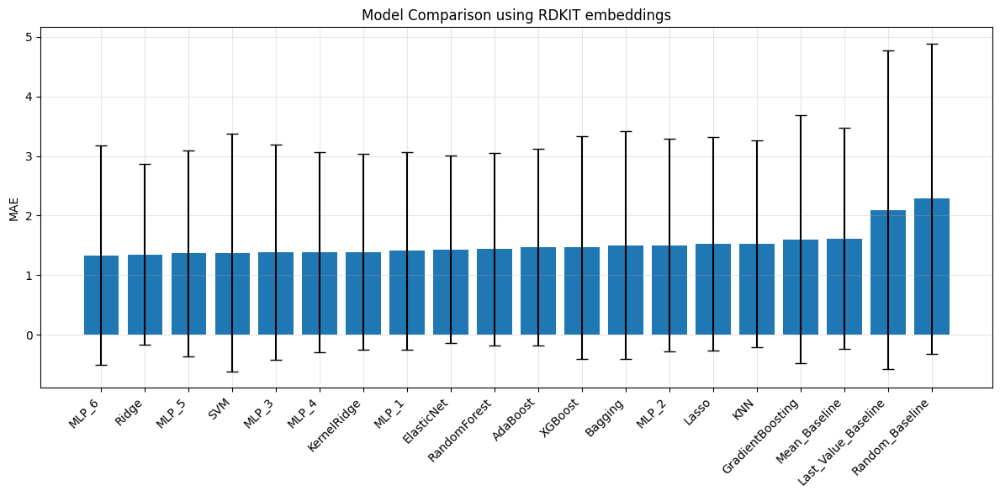

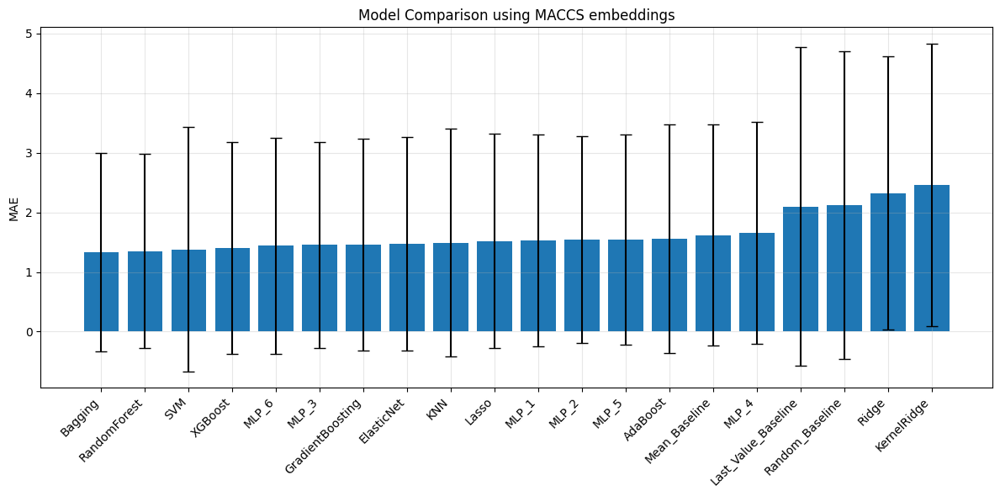

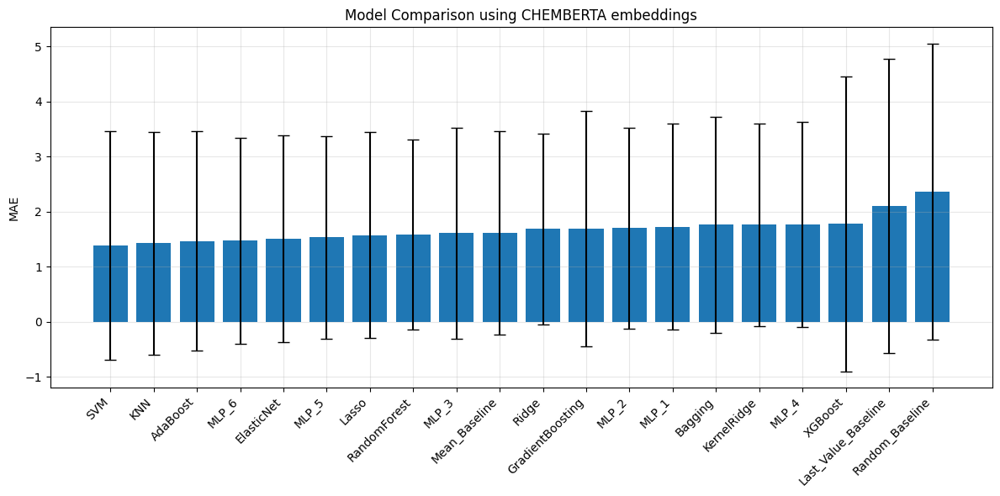


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  1.135573e+00  1.281836e+00    0.786584
KernelRidge          1.144453e+00  1.389512e+00    0.613280
MLP_6                1.185911e+00  1.313891e+00    0.824022
RandomForest         1.186959e+00  1.406100e+00    0.739210
GradientBoosting     1.190292e+00  1.456594e+00    0.709390
Ridge                1.197882e+00  1.325024e+00    0.743655
Bagging              1.198900e+00  1.459516e+00    0.699980
MLP_3                1.207161e+00  1.283338e+00    0.827777
ElasticNet           1.244956e+00  1.304412e+00    0.856543
Lasso                1.253715e+00  1.271506e+00    0.921287
Mean_Baseli

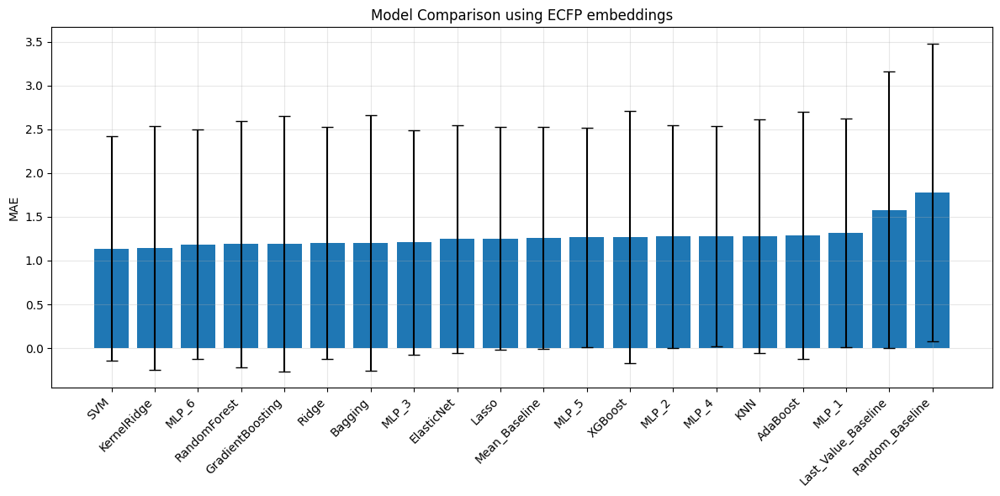

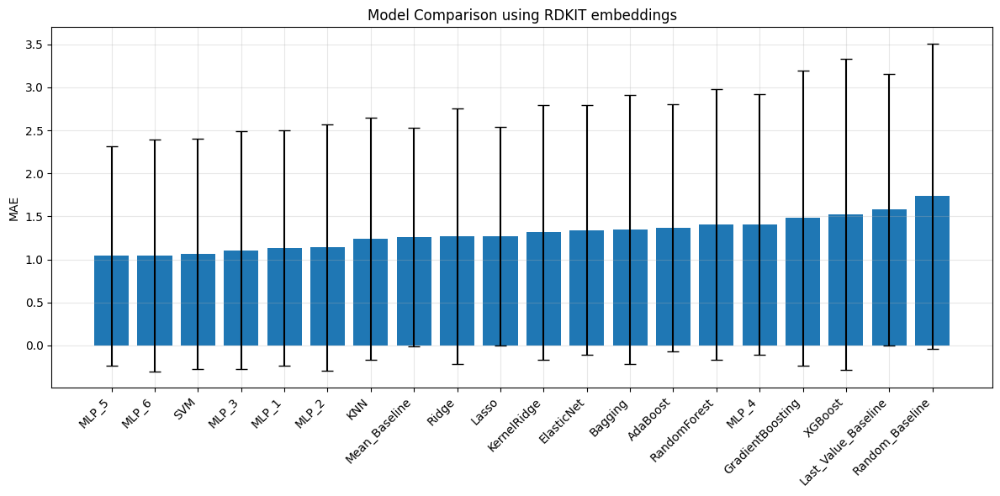

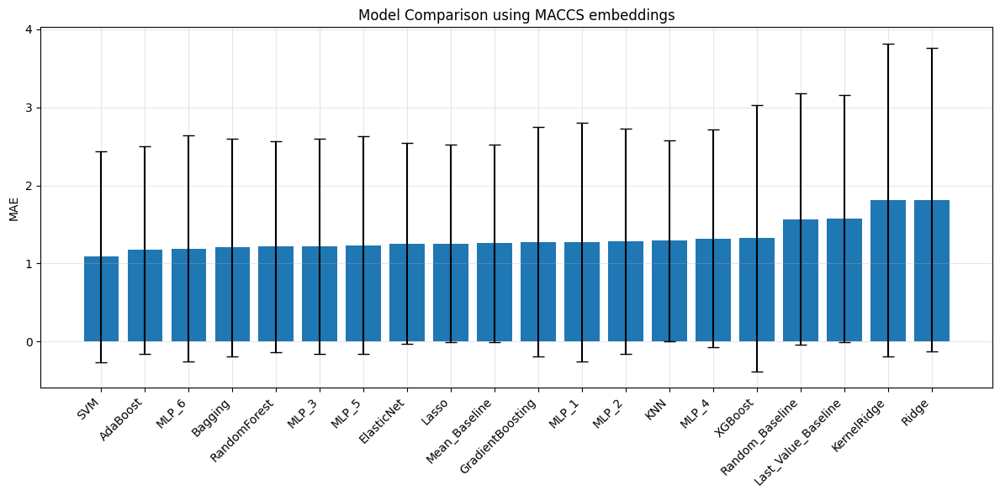

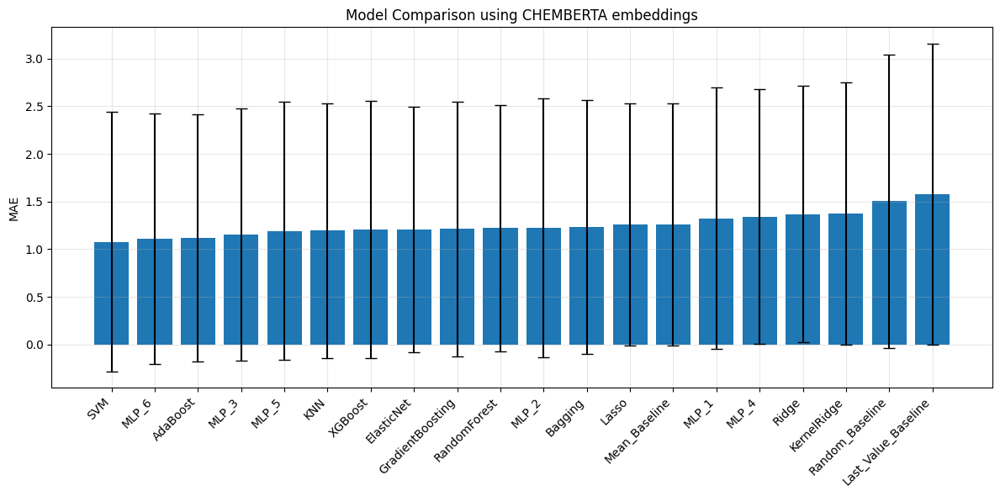


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  7.531498e-01  5.598579e-01    0.619226
Lasso                7.774842e-01  5.904737e-01    0.664239
Mean_Baseline        7.811530e-01  5.898240e-01    0.658283
ElasticNet           7.918884e-01  5.942411e-01    0.723898
AdaBoost             8.147437e-01  6.295146e-01    0.682433
MLP_6                8.188544e-01  5.747922e-01    0.733081
MLP_3                8.212446e-01  5.974790e-01    0.671310
RandomForest         8.247398e-01  6.575131e-01    0.703141
Bagging              8.482884e-01  6.893203e-01    0.701560
KernelRidge          8.510461e-01  6.924353e-01    0.693729
MLP_5      

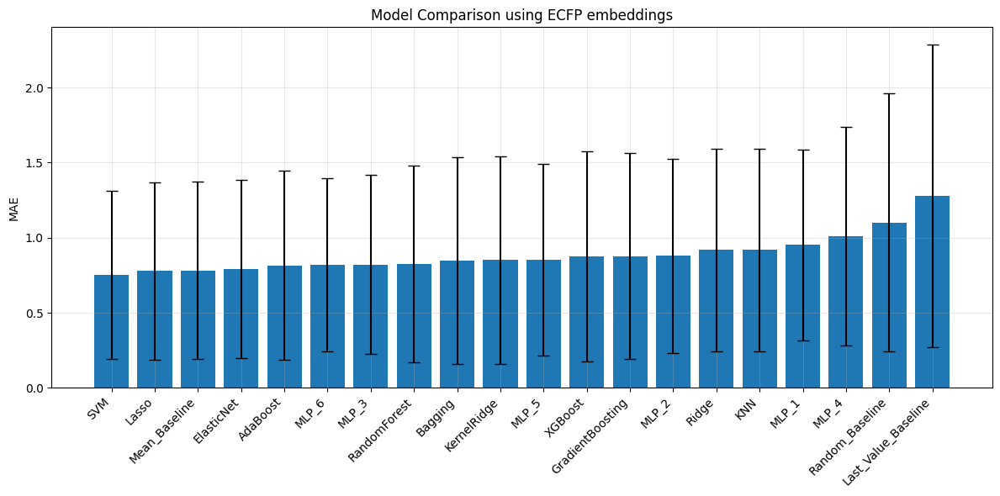

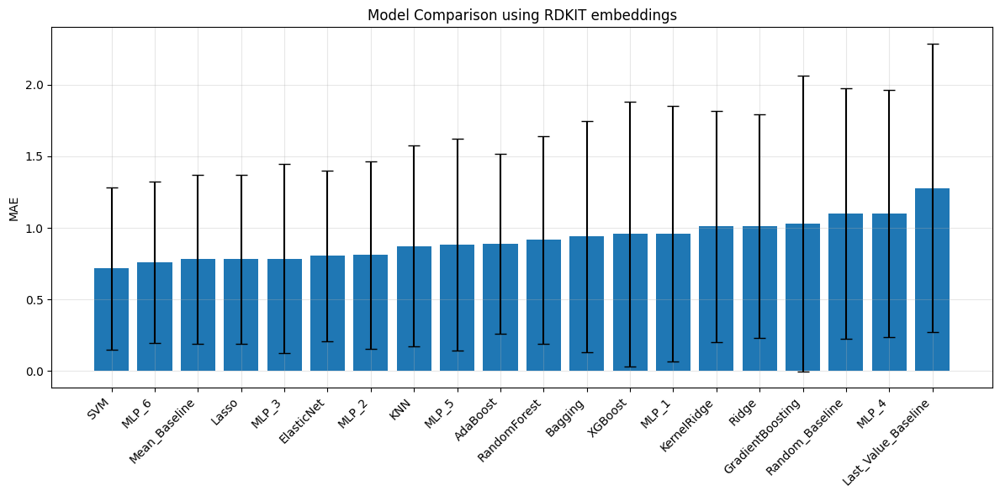

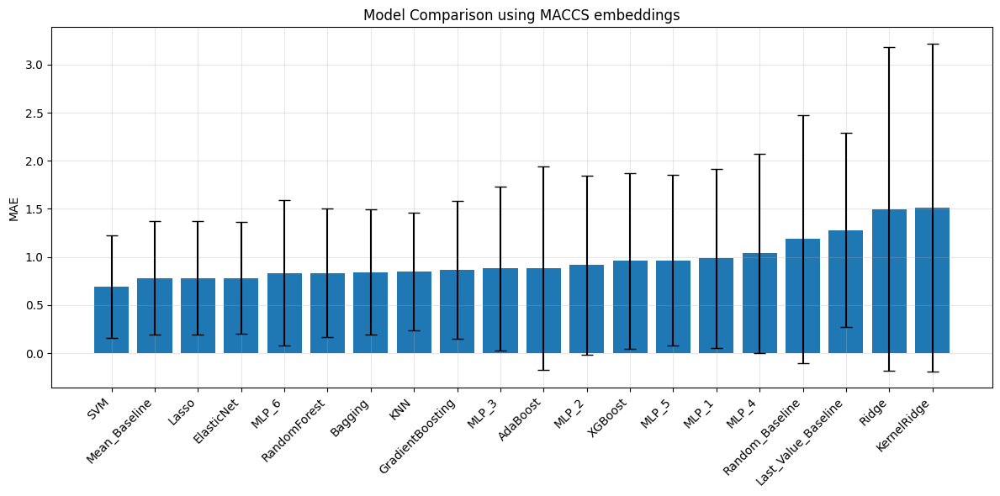

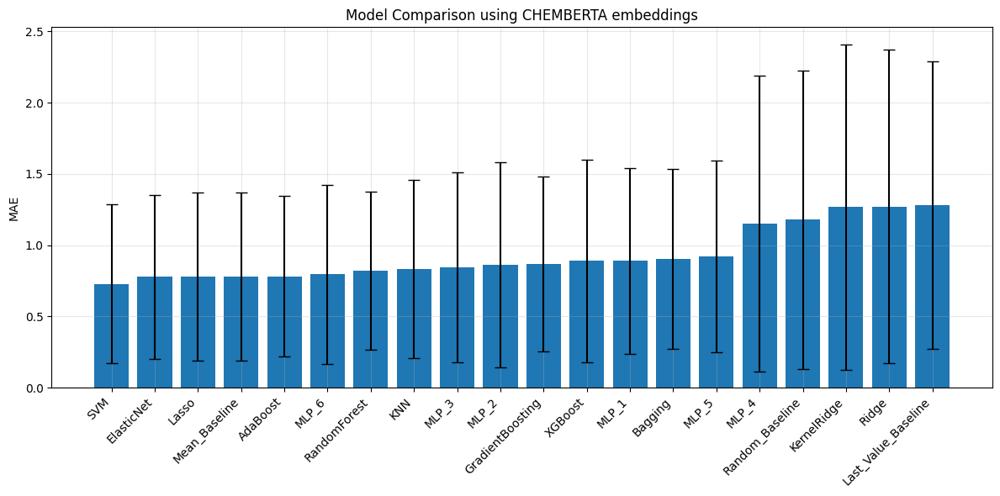


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
Bagging              1.457234  1.961288    0.635425
MLP_6                1.509976  1.780768    0.960674
RandomForest         1.538778  1.963114    0.910433
SVM                  1.540524  2.072618    0.833435
KernelRidge          1.552186  1.969552    1.078642
GradientBoosting     1.554278  1.991971    0.743501
XGBoost              1.576439  2.230199    0.653061
MLP_3                1.583934  1.750001    1.078615
Spline               1.587456  1.782417    0.851735
AdaBoost             1.590934  1.988181    0.929821
KNN                  1.592009  2.014862    0.954651
MLP_2                1.594149  1.655333    1.10

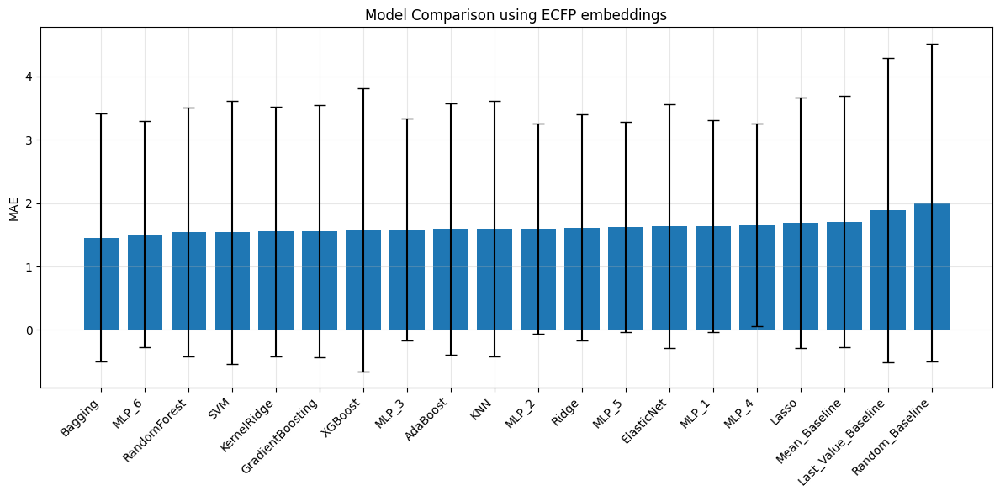

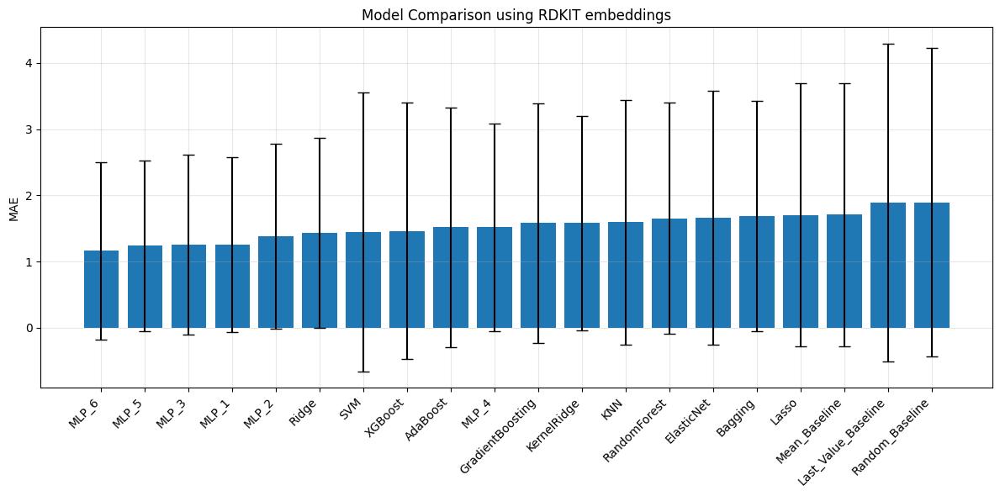

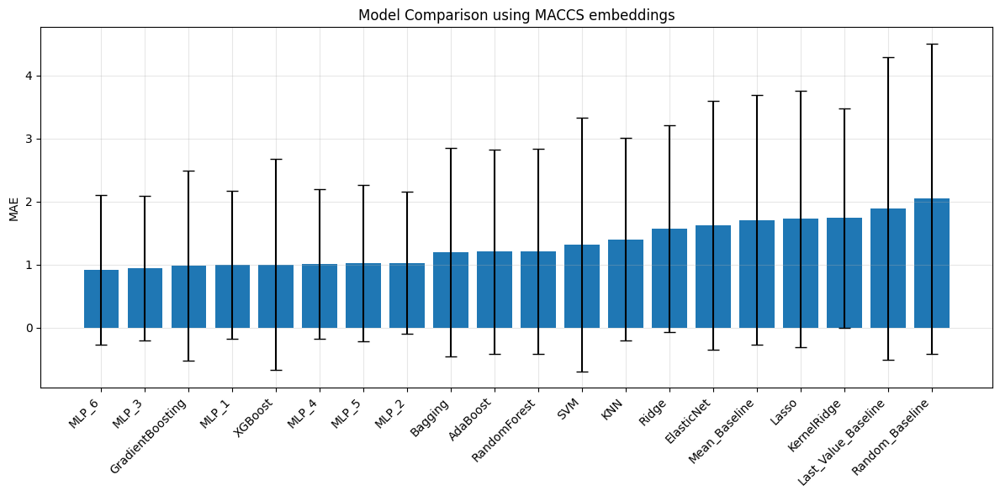

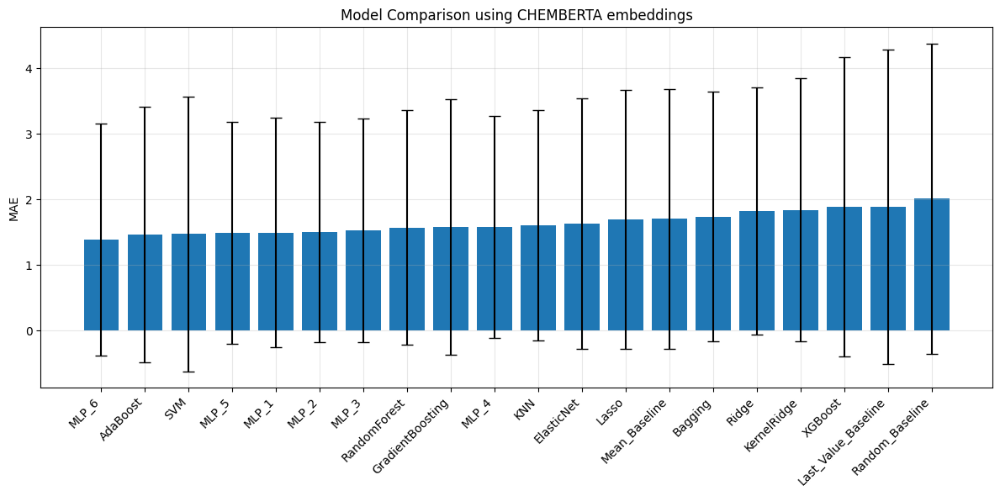


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Bagging              5.128740e-01  6.119709e-01    0.300731
RandomForest         5.140873e-01  5.508036e-01    0.377299
GradientBoosting     5.380182e-01  5.912400e-01    0.340018
XGBoost              6.383642e-01  1.187504e+00    0.317143
AdaBoost             6.385391e-01  5.276717e-01    0.502039
SVM                  6.575844e-01  7.542518e-01    0.415721
Ridge                6.642228e-01  6.341497e-01    0.507771
MLP_2                6.709046e-01  5.971927e-01    0.564696
MLP_6                6.769212e-01  6.789787e-01    0.448567
KernelRidge          6.816259e-01  7.522073e-01    0.380404
MLP_3      

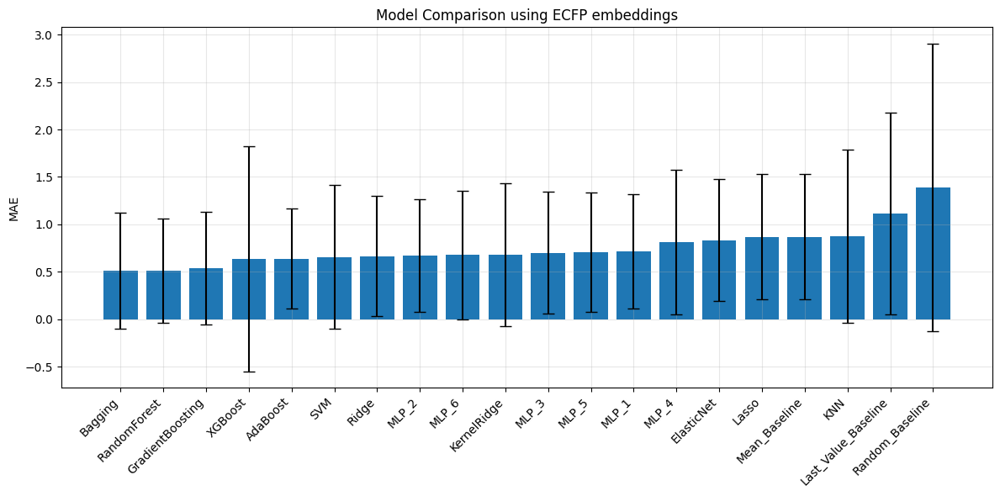

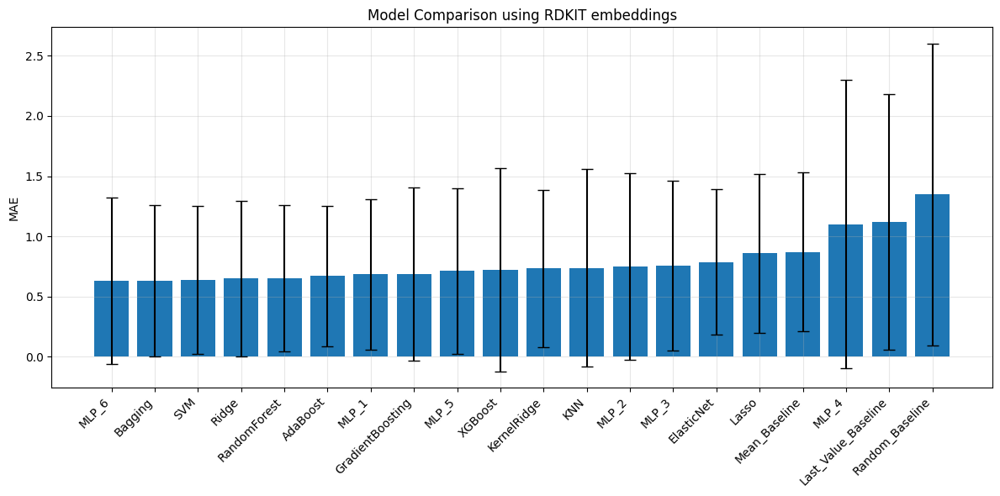

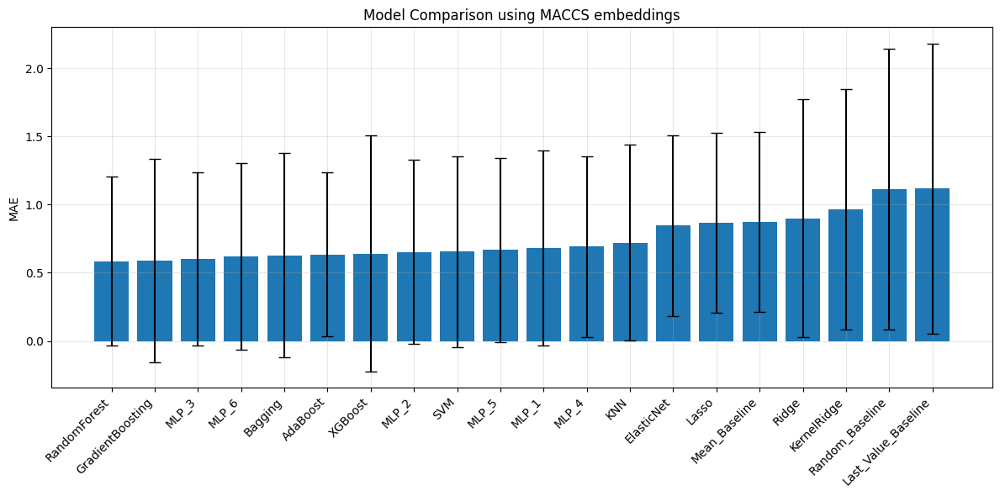

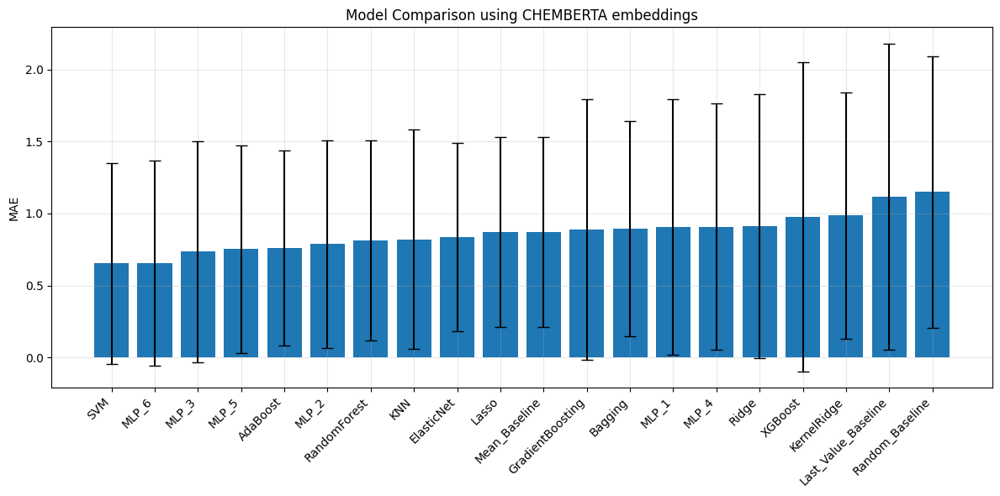


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
KernelRidge          9.745045e-01  1.296766e+00    0.594872
GradientBoosting     9.974370e-01  1.289951e+00    0.692365
Ridge                1.000533e+00  1.256505e+00    0.668301
MLP_5                1.004408e+00  1.244630e+00    0.713483
SVM                  1.004801e+00  1.278342e+00    0.752195
RandomForest         1.012921e+00  1.308191e+00    0.660534
MLP_6                1.017916e+00  1.261773e+00    0.790531
Bagging              1.018645e+00  1.315264e+00    0.618037
MLP_3                1.033284e+00  1.259491e+00    0.683379
MLP_2                1.066767e+00  1.239349e+00    0.831243
MLP_1      

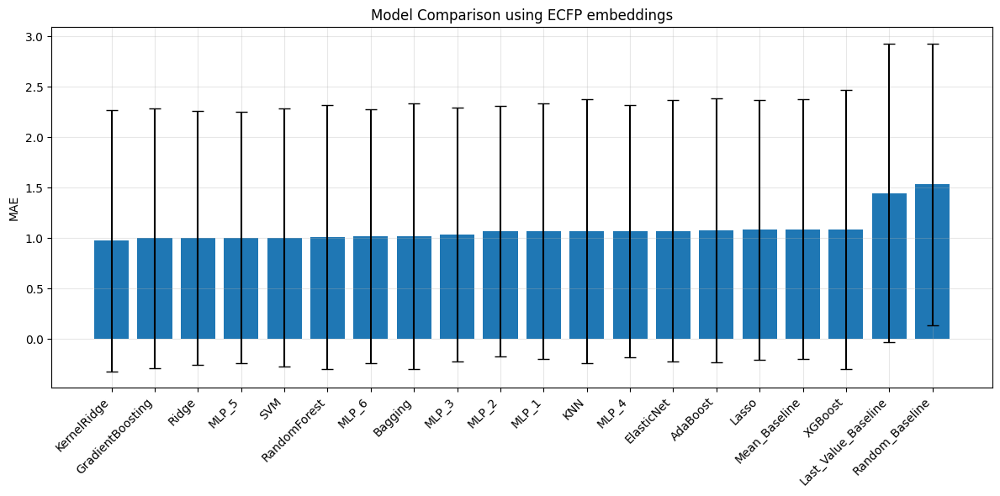

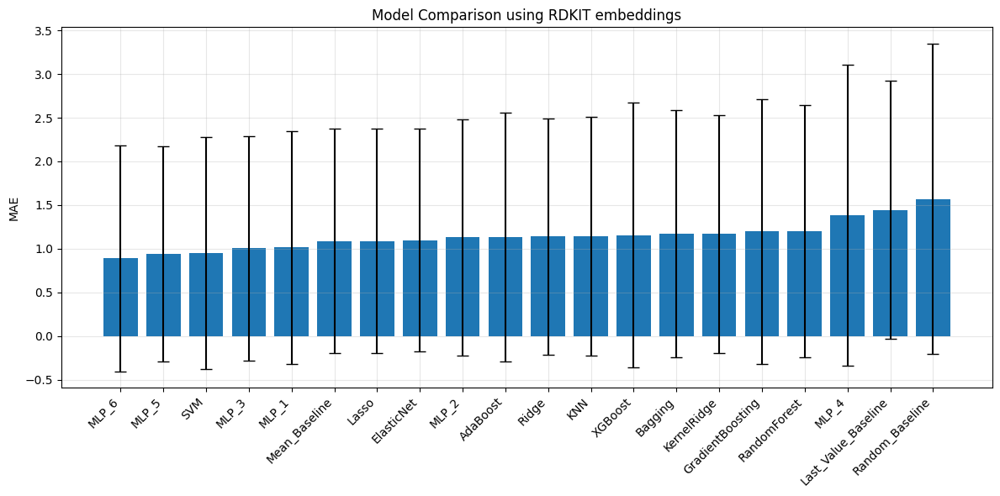

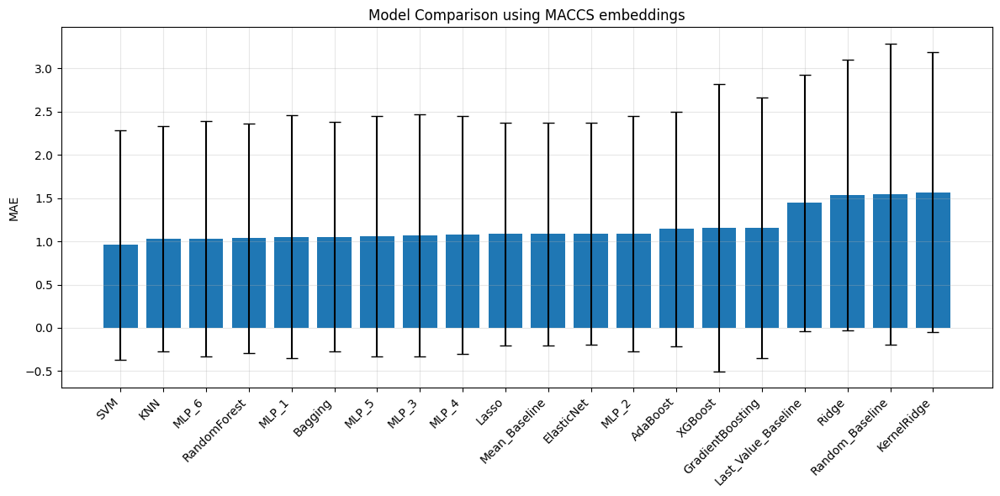

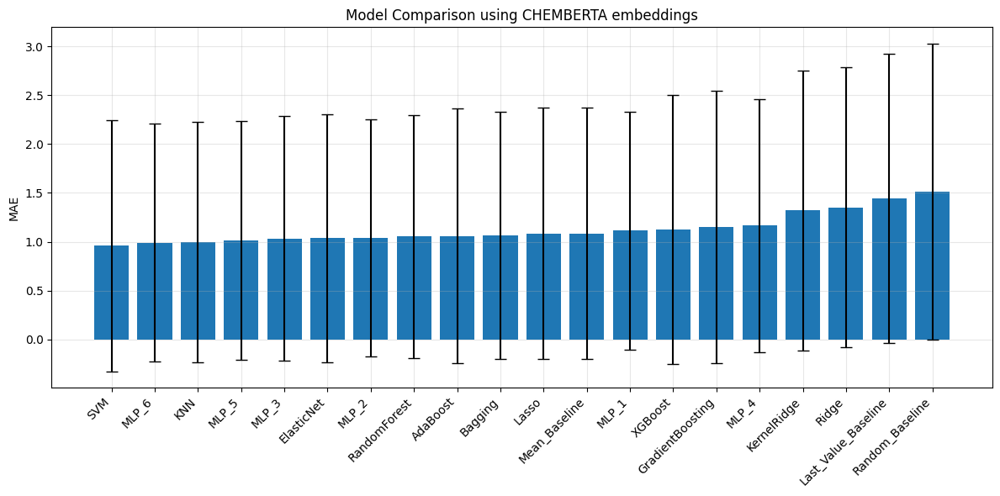


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
KernelRidge          7.989742e-01  7.720823e-01    0.584347
Bagging              8.069069e-01  7.406936e-01    0.569937
SVM                  8.181027e-01  6.691958e-01    0.710651
MLP_6                8.258977e-01  7.676401e-01    0.607364
Ridge                8.275517e-01  7.502696e-01    0.597769
RandomForest         8.311927e-01  6.993042e-01    0.633785
XGBoost              8.482885e-01  7.159101e-01    0.707417
MLP_3                8.518122e-01  7.558900e-01    0.718178
GradientBoosting     8.541591e-01  6.857614e-01    0.708378
AdaBoost             8.576751e-01  7.032776e-01    0.680037
KNN        

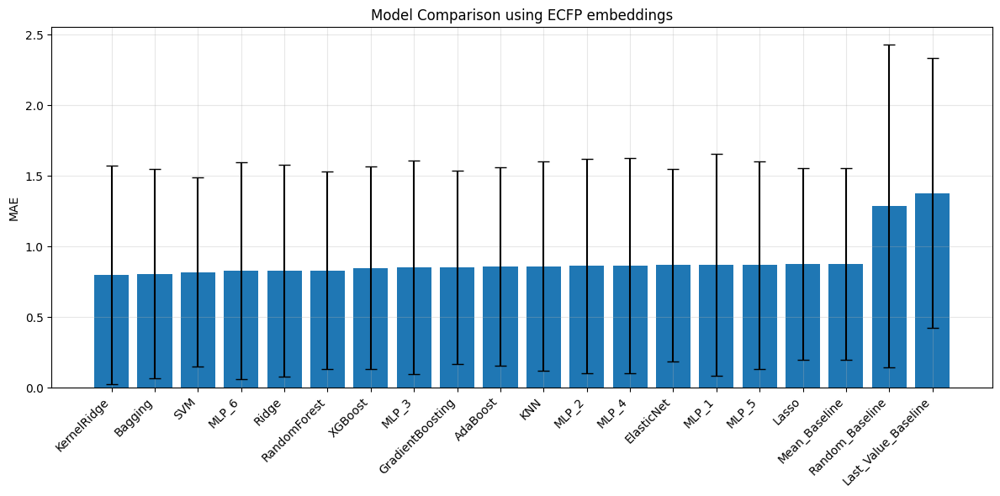

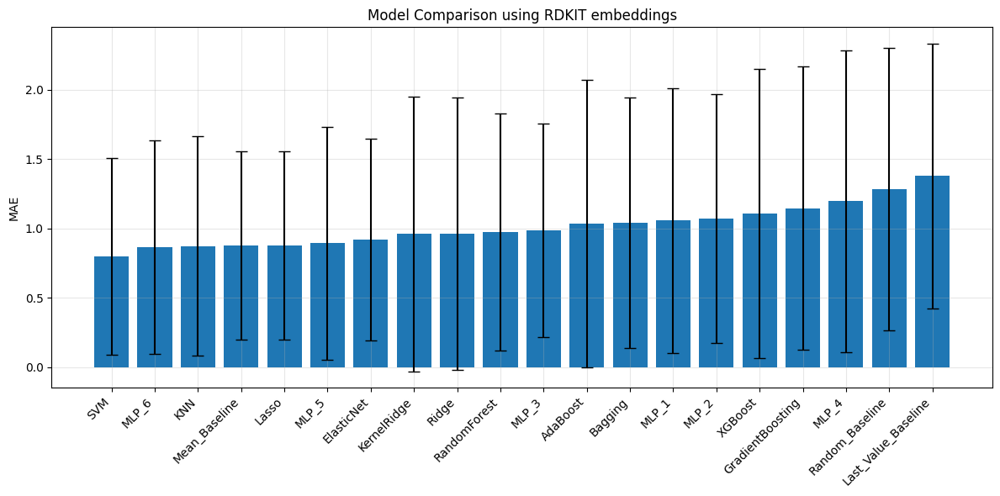

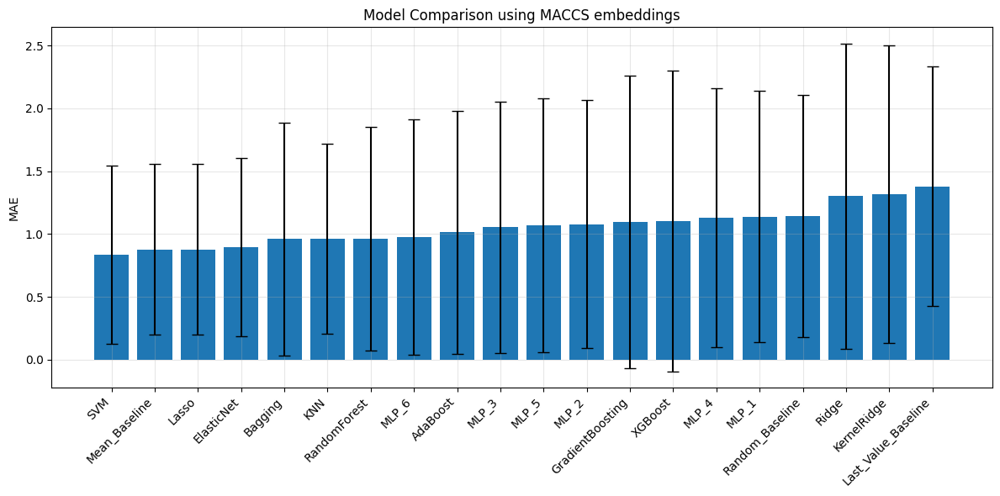

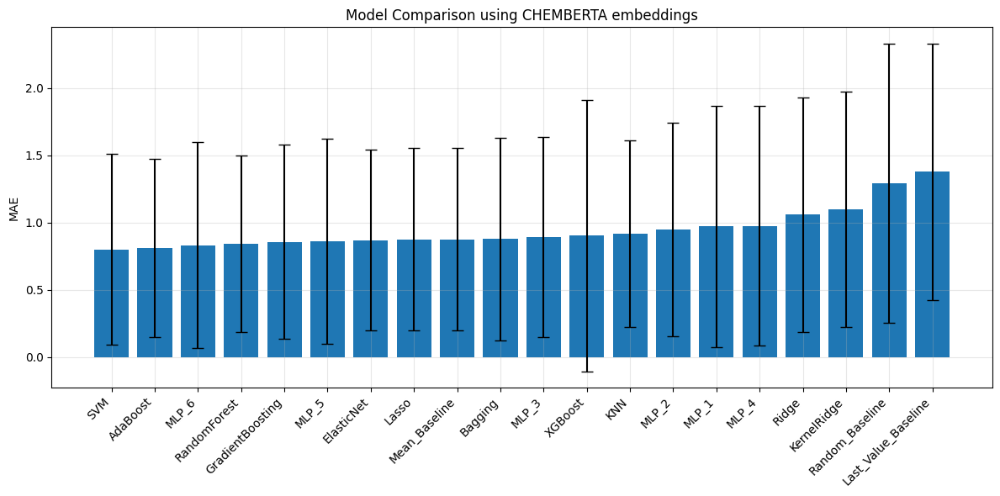


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
MLP_6                8.542750e-01  7.550073e-01    0.675371
KernelRidge          8.619319e-01  7.982950e-01    0.635979
Ridge                8.958592e-01  7.623910e-01    0.698669
MLP_3                8.970158e-01  7.643027e-01    0.689916
SVM                  8.992296e-01  7.306891e-01    0.710352
RandomForest         8.992966e-01  7.500303e-01    0.655178
Bagging              9.039930e-01  7.125694e-01    0.684514
MLP_5                9.187279e-01  7.433985e-01    0.756180
AdaBoost             9.235268e-01  7.130141e-01    0.684788
GradientBoosting     9.377979e-01  8.021897e-01    0.715902
MLP_2      

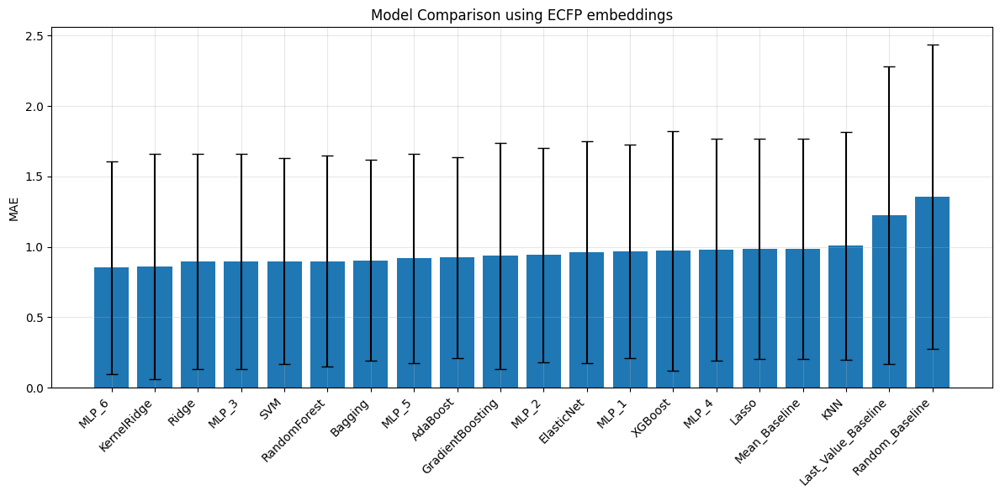

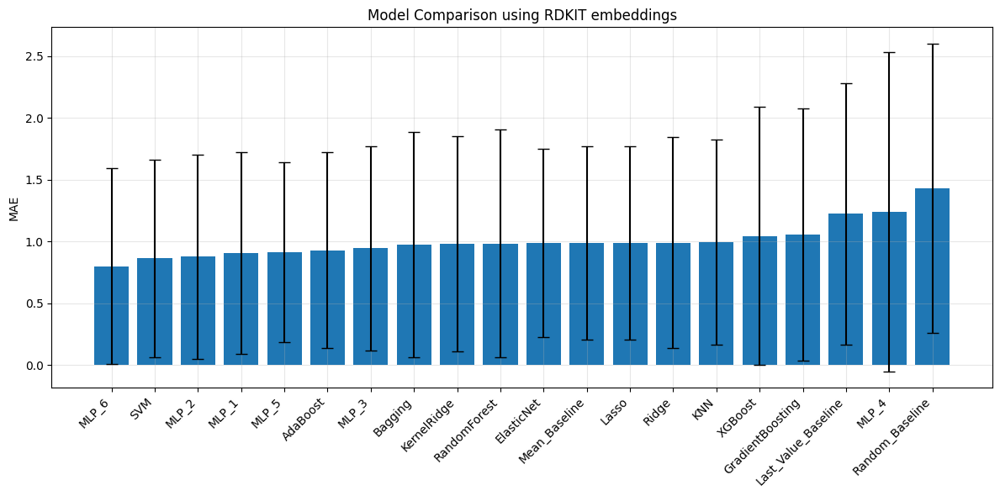

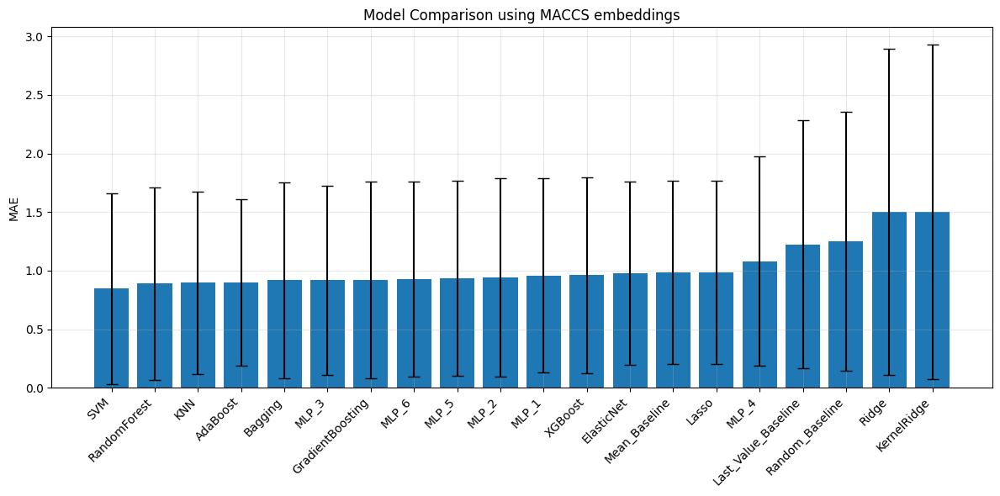

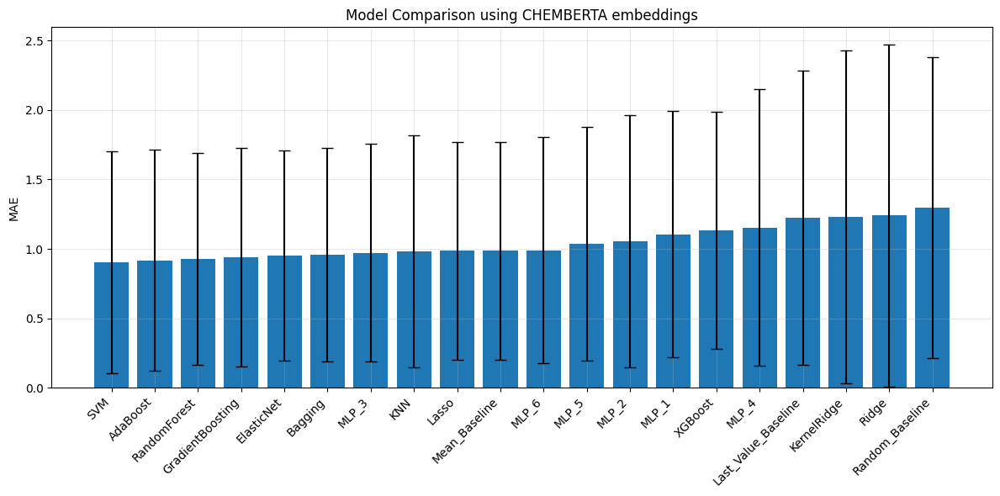


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
SVM                  0.925396  0.791379    0.712106
MLP_3                0.930559  0.810520    0.679337
MLP_6                0.934893  0.802783    0.728327
RandomForest         0.949114  0.839473    0.732533
ElasticNet           0.958167  0.780934    0.721182
Lasso                0.958475  0.773995    0.714493
Mean_Baseline        0.958615  0.773810    0.715575
MLP_1                0.974816  0.854776    0.736856
MLP_2                0.976446  0.820159    0.786326
Bagging              0.977445  0.836191    0.738540
MLP_5                0.978776  0.820152    0.748331
AdaBoost             0.983496  0.819104    0.73

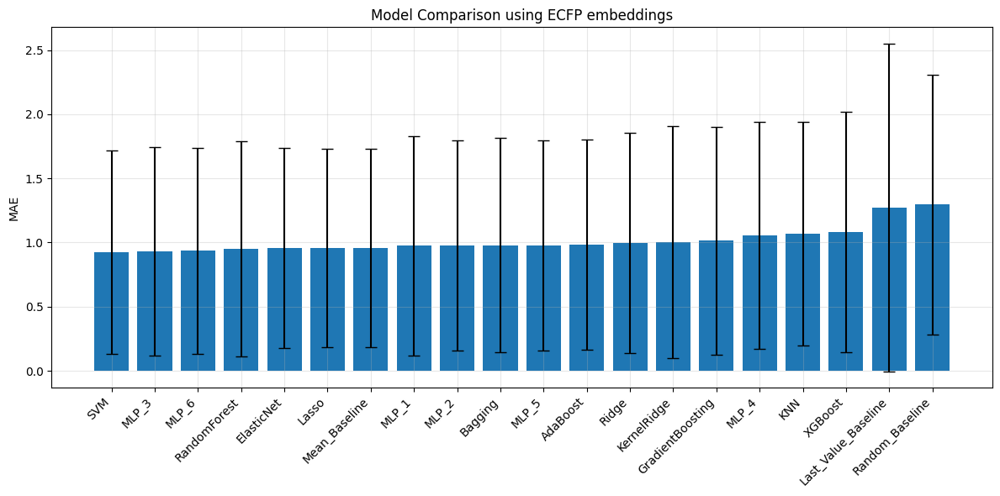

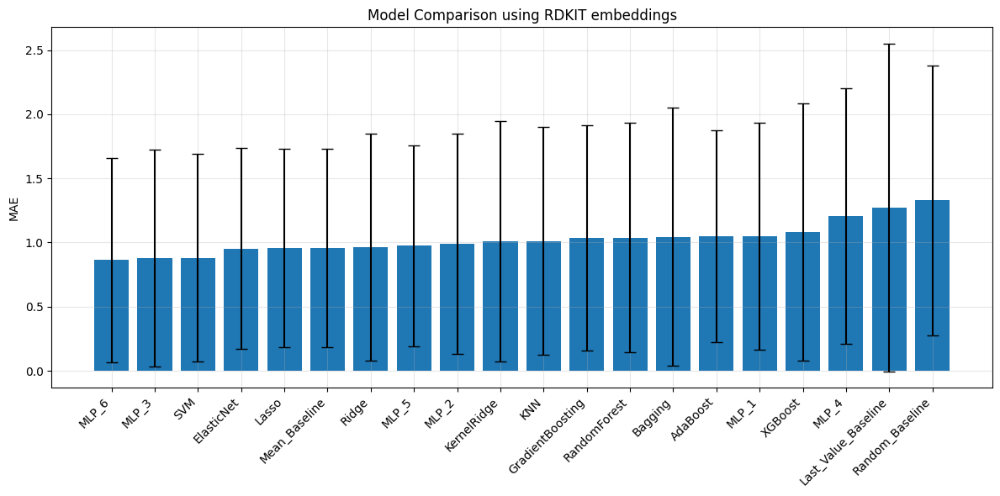

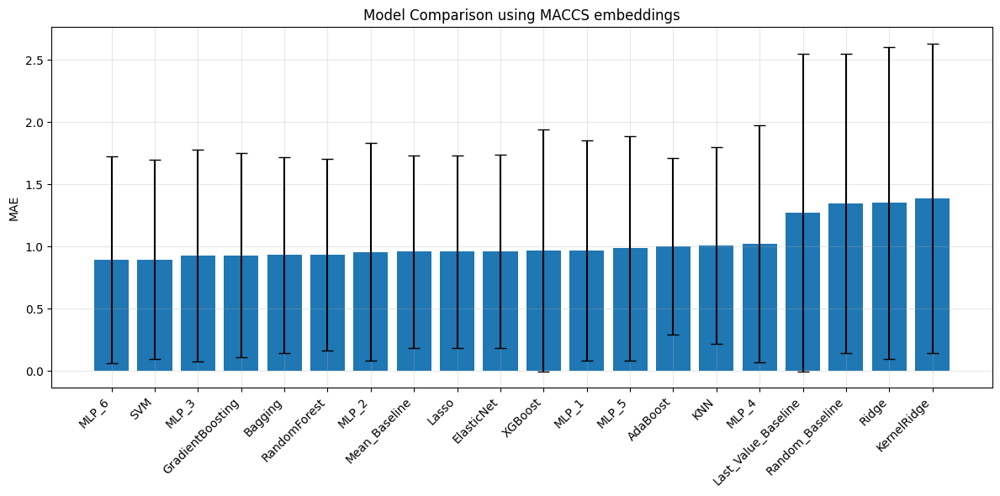

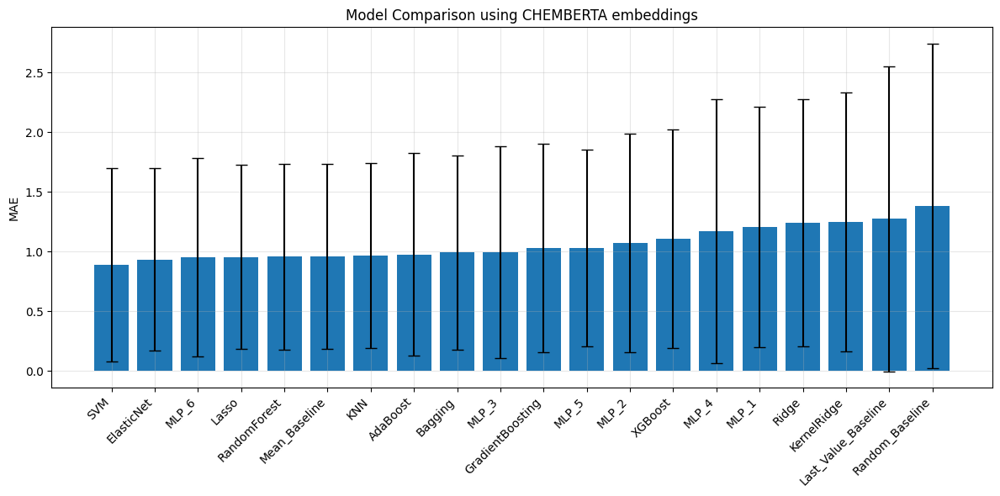


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  5.700670e-01  3.655625e-01    0.600490
Mean_Baseline        5.733388e-01  3.323863e-01    0.665230
Lasso                5.733388e-01  3.323863e-01    0.665230
ElasticNet           5.733388e-01  3.323863e-01    0.665230
AdaBoost             6.066658e-01  4.317104e-01    0.553684
MLP_3                6.069989e-01  3.821880e-01    0.592721
MLP_6                6.074132e-01  3.633147e-01    0.599732
RandomForest         6.101166e-01  4.118775e-01    0.570544
KNN                  6.137096e-01  4.027839e-01    0.584972
MLP_5                6.159055e-01  3.822715e-01    0.708518
MLP_2      

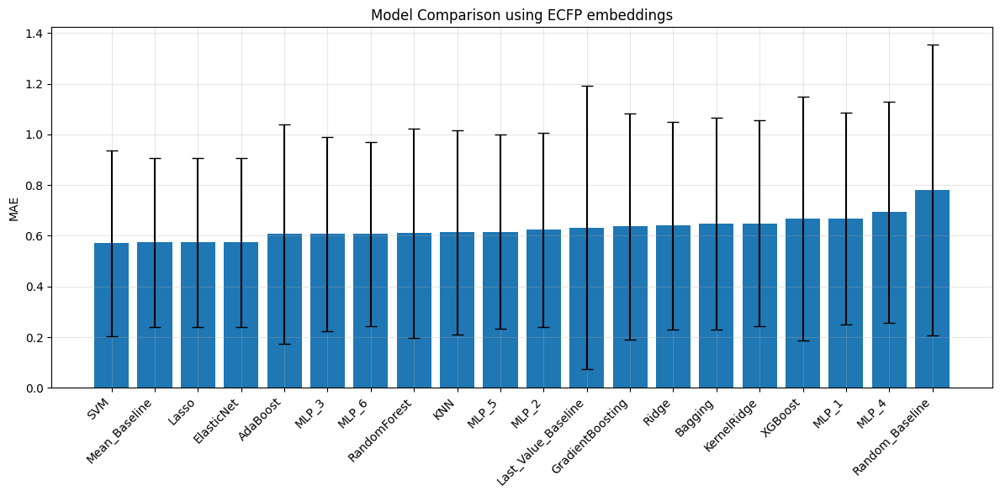

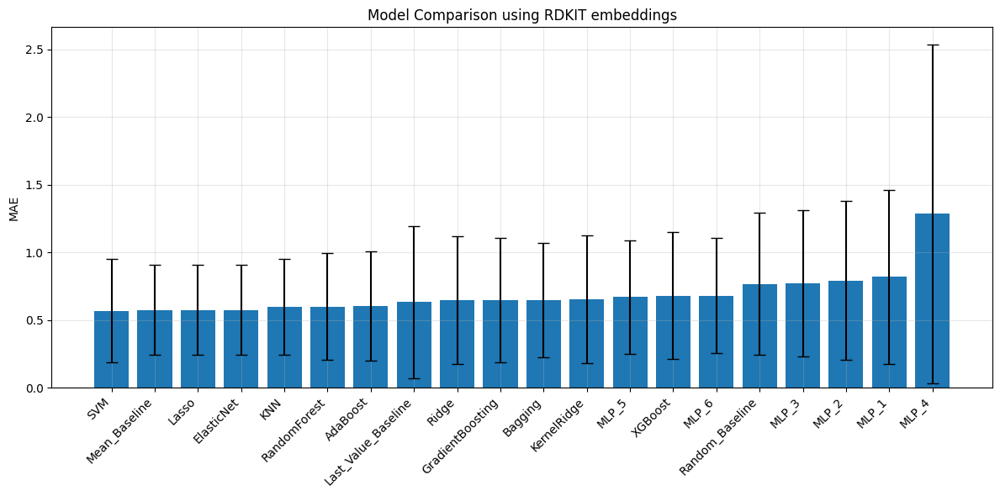

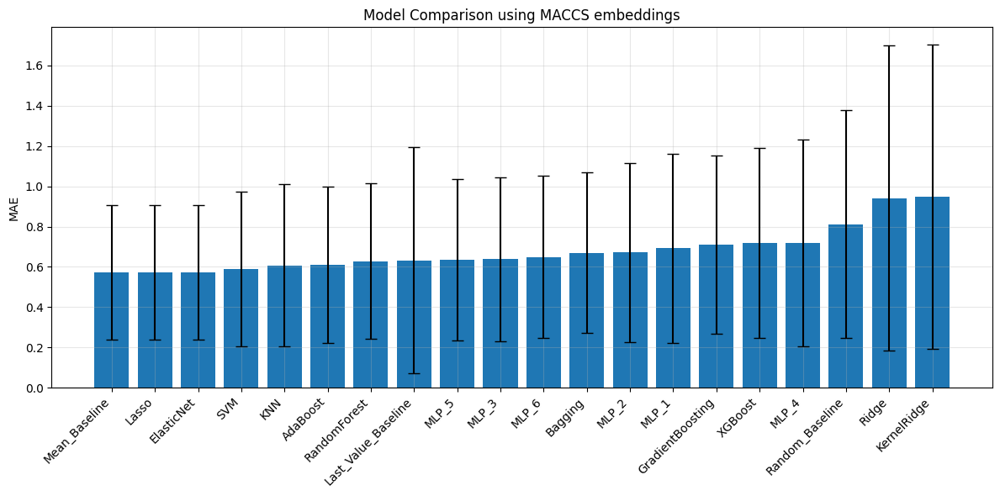

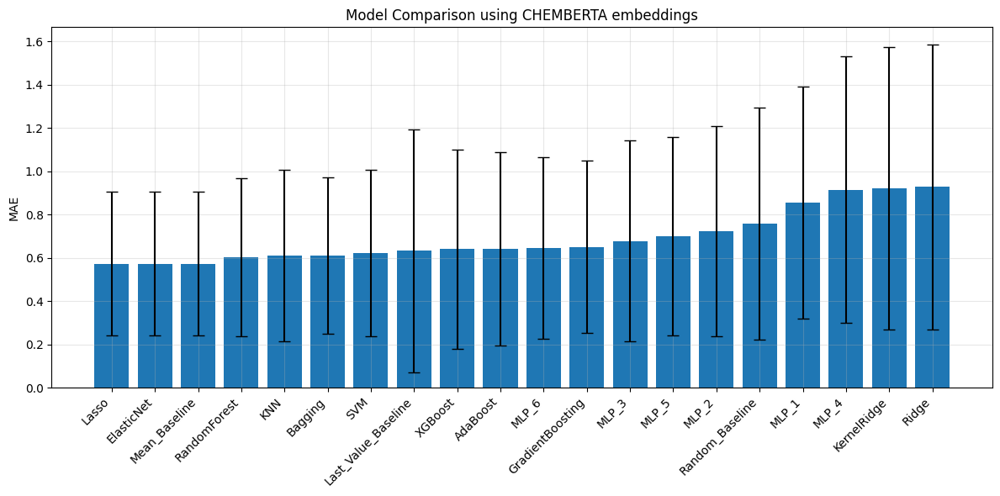


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Lasso                6.278553e-01  2.960041e-01    0.632749
ElasticNet           6.278553e-01  2.960041e-01    0.632749
Mean_Baseline        6.278553e-01  2.960041e-01    0.632749
KNN                  6.302541e-01  3.735015e-01    0.651977
SVM                  6.356923e-01  3.474315e-01    0.607051
MLP_3                6.496639e-01  3.528435e-01    0.653742
MLP_2                6.502116e-01  3.693815e-01    0.643287
MLP_5                6.532132e-01  3.748952e-01    0.627242
RandomForest         6.551177e-01  3.737372e-01    0.612459
KernelRidge          6.621746e-01  3.982809e-01    0.592551
MLP_6      

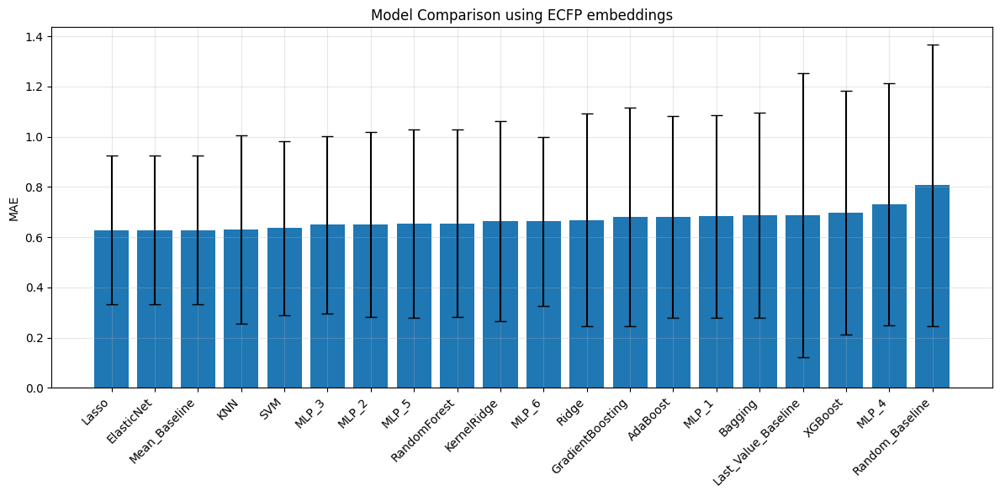

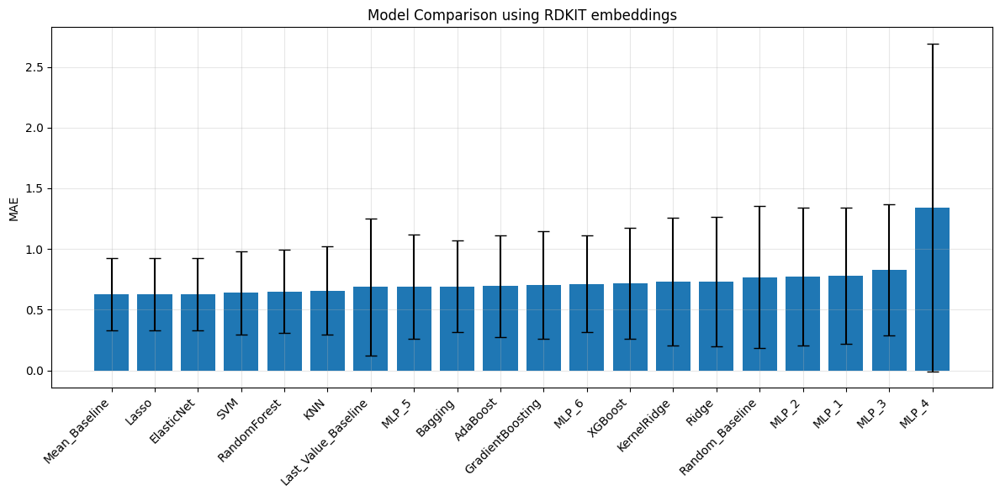

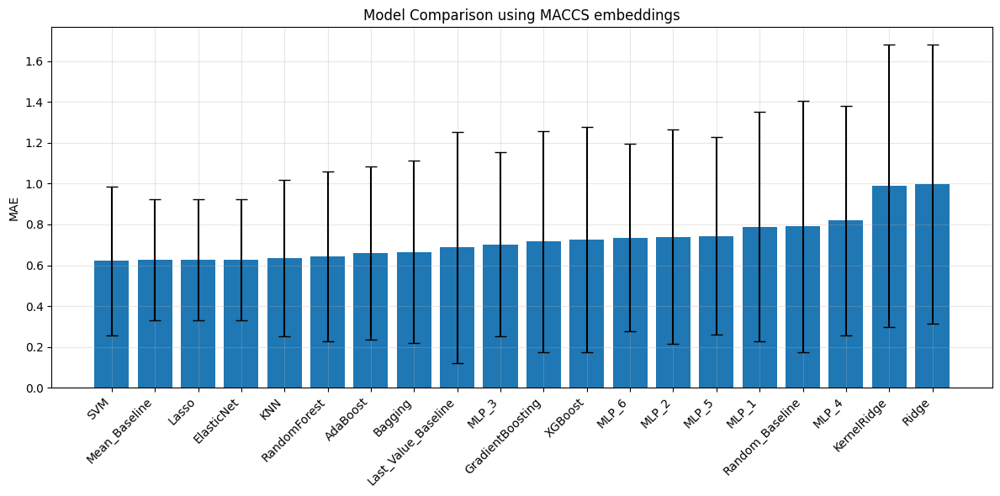

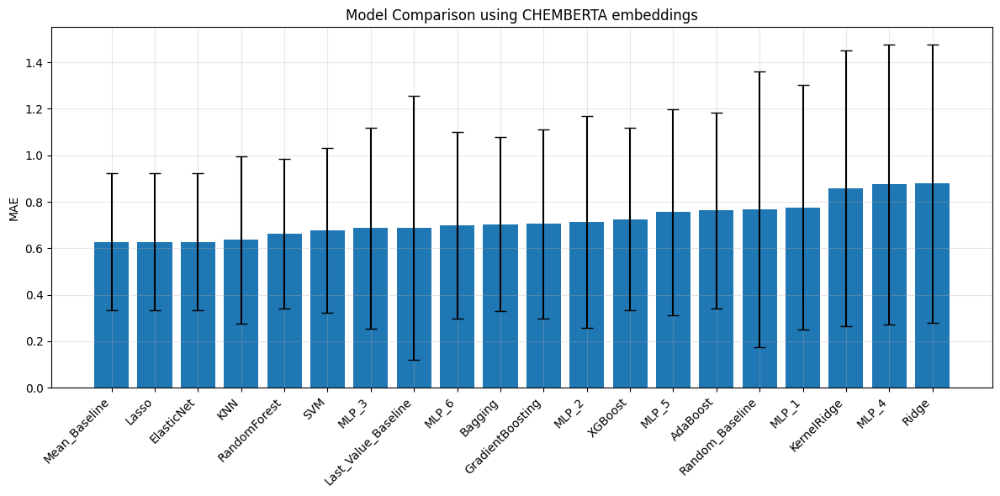


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
RandomForest         0.629642  0.613264    0.469966
GradientBoosting     0.644225  0.611794    0.475811
XGBoost              0.649786  0.667428    0.456505
Bagging              0.664893  0.658279    0.495010
AdaBoost             0.686863  0.638545    0.536791
Spline               0.698517  0.637139    0.510906
Linear               0.717109  0.624254    0.604538
Ridge                0.717765  0.620860    0.602008
MLP_5                0.722879  0.586674    0.690199
SVM                  0.725423  0.596098    0.628381
MLP_3                0.732871  0.604102    0.633628
MLP_6                0.737295  0.632695    0.61

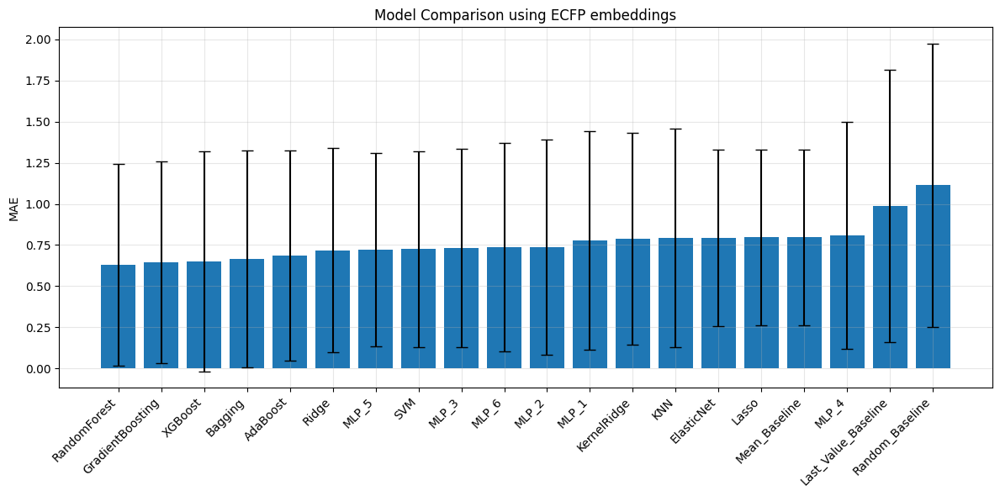

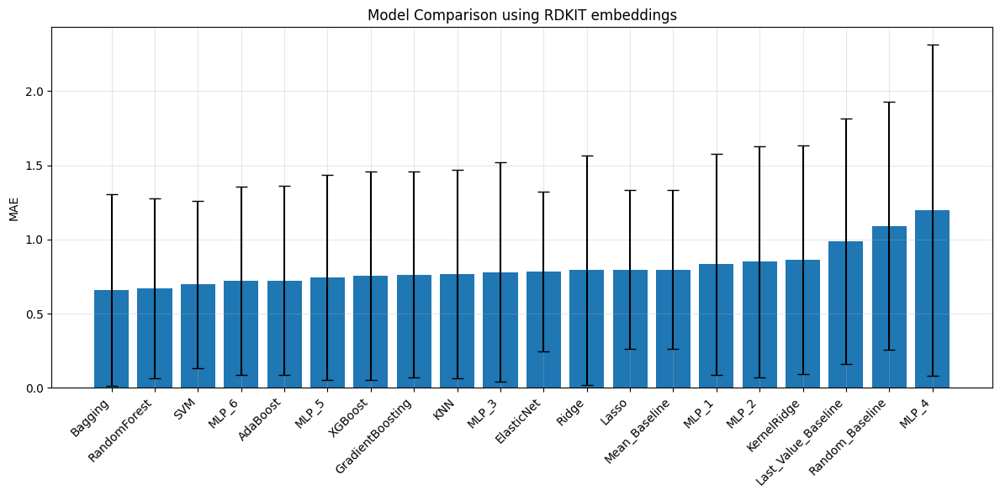

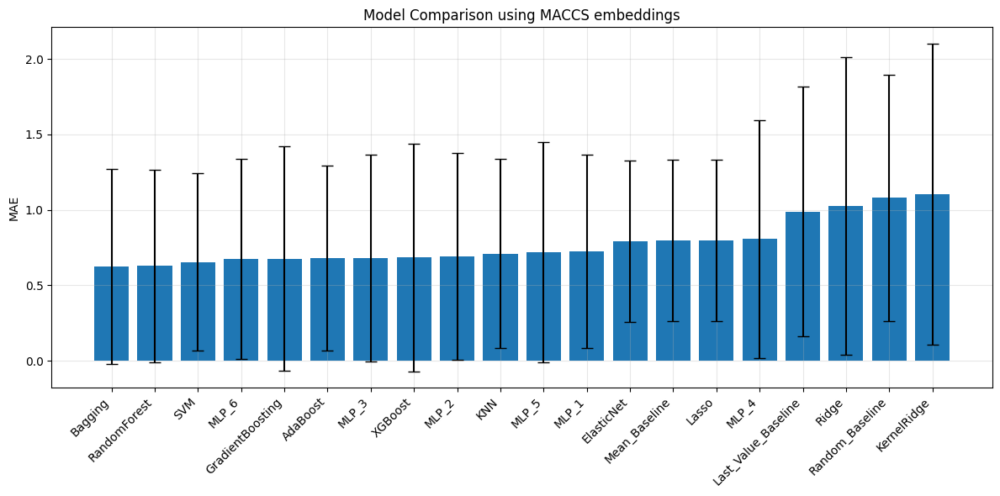

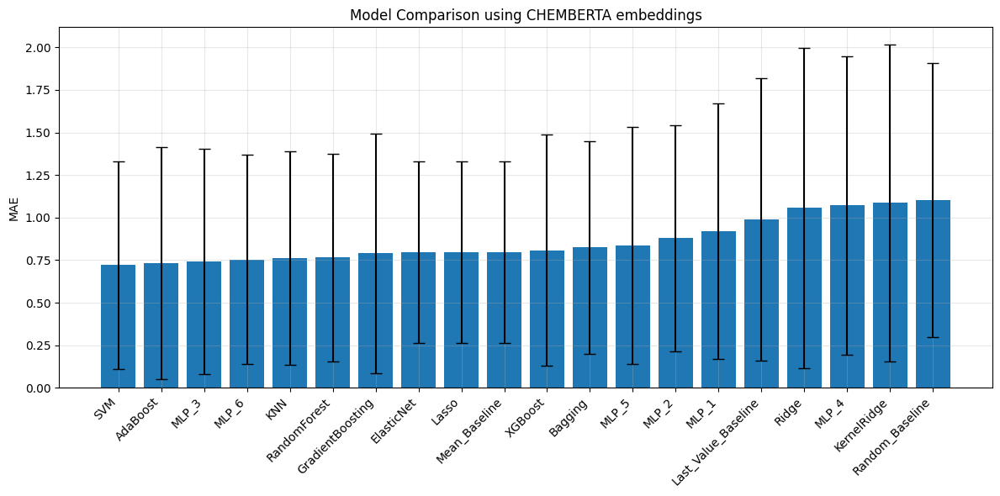


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  1.430862e+00  1.249286e+00    1.124890
RandomForest         1.451149e+00  1.318952e+00    1.242440
GradientBoosting     1.460449e+00  1.339771e+00    1.210482
MLP_2                1.481391e+00  1.069193e+00    1.331656
XGBoost              1.484388e+00  1.443273e+00    0.934539
MLP_6                1.486028e+00  1.148717e+00    1.272964
Ridge                1.493357e+00  1.185637e+00    1.306422
Bagging              1.494767e+00  1.345736e+00    1.258361
MLP_3                1.500940e+00  1.120812e+00    1.333344
AdaBoost             1.513282e+00  1.220700e+00    1.404603
MLP_1      

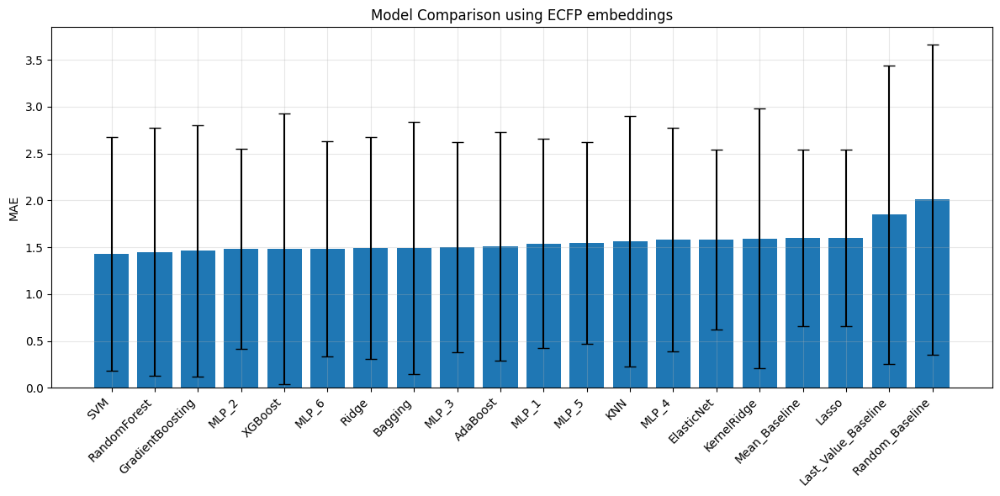

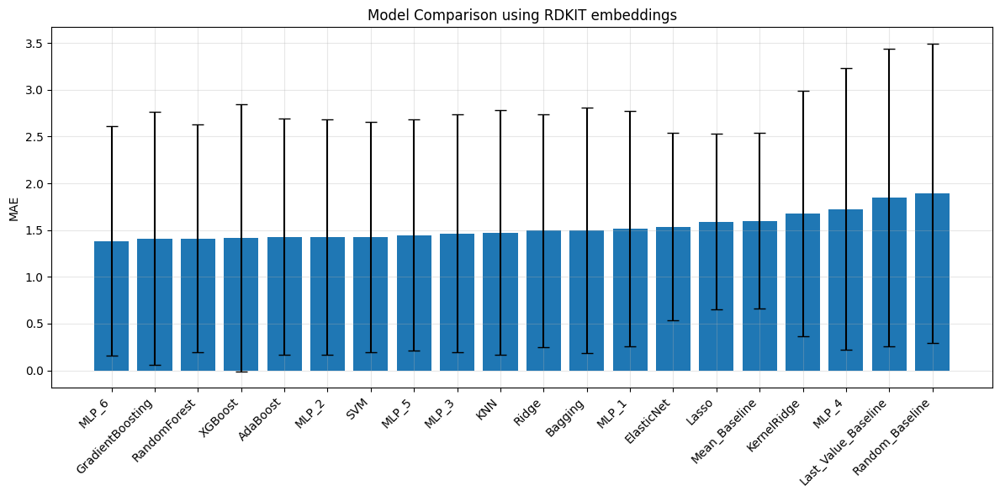

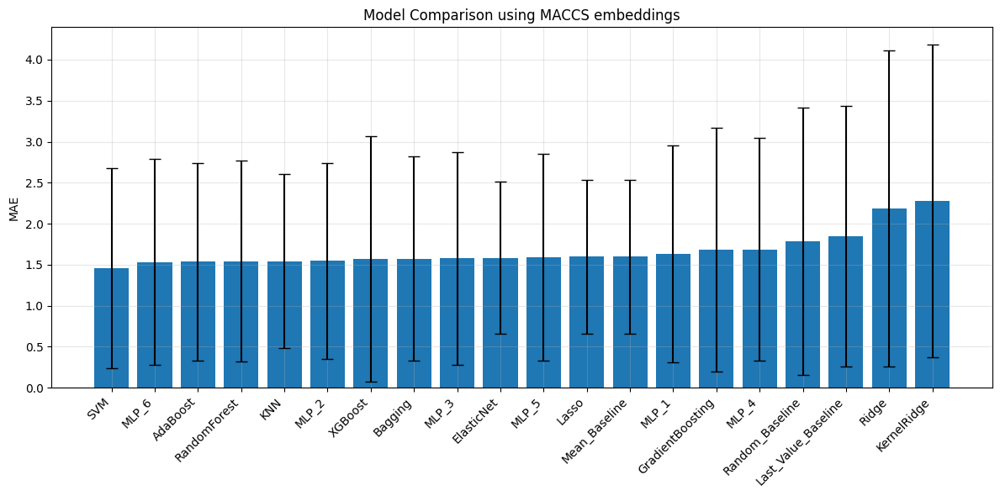

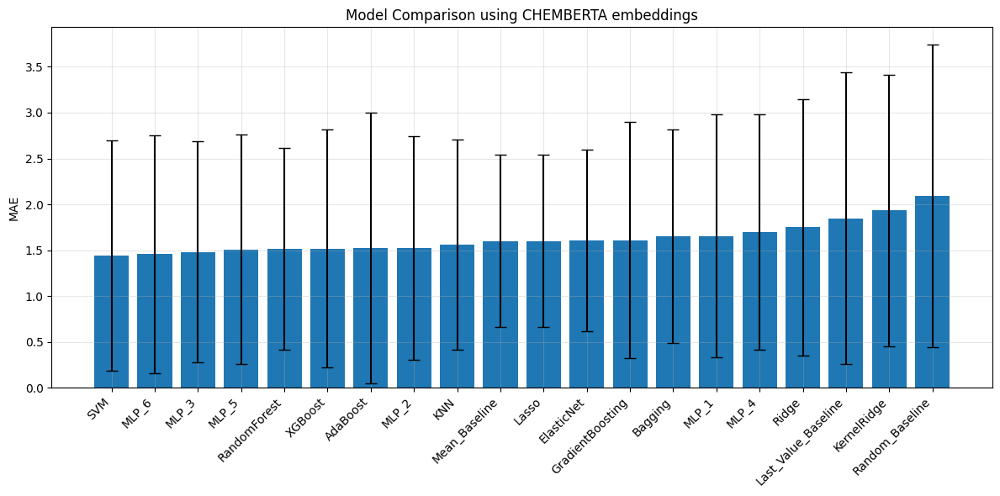


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Mean_Baseline        5.635059e-01  3.042228e-01    0.627145
Lasso                5.635059e-01  3.042228e-01    0.627145
ElasticNet           5.635059e-01  3.042228e-01    0.627145
MLP_6                6.041015e-01  3.219187e-01    0.632808
GradientBoosting     6.082285e-01  4.162915e-01    0.567244
MLP_5                6.127318e-01  3.283972e-01    0.654726
RandomForest         6.182953e-01  3.946012e-01    0.644596
SVM                  6.231189e-01  3.221903e-01    0.686914
MLP_3                6.293949e-01  3.362627e-01    0.614495
AdaBoost             6.317659e-01  3.876590e-01    0.613507
KNN        

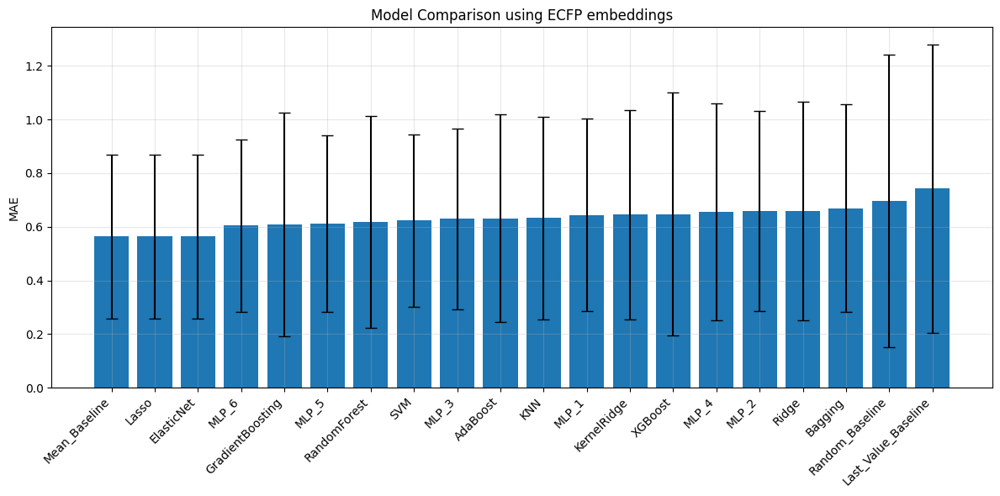

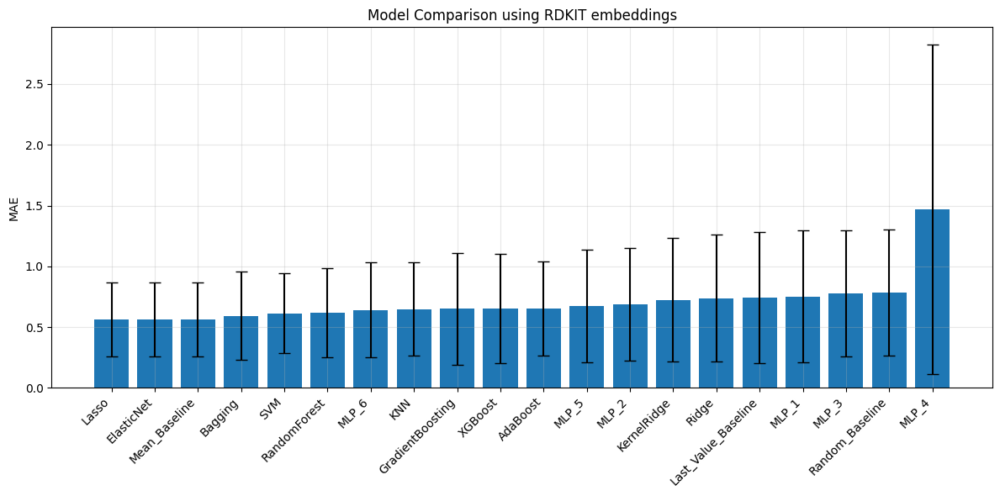

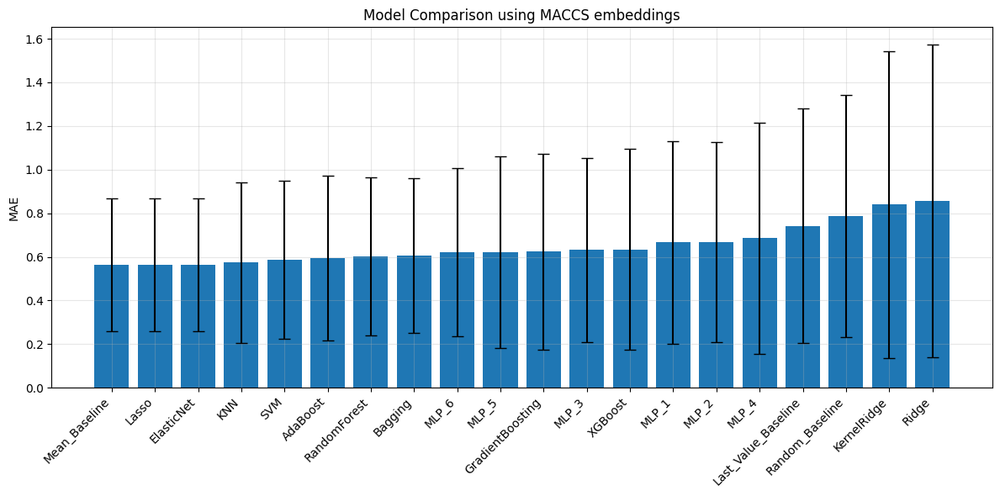

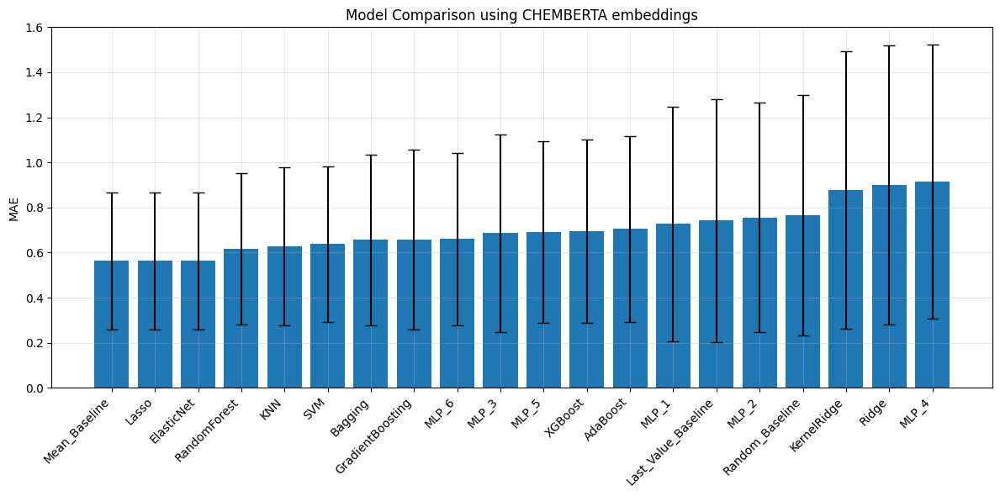


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
KernelRidge          5.986068e-01  3.482847e-01    0.579081
MLP_5                6.028918e-01  3.122361e-01    0.647431
Ridge                6.061443e-01  3.428399e-01    0.599274
MLP_6                6.111550e-01  2.740480e-01    0.661844
MLP_3                6.165992e-01  2.994361e-01    0.622384
MLP_4                6.193550e-01  3.694136e-01    0.587470
MLP_2                6.214783e-01  3.091587e-01    0.646252
SVM                  6.223067e-01  3.117419e-01    0.600181
Mean_Baseline        6.303321e-01  2.685818e-01    0.665782
ElasticNet           6.303321e-01  2.685818e-01    0.665782
Lasso      

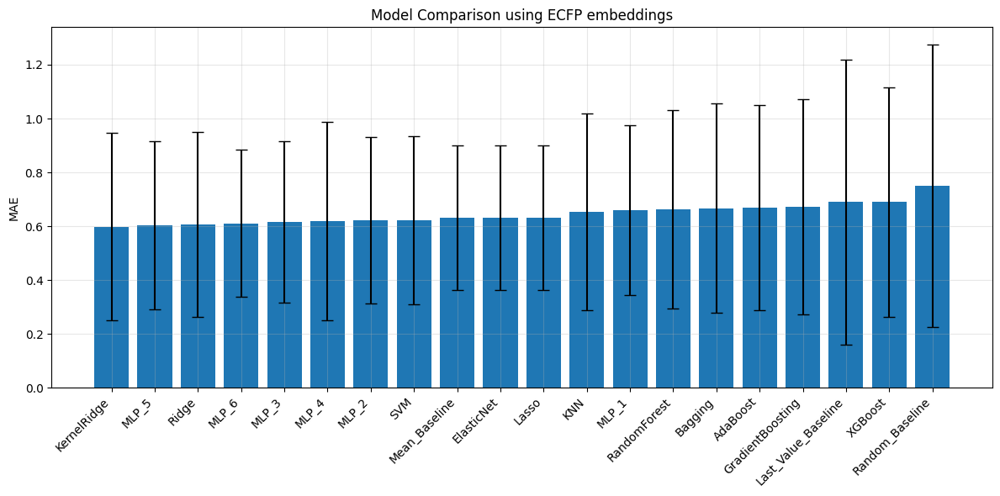

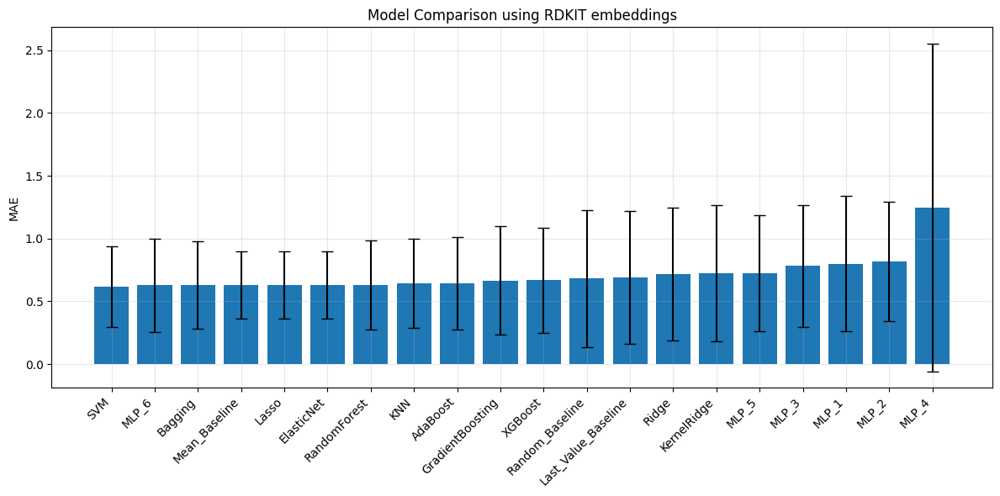

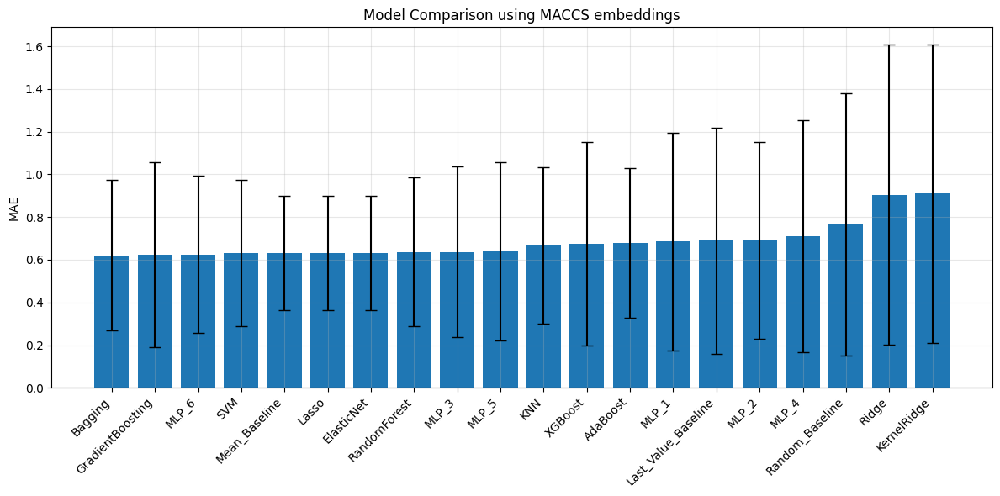

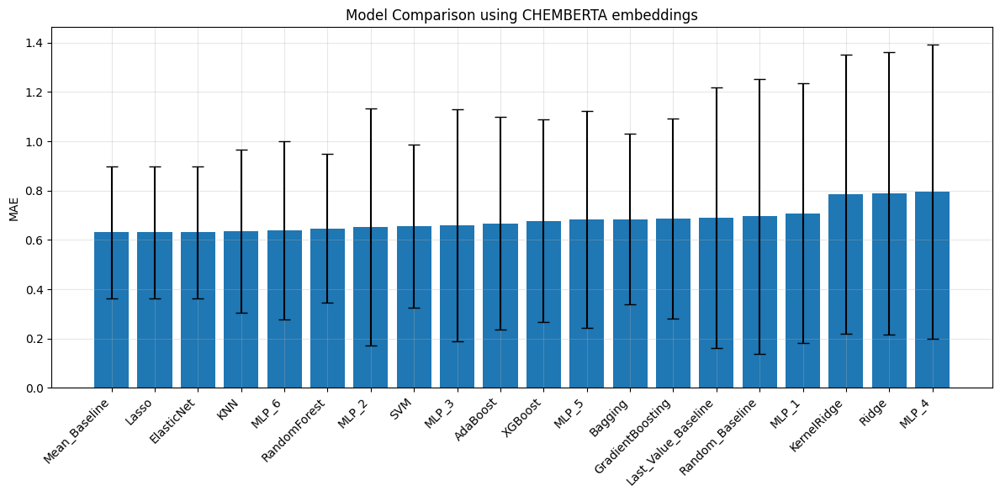


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
Mean_Baseline        6.284167e-01  3.018272e-01    0.662900
Lasso                6.284167e-01  3.018272e-01    0.662900
ElasticNet           6.284167e-01  3.018272e-01    0.662900
MLP_6                6.411351e-01  3.290758e-01    0.634428
SVM                  6.651463e-01  3.613385e-01    0.647153
MLP_2                6.761242e-01  3.432102e-01    0.685553
MLP_5                6.805832e-01  3.602394e-01    0.709736
MLP_3                6.809151e-01  3.527616e-01    0.681275
MLP_4                6.838198e-01  4.296964e-01    0.664352
KNN                  6.858345e-01  3.804350e-01    0.677649
GradientBoo

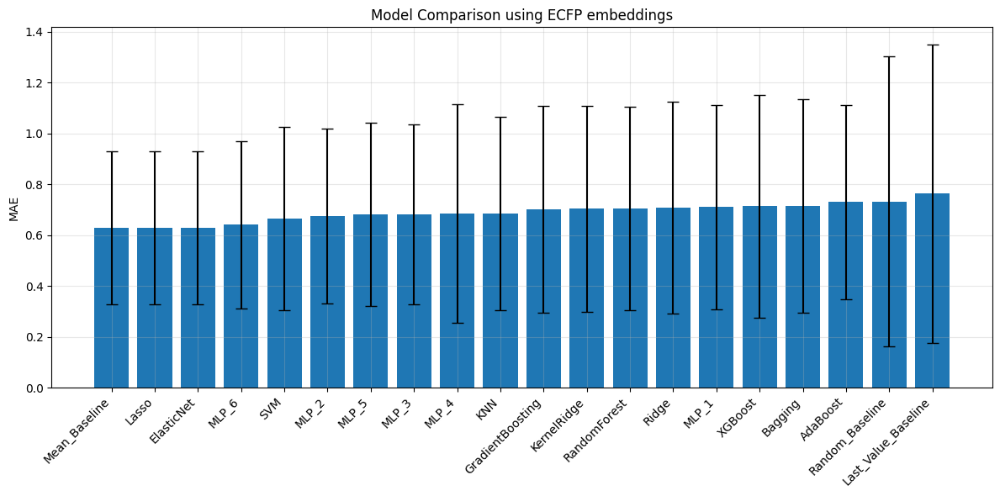

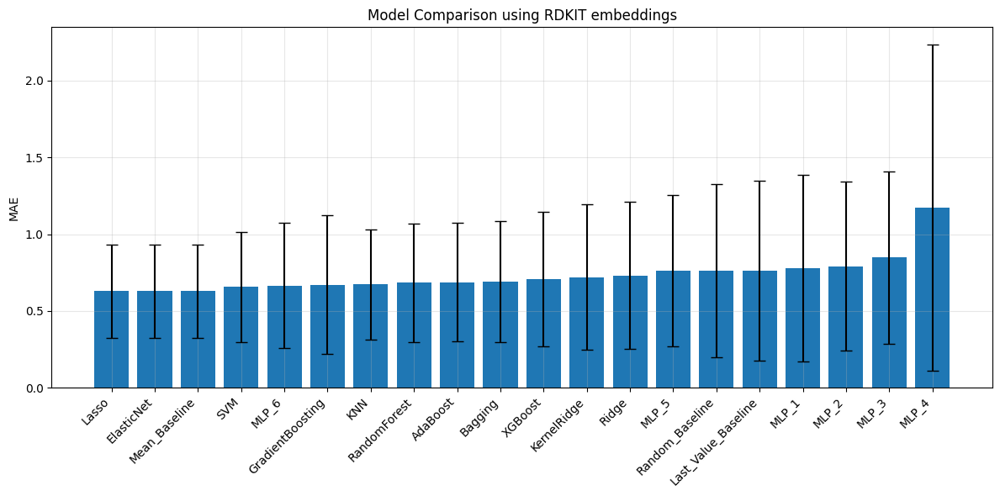

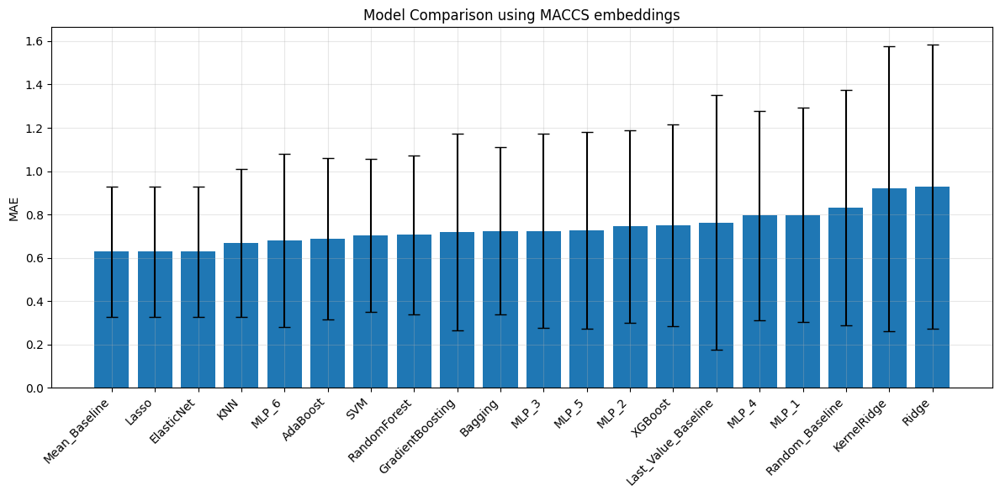

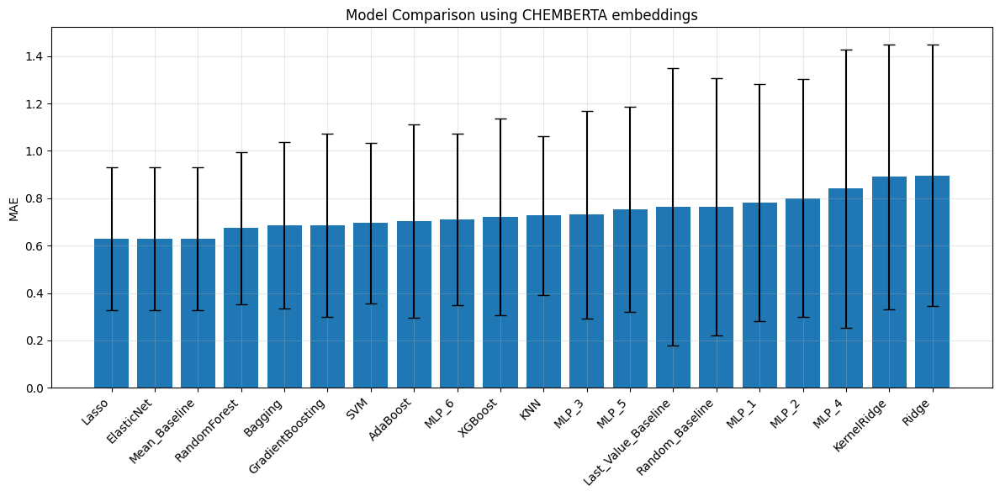


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
MLP_3                0.606791  0.339130    0.612980
MLP_2                0.607488  0.343503    0.620249
Lasso                0.612036  0.290210    0.680809
ElasticNet           0.612036  0.290210    0.680809
Mean_Baseline        0.612036  0.290210    0.680809
SVM                  0.615288  0.318799    0.562474
MLP_5                0.621172  0.316854    0.646883
KernelRidge          0.624124  0.356083    0.638194
Spline               0.624576  0.395991    0.609114
MLP_6                0.628637  0.330164    0.644421
Linear               0.629583  0.351315    0.606058
Ridge                0.630522  0.350028    0.62

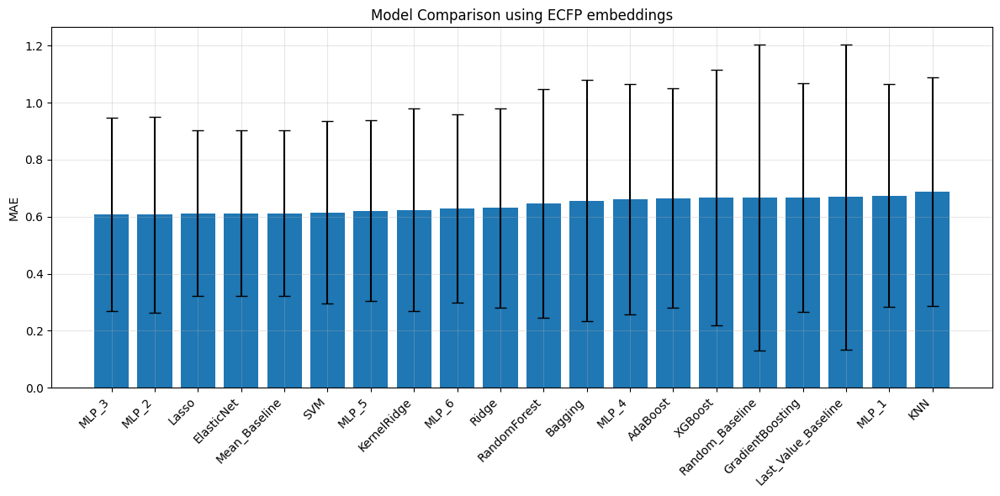

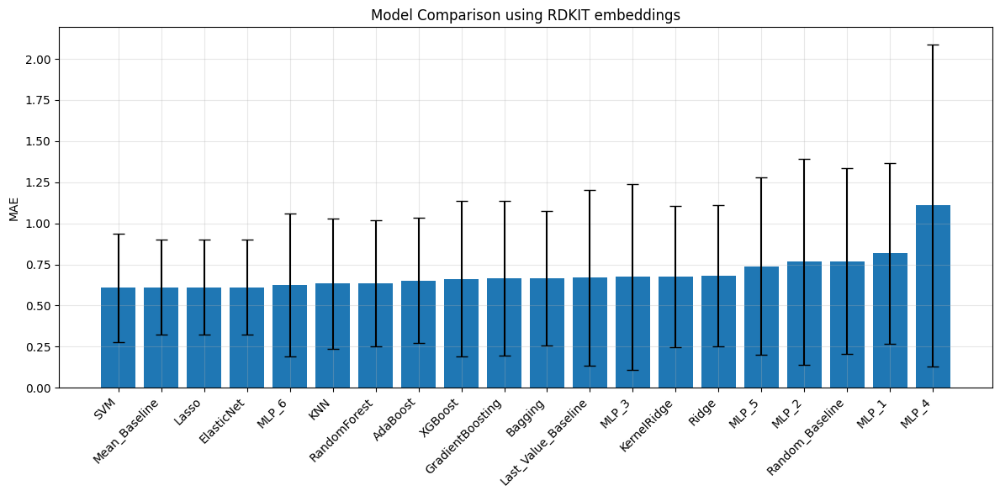

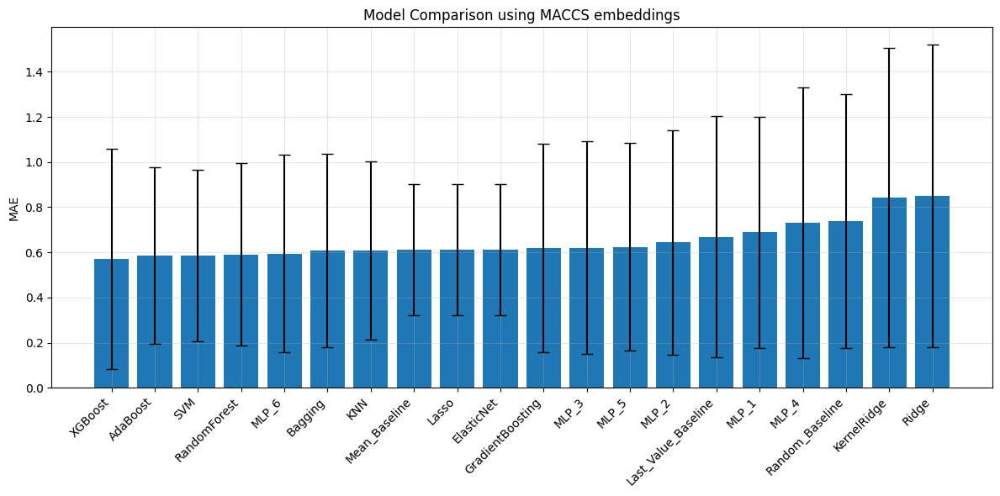

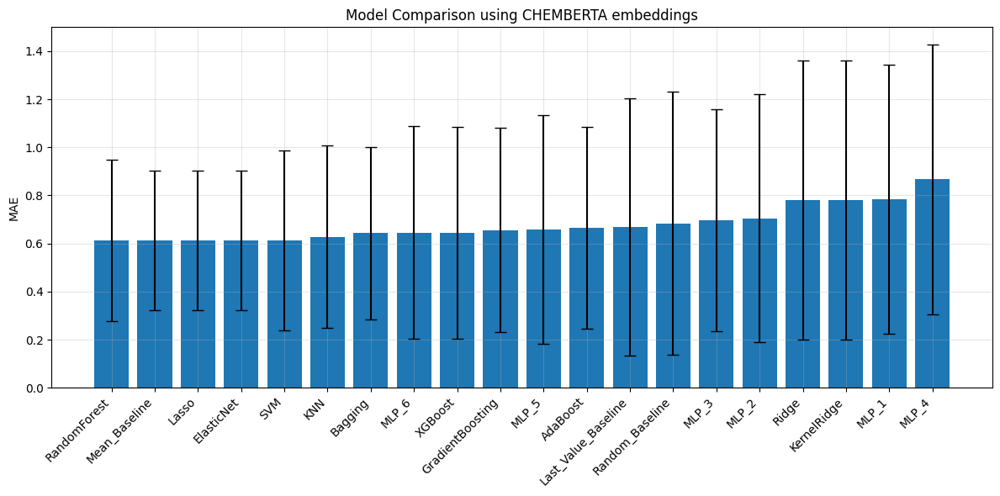


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
RandomForest         2.740233e+00  8.557612e+00    0.684397
XGBoost              2.753662e+00  8.495610e+00    0.602168
Bagging              2.767875e+00  8.636257e+00    0.632229
MLP_6                2.839688e+00  8.629392e+00    0.727596
SVM                  2.857117e+00  8.707374e+00    0.398447
Ridge                2.958079e+00  8.483537e+00    0.943020
GradientBoosting     2.991222e+00  8.649043e+00    0.817614
AdaBoost             3.165409e+00  8.607832e+00    1.216717
ElasticNet           3.185413e+00  8.490686e+00    1.299031
KNN                  3.251353e+00  9.002840e+00    0.692989
MLP_3      

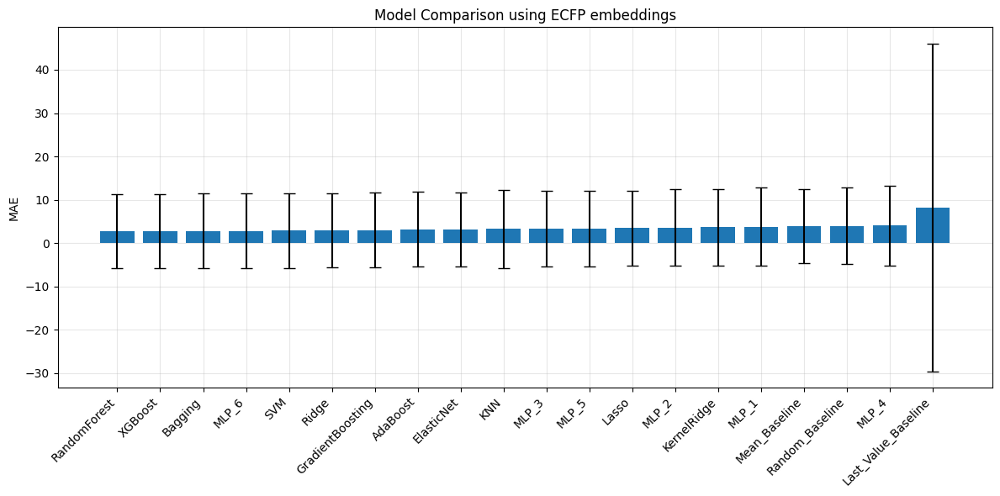

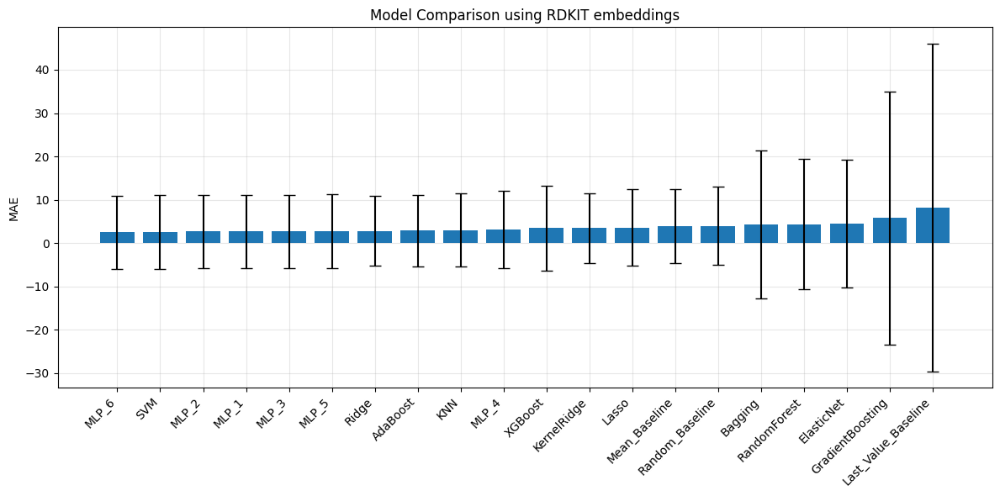

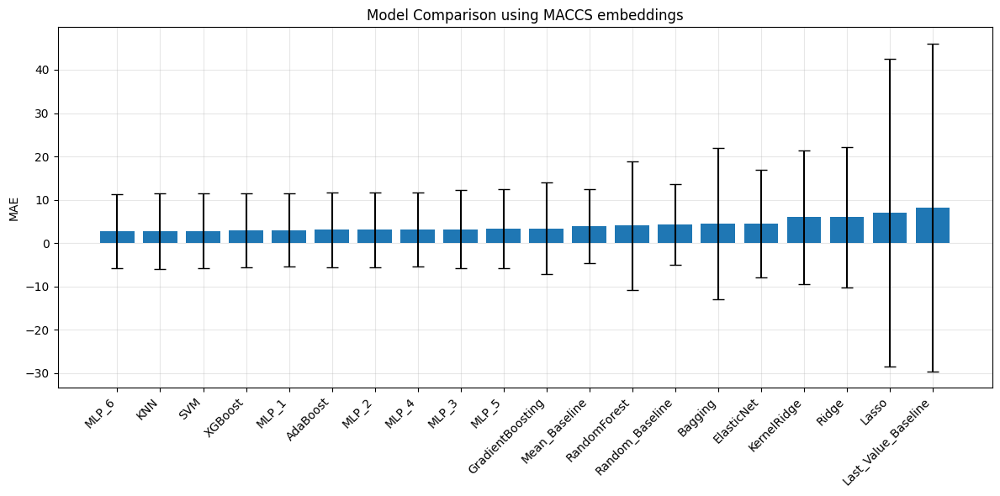

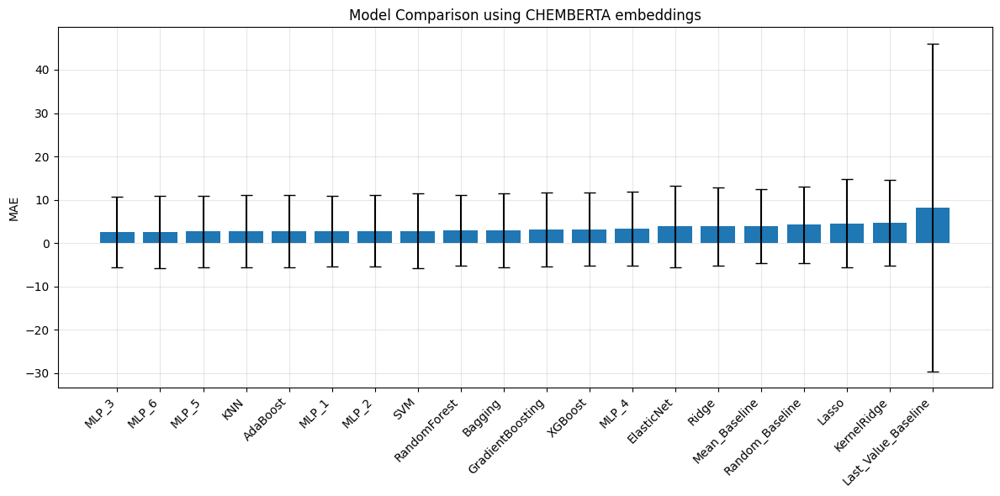


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  1.894999e+00  4.360307e+00    0.645971
MLP_6                1.997490e+00  3.077236e+00    1.049568
GradientBoosting     2.103813e+00  3.937819e+00    0.679379
Bagging              2.153046e+00  3.876451e+00    0.812463
RandomForest         2.156180e+00  3.774228e+00    0.782936
AdaBoost             2.354926e+00  3.974757e+00    1.321108
ElasticNet           2.542299e+00  4.031336e+00    1.142979
XGBoost              2.704856e+00  5.808668e+00    0.593112
Lasso                2.905468e+00  5.114175e+00    1.351484
Ridge                2.982734e+00  4.534609e+00    1.428719
Mean_Baseli

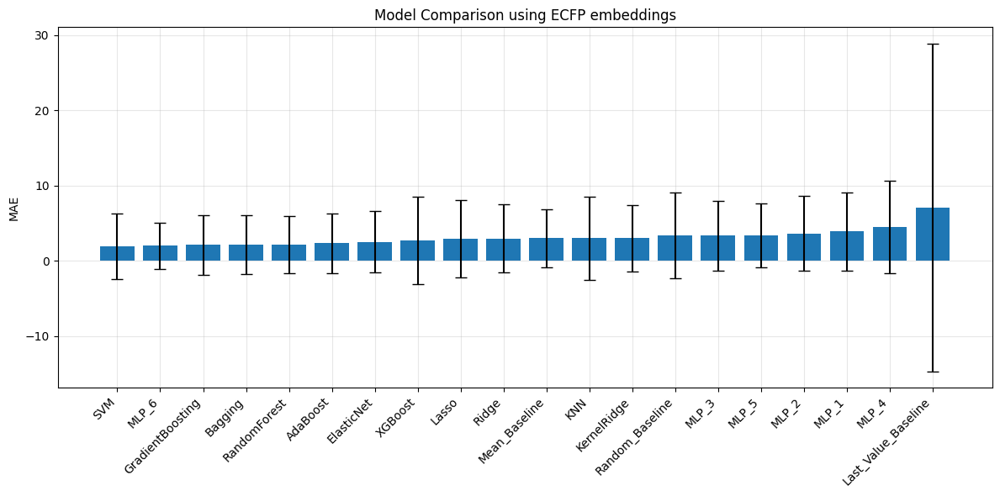

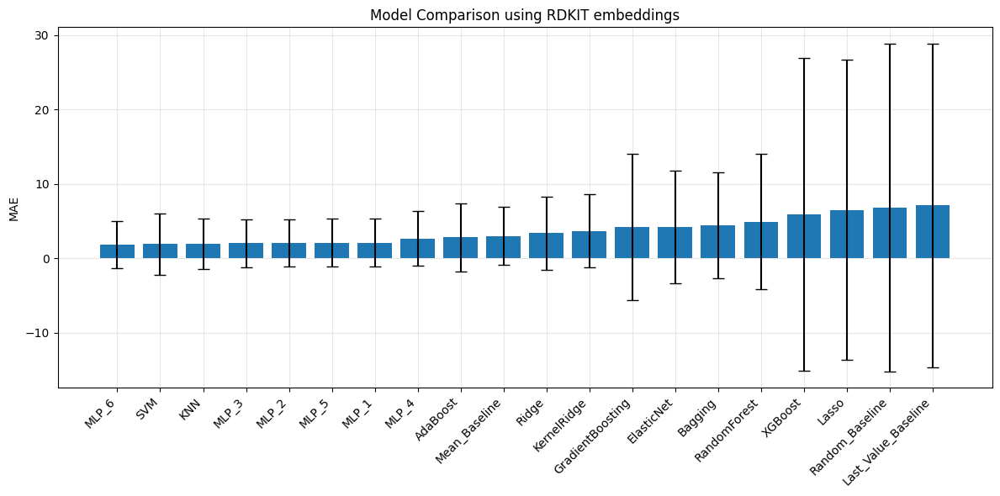

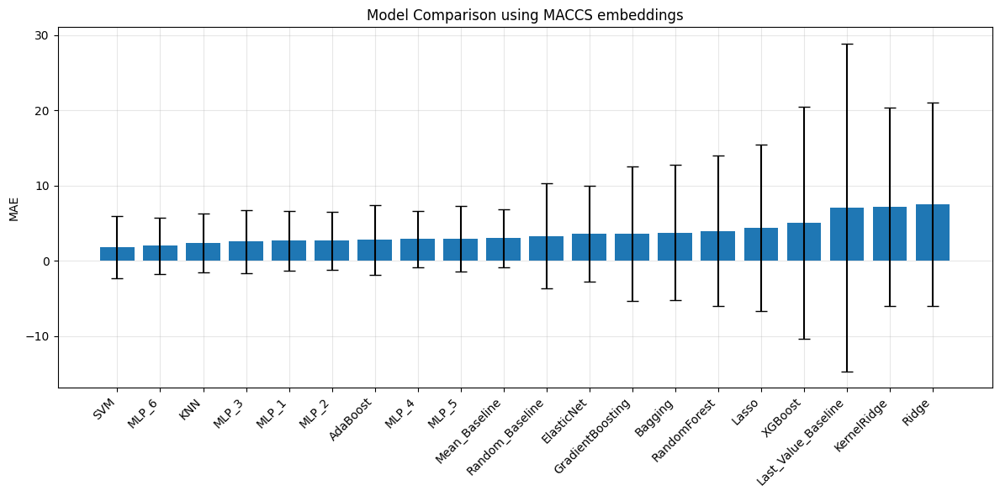

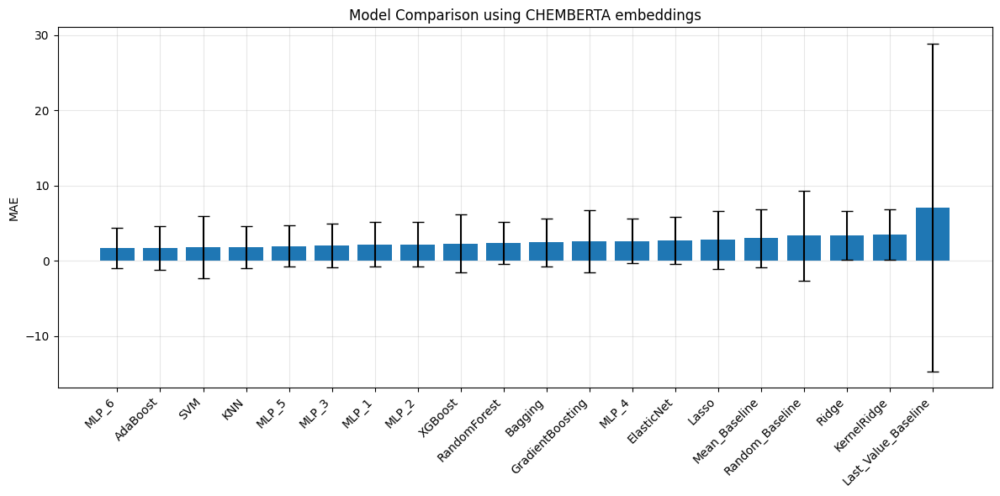


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                      Mean_MAE    Std_MAE  Median_MAE
SVM                   9.146952  68.304402    0.430916
MLP_6                 9.174840  67.813160    0.635106
GradientBoosting      9.223330  67.894964    0.461448
RandomForest          9.232670  67.986665    0.490537
AdaBoost              9.370887  68.222319    1.108463
KNN                   9.440651  68.231249    0.592143
Linear                9.449833  68.043125    0.821369
Ridge                 9.470815  68.041585    0.803456
Spline                9.677000  68.092517    0.995249
ElasticNet            9.729026  68.246639    1.025653
XGBoost               9.734098  68.640277    0.373710
Bagging               9

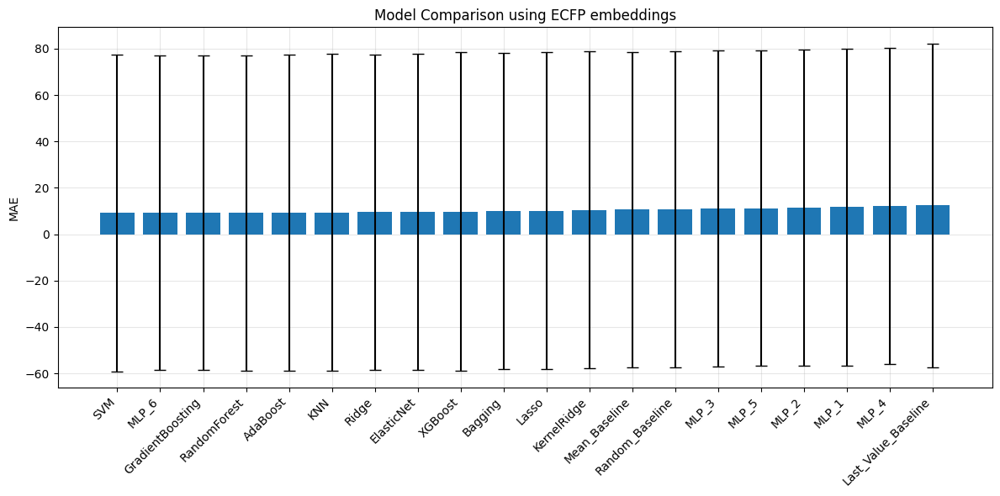

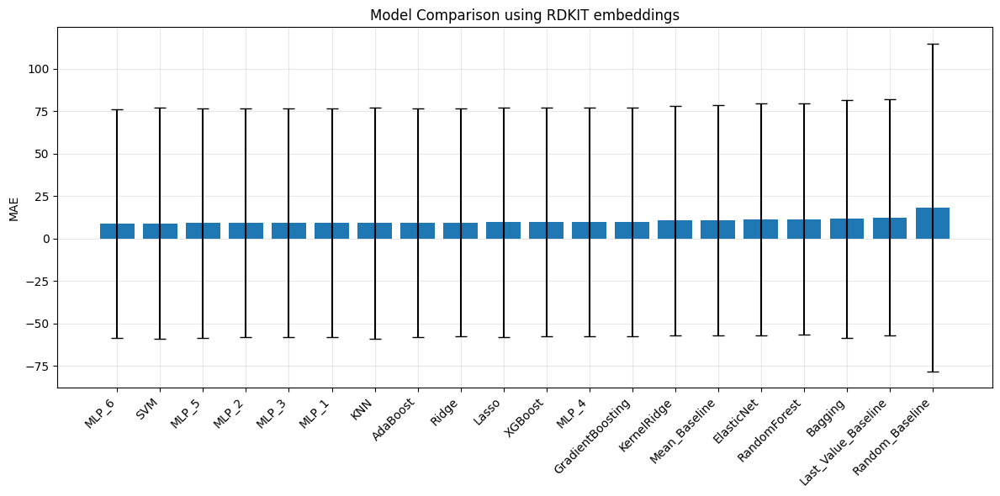

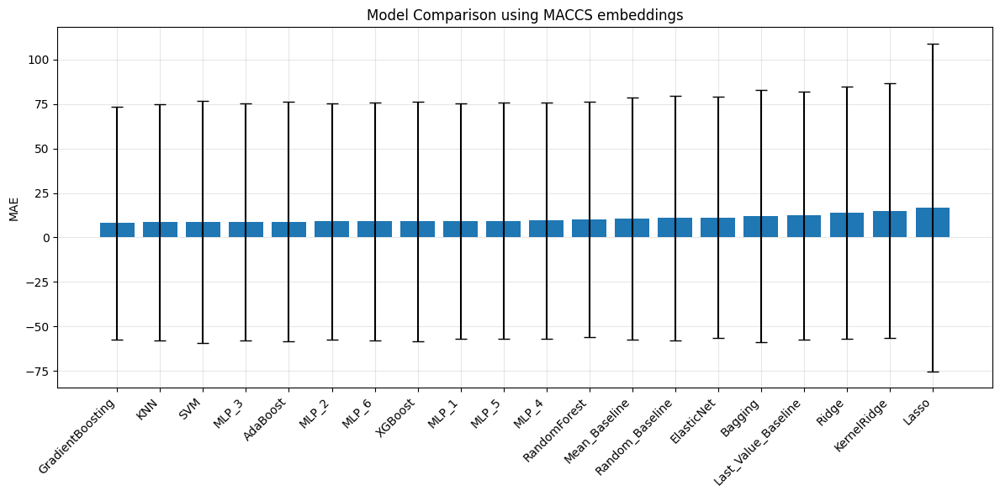

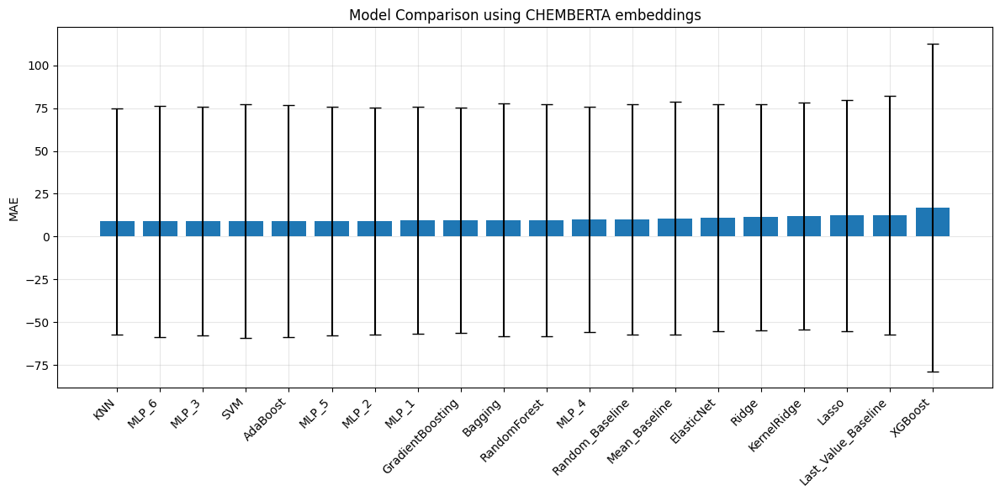


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
XGBoost              3.371842e-01  5.741299e-01    0.120990
GradientBoosting     3.666008e-01  5.730317e-01    0.143749
Bagging              3.751839e-01  5.585091e-01    0.154171
RandomForest         3.827622e-01  5.073261e-01    0.191782
AdaBoost             4.206867e-01  4.648324e-01    0.276799
Ridge                7.298570e-01  5.394104e-01    0.670037
MLP_6                7.801791e-01  5.700651e-01    0.657105
KernelRidge          7.804283e-01  7.326630e-01    0.508972
MLP_3                8.533075e-01  5.874991e-01    0.802827
MLP_5                9.115567e-01  5.567058e-01    0.843642
ElasticNet 

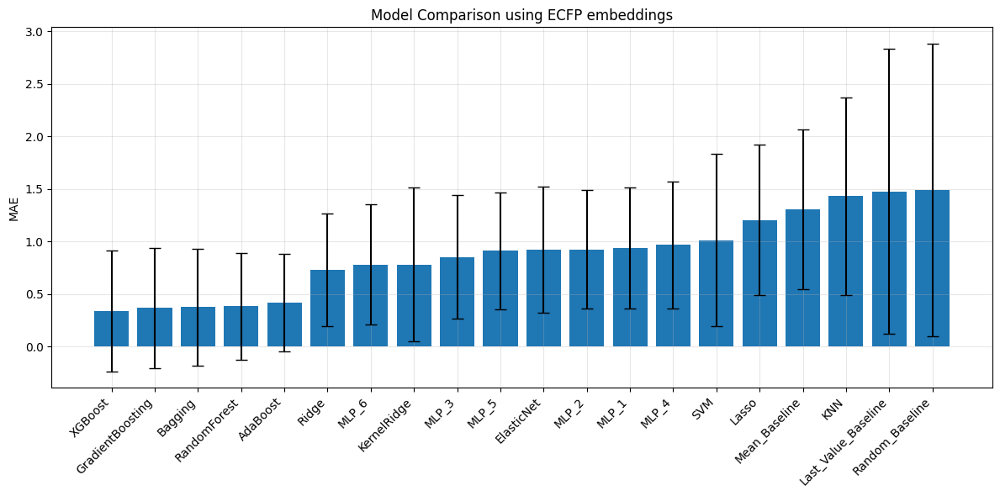

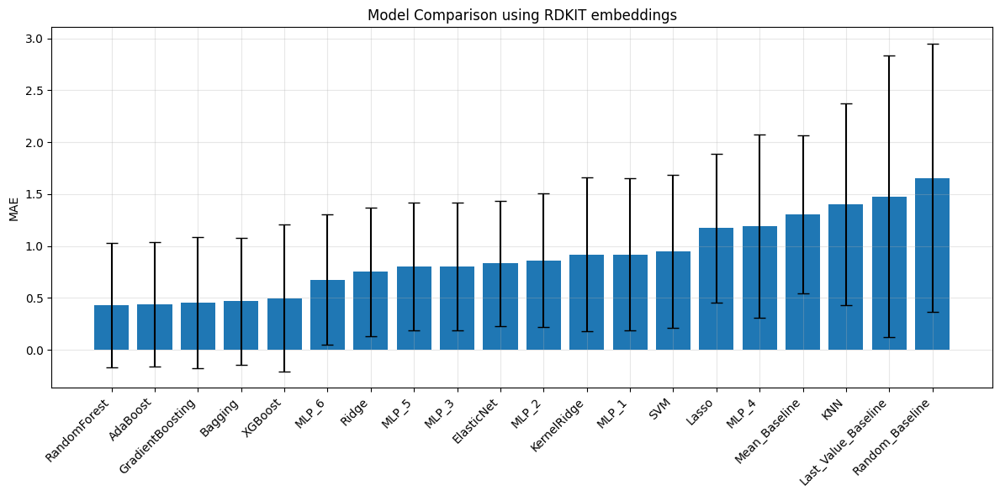

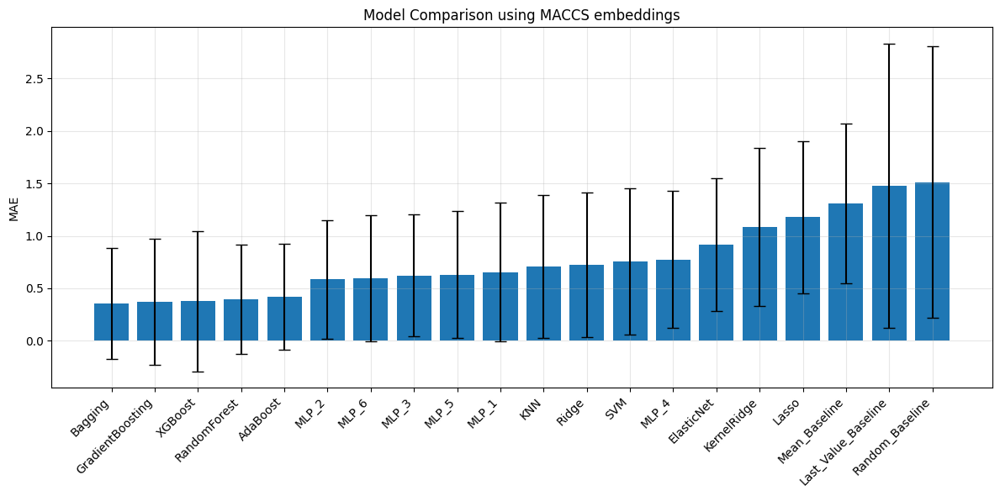

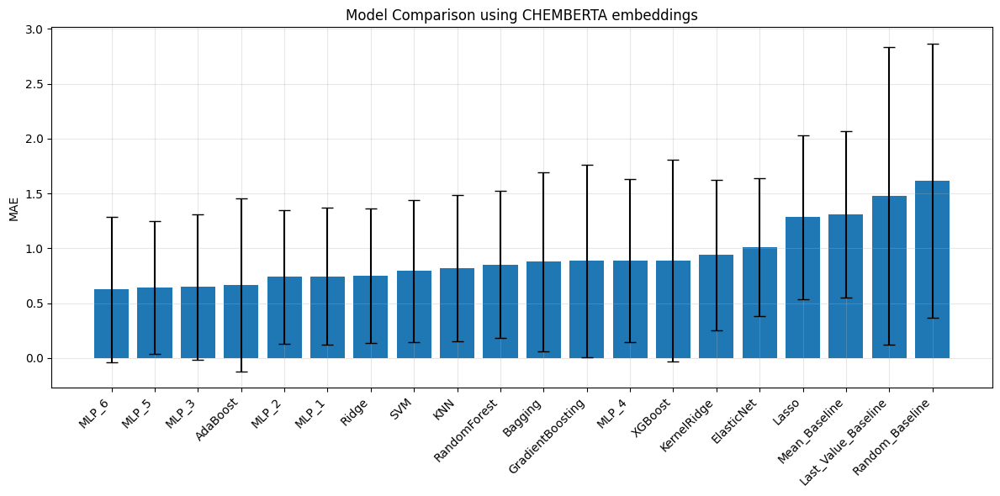


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
RandomForest         1.971287e+00  5.132029e+00    0.687752
XGBoost              2.029166e+00  5.192229e+00    0.576152
MLP_6                2.032876e+00  5.252294e+00    0.705061
SVM                  2.054527e+00  5.343892e+00    0.497729
Bagging              2.064953e+00  5.339617e+00    0.835636
GradientBoosting     2.082072e+00  5.355084e+00    0.736731
Ridge                2.097527e+00  5.112962e+00    0.844844
AdaBoost             2.245115e+00  5.233812e+00    1.081873
MLP_3                2.267569e+00  5.191287e+00    0.959901
MLP_5                2.292362e+00  5.219895e+00    0.976396
ElasticNet 

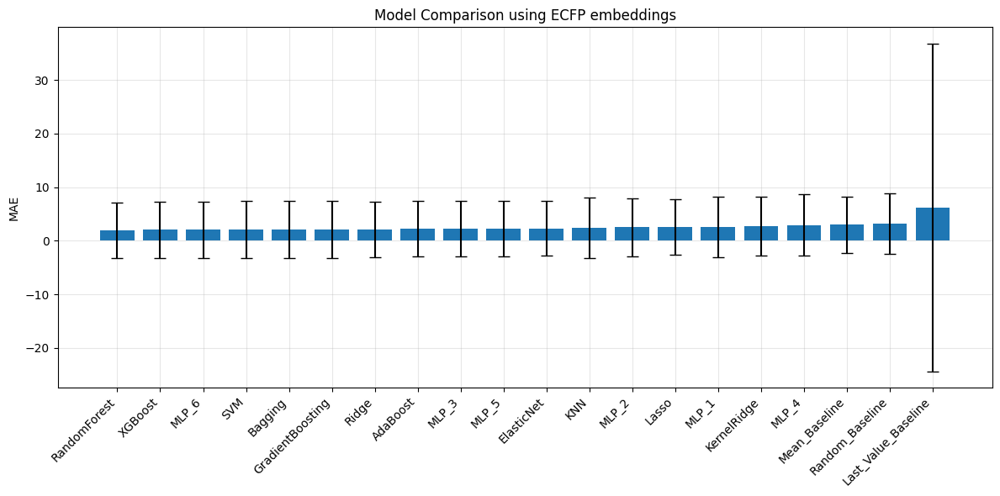

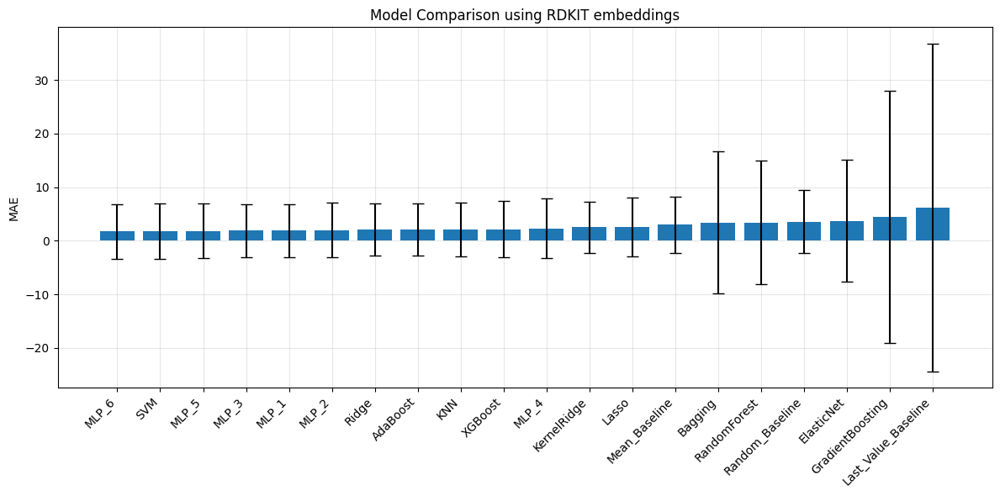

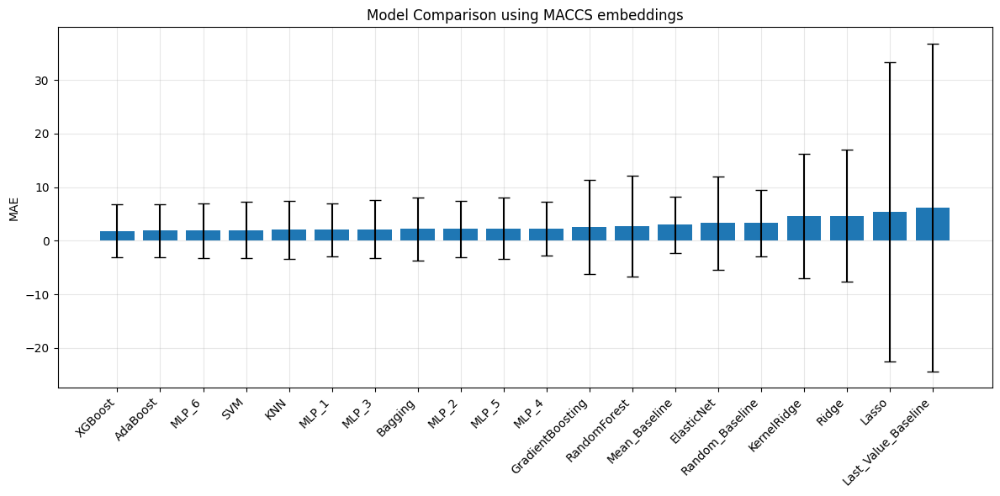

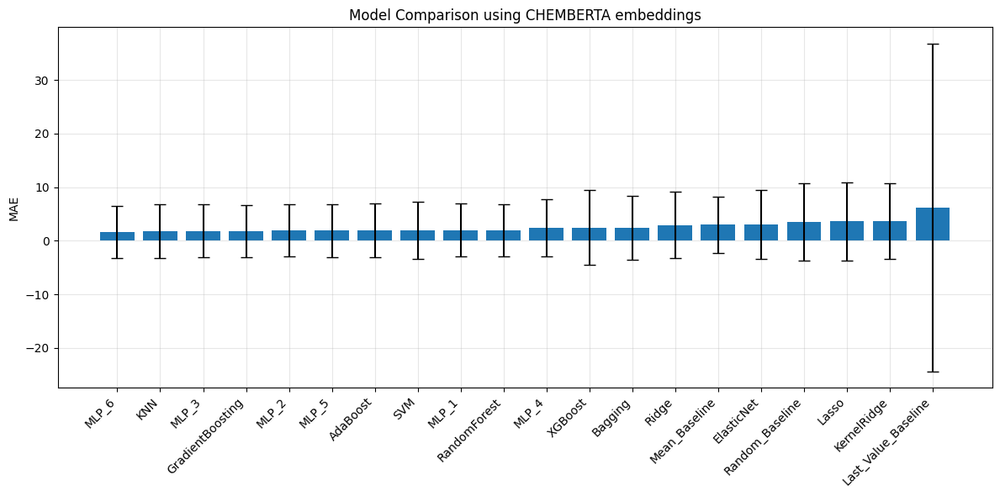


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
SVM                  9.188750e-01  1.396476e+00    0.730521
KNN                  1.025466e+00  1.532914e+00    0.633645
Bagging              1.201790e+00  1.996851e+00    0.599804
MLP_6                1.228618e+00  1.620012e+00    0.729730
RandomForest         1.245297e+00  2.098409e+00    0.663161
Mean_Baseline        1.319856e+00  1.355591e+00    1.117468
KernelRidge          1.321666e+00  1.756801e+00    0.798292
AdaBoost             1.330091e+00  3.122949e+00    0.696513
XGBoost              1.345509e+00  3.414221e+00    0.525257
Ridge                1.414583e+00  1.959240e+00    0.740564
ElasticNet 

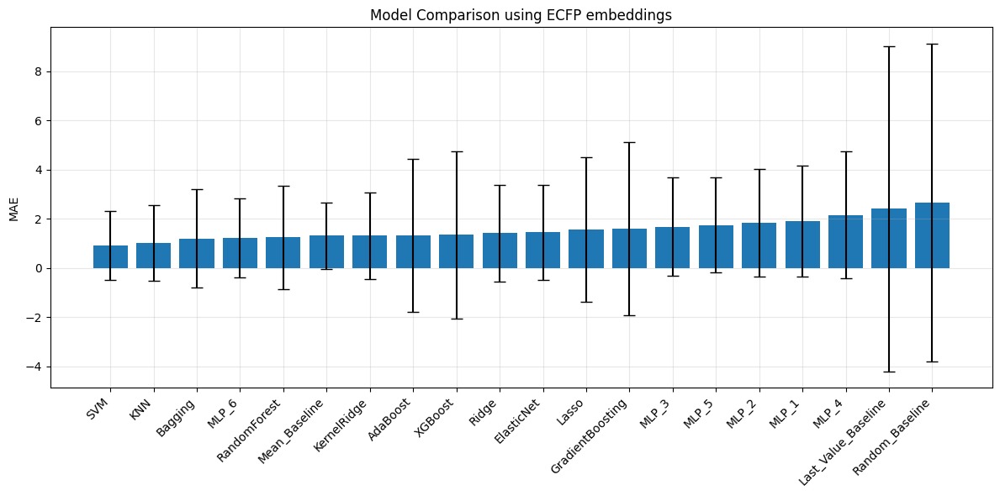

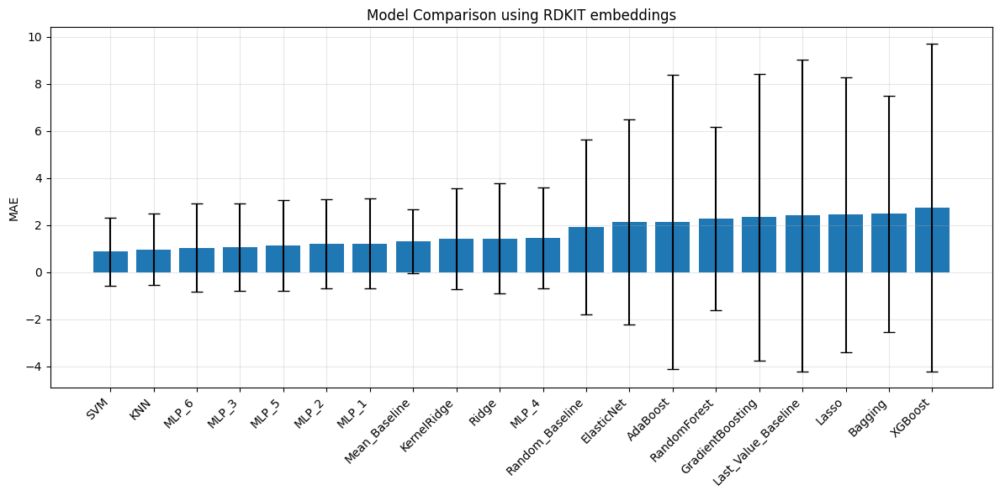

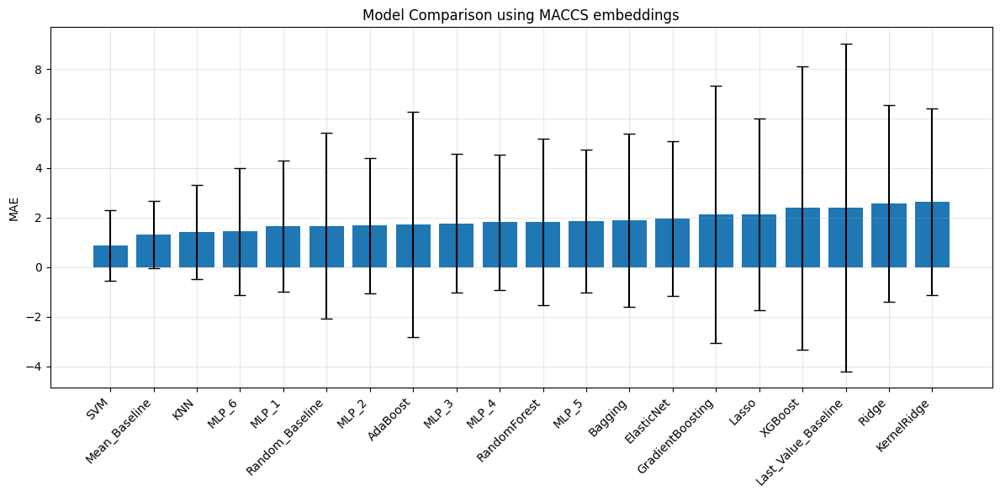

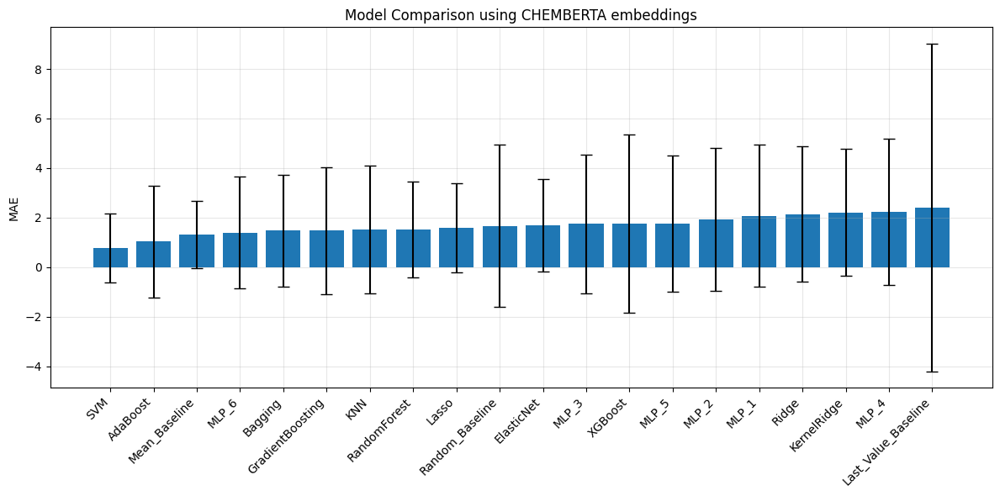


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                         Mean_MAE       Std_MAE  Median_MAE
RandomForest         3.902790e+00  1.050125e+01    0.788705
MLP_6                3.929414e+00  1.105445e+01    0.731221
Bagging              4.063906e+00  1.208615e+01    0.726690
XGBoost              4.072356e+00  1.128949e+01    0.440863
SVM                  4.196445e+00  1.174867e+01    0.553688
Ridge                4.197507e+00  1.016062e+01    1.056865
ElasticNet           4.227144e+00  1.026944e+01    1.375388
AdaBoost             4.242452e+00  1.104365e+01    1.376867
KNN                  4.519288e+00  1.190807e+01    0.706536
GradientBoosting     4.662302e+00  1.309274e+01    0.545744
Lasso      

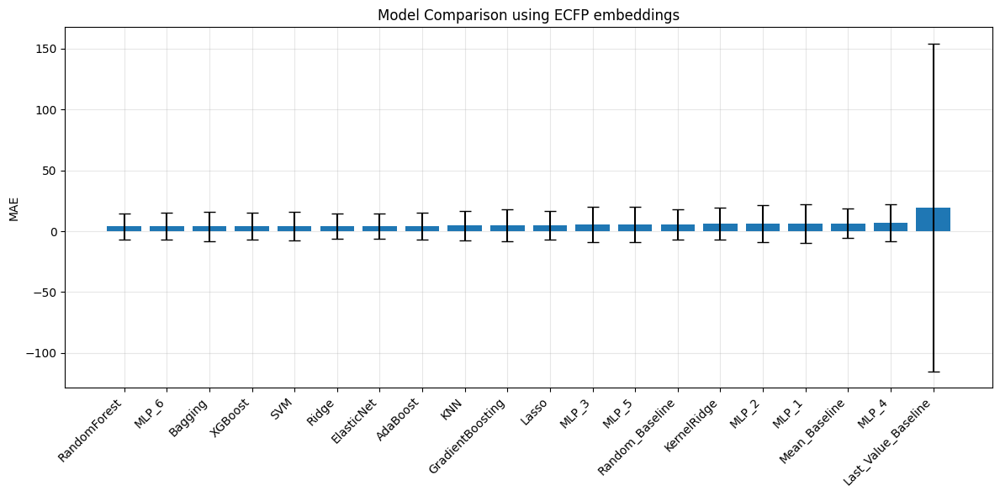

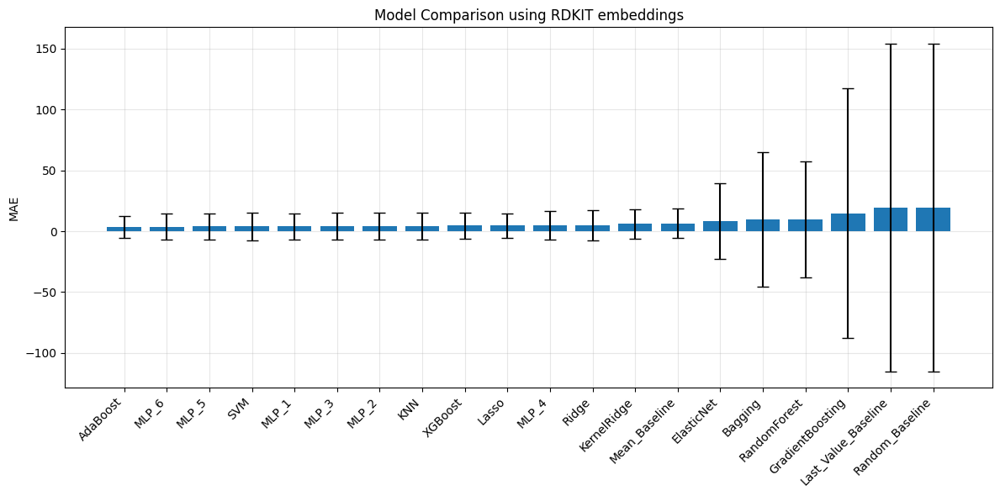

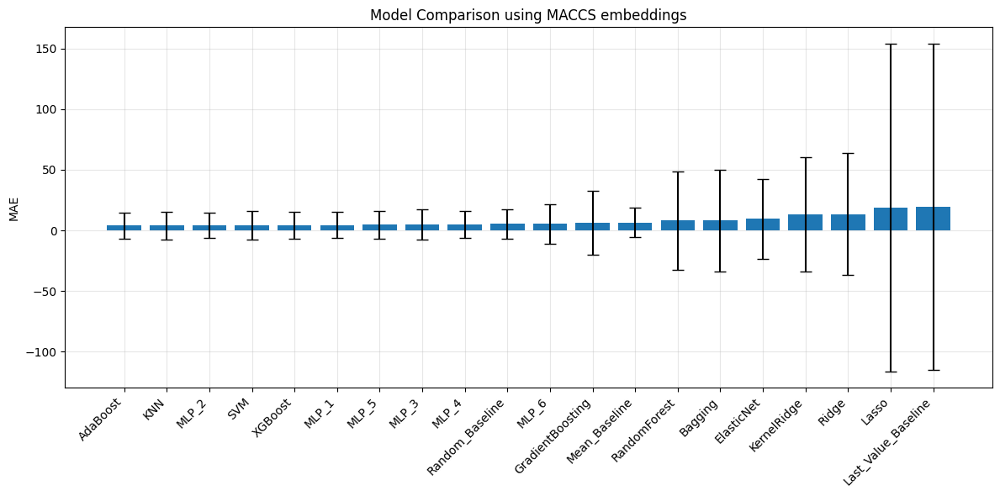

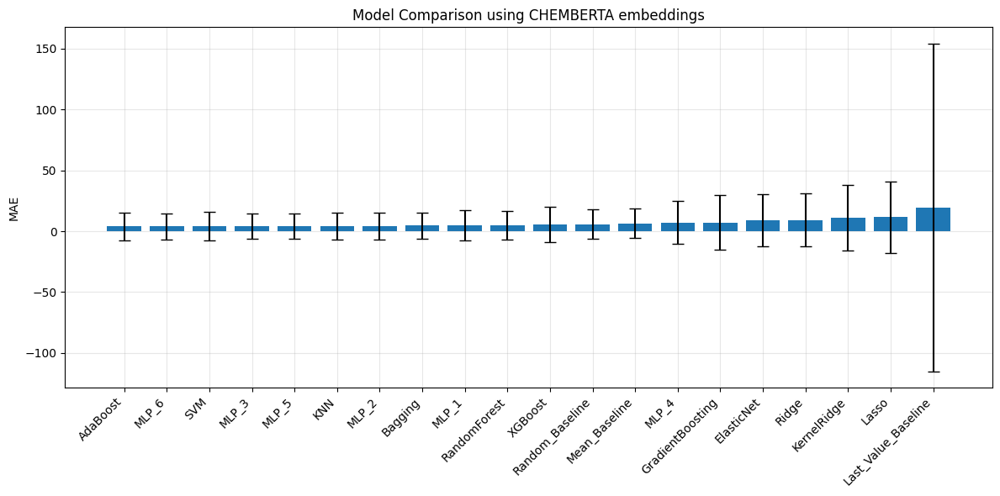


ECFP Results:

Running experiment with ecfp...
Processing iteration 10/100
Processing iteration 20/100
Processing iteration 30/100
Processing iteration 40/100
Processing iteration 50/100
Processing iteration 60/100
Processing iteration 70/100
Processing iteration 80/100
Processing iteration 90/100
Processing iteration 100/100
                     Mean_MAE   Std_MAE  Median_MAE
GradientBoosting     0.691729  1.605048    0.346700
RandomForest         0.740576  1.719465    0.367873
AdaBoost             0.761355  1.689248    0.437069
Bagging              0.768699  1.763828    0.321360
XGBoost              0.805330  1.771161    0.343950
KernelRidge          0.825928  1.764013    0.527670
Spline               0.925052  1.679276    0.558923
SVM                  0.925432  1.774655    0.623916
Linear               0.933130  1.671779    0.726871
Ridge                0.934115  1.669564    0.714882
MLP_6                0.969043  1.700869    0.718942
ElasticNet           1.020684  1.777777    0.76

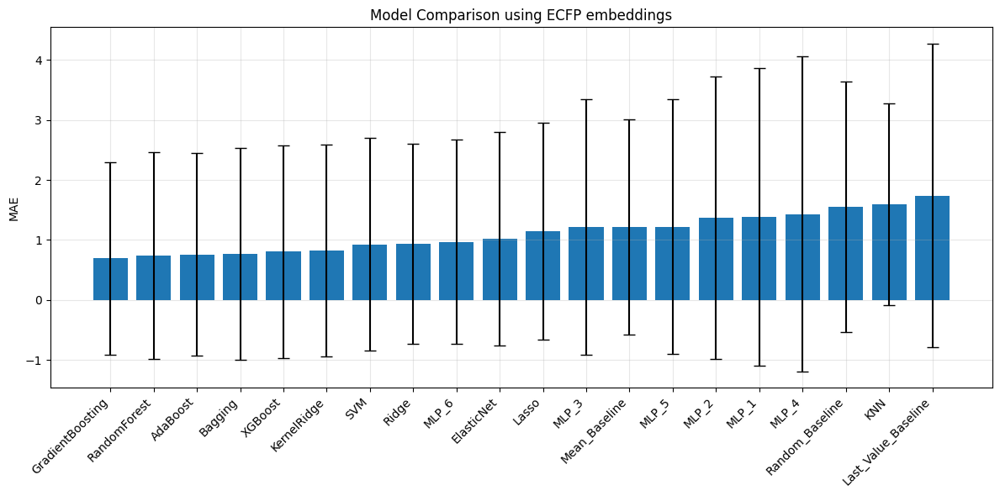

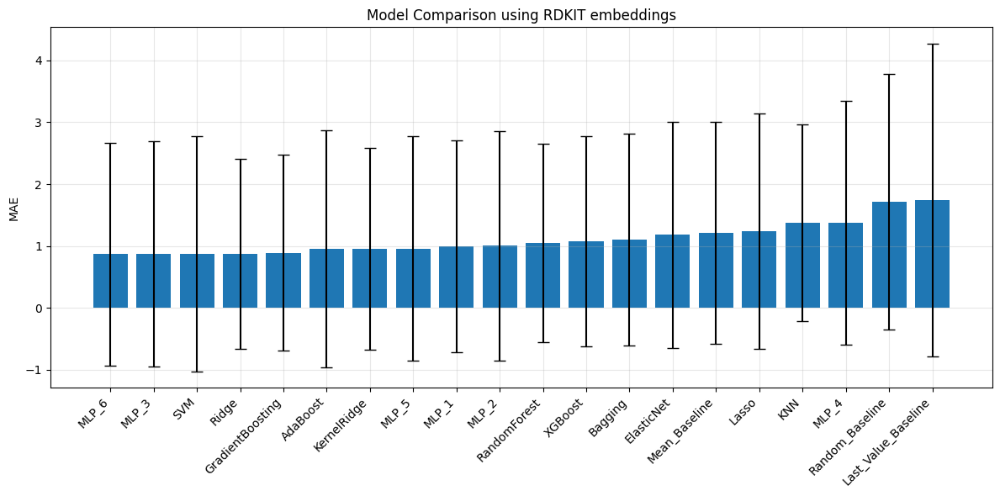

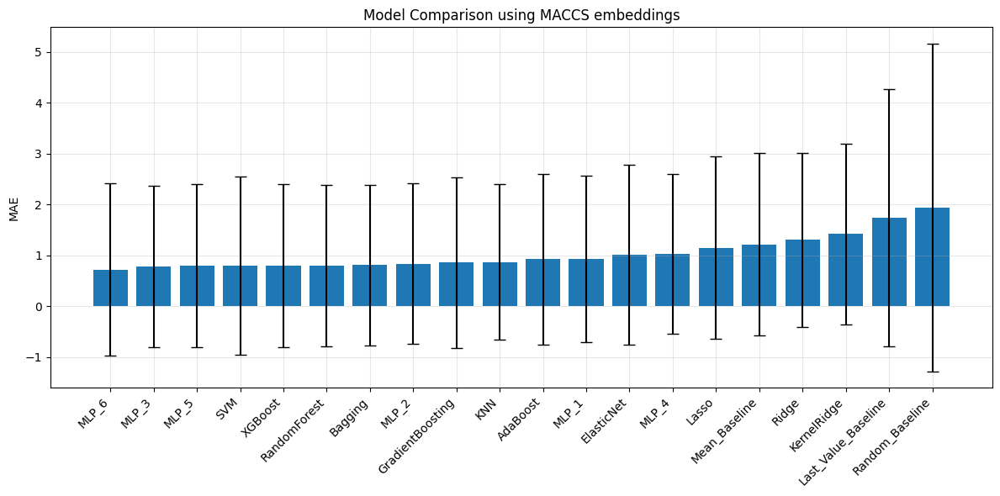

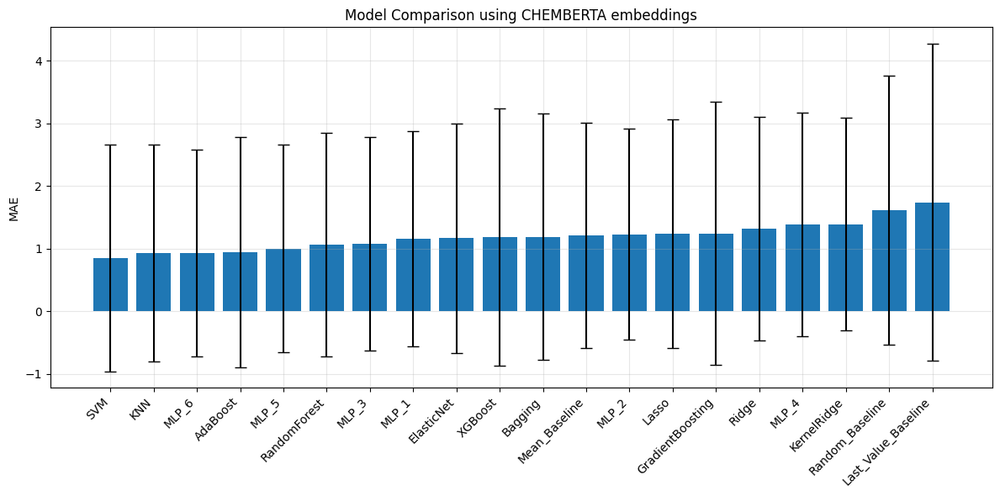

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

tasks = ['sq', 'lg', 'sn', 'ex']
prop_name = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']
file_name = ['mw', 'logp', 'tpsa', 'sp3', 'mr', 'bj', 'chi', 'hka']

for task in tasks:
    for i in range(8):
        # Run experiments for each embedding type
        results_dict = {}
        prop_task = f"{prop_name[i]}_{task}"
        for embedding in ['ecfp', 'rdkit', 'maccs', 'chemberta']:
            print(f"\n{embedding.upper()} Results:")
            results = run_experiment(embedding, prop_task)
            print(results)
            results_dict[embedding] = results

        def plot_model_comparison(results_dict, embedding_type):
            # Get data without Linear model
            results = results_dict[embedding_type]
            results = results[results.index != 'Linear']
            results = results[results.index != 'Spline']

            # Extract model names and metrics
            models = results.index.tolist()
            means = results['Mean_MAE'].values
            stds = results['Std_MAE'].values

            # Create plot
            plt.figure(figsize=(12, 6))
            bars = plt.bar(range(len(models)), means, yerr=stds, capsize=5)

            # Customize plot
            plt.xticks(range(len(models)), models, rotation=45, ha='right')
            plt.ylabel('MAE')
            plt.title(f'Model Comparison using {embedding_type.upper()} embeddings')
            plt.grid(True, alpha=0.3)

            # Adjust layout
            plt.tight_layout()
            plt.show()

        # Plot for each embedding type
        for embedding in ['ecfp', 'rdkit', 'maccs', 'chemberta']:::
            plot_model_comparison(results_dict, embedding)
        with open(f'../Results/results_dict_{task}{file_name[i]}.pkl', 'wb') as f:
            pickle.dump(results_dict, f)